In [1]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import io
from PIL import Image
import glob
import os
import pandas as pd
import matplotlib
matplotlib.style.use('dark_background')
import re
import seaborn as sns
import sys
from datetime import datetime, timedelta
sys.path.append('/Users/ang/Seafile/BSc_code/')
from functions import *
import h5py
import scipy
from scipy.spatial.distance import cdist

In [2]:
# Main processing loop for multiple files
pc = 'angela'
if pc == 'sophia':
    basevol='C:/Seafile/'
    basepath = basevol + '/BSc_data/'
    data_info = basepath + '/data_info/'
    output_folder = basepath + "/processed_data/"
    npz_directory = basepath + 'shark_tracking_data/'
    figures_path = basepath + "figures/"
    mat_file_path = basepath + 'carangids_manual_tracking/tracking/'
else:
    basevol = '/Users/ang/Seafile/'
    basepath = basevol + '/BSc_data/'
    data_info = basepath + '/data_info/'
    output_folder = basepath + "/processed_data/"
    npz_directory = basepath + 'shark_tracking_data/'
    figures_path = basepath + "figures/"
    mat_file_path = basepath + 'carangids_manual_tracking/tracking/'

### Define some columns lists

In [3]:
midpoints = [('headx', 'heady'),('btipx', 'btipy'), ('pelvicfinx', 'pelvicfiny'), ('sdfinx', 'sdfiny'), ('pedunclex', 'peduncley'), ('finx','finy'), ('ttipx', 'ttipy')]
midpoints_centered = [('centered_headx', 'centered_heady'),('centered_btipx', 'centered_btipy'), ('centered_pelvicfinx', 'centered_pelvicfiny'), ('centered_sdfinx', 'centered_sdfiny'), ('centered_pedunclex', 'centered_peduncley'), ('centered_finx','centered_finy'), ('centered_ttipx', 'centered_ttipy')]
midpoints_rotated = [('rotated_headx', 'rotated_heady'),('rotated_btipx', 'rotated_btipy'), ('rotated_pelvicfinx', 'rotated_pelvicfiny'), ('rotated_sdfinx', 'rotated_sdfiny'), ('rotated_pedunclex', 'rotated_peduncley'), ('rotated_finx','rotated_finy'), ('rotated_ttipx', 'rotated_ttipy')]
joints_to_plot = [f'angle_joint_{i}' for i in range(6)]

In [4]:
### List of the tracked files
file_filters = ["*DJI_0139*","*DJI_0305*","*125_DJI_0266*","*124_DJI_0266*","*DJI_0257*","*DJI_0242*","*DJI_0502*","*DJI_0253*"]
sharks_df_tmp = []
for file_filter in file_filters:
    files_list = np.sort(glob.glob(npz_directory + file_filter))
    
    # Check if there are no files
    if len(files_list) == 0:  
        print(f"No files found for {file_filter}")
        continue

    # Get the filename without extension and base filename
    filename_with_extension = os.path.basename(files_list[0])
    filename = os.path.splitext(filename_with_extension)[0]
    base_filename = filename.rsplit('_', 1)[0]
    sharks_df_tmp.append(pd.read_hdf(output_folder  + base_filename + "_sharks.h5", key='sharks'))
sharks_df = pd.concat(sharks_df_tmp,axis=0).reset_index()

In [5]:
sharks_df.groupby('Trial').count()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,finx,finy,ttipx,ttipy,X,Y,segment,tracklet,midpoint_x,midpoint_y
Trial,,,,,,,,,,,,,,,,,,,,,
sequence_20240303_060726300_DJI_0242,197469,114632,197469,0,0,114632,197469,197469,114465,114465,...,114604,114604,114605,114605,0,0,113028,113028,114481,114481
sequence_20240303_070126703_DJI_0257,230894,166351,230894,0,0,0,230894,230894,166349,166349,...,166351,166351,166351,166351,0,0,165235,165235,166351,166351
sequence_20240303_072831125_DJI_0266,192442,187205,192442,187205,187205,187205,192442,192442,187190,187190,...,187194,187194,187195,187195,187205,187205,186295,186295,187196,187196
sequence_20240305_063615511_DJI_0253,227596,107717,227596,0,0,0,227596,227596,107715,107715,...,107708,107708,107709,107709,0,0,107224,107224,107717,107717
sequence_20240305_070907124_DJI_0266,72302,55353,72302,55352,55352,55352,72302,72302,55343,55343,...,55335,55335,55335,55335,55352,55352,55211,55211,55337,55337
sequence_20240305_164039273_DJI_0305,142464,126593,142464,126593,126593,126593,142464,142464,126593,126593,...,126592,126592,126592,126592,126593,126593,125769,125769,126593,126593
sequence_20240306_161443984_DJI_0139,171891,103666,171891,103666,103666,103666,171891,171891,103644,103644,...,103666,103666,103666,103666,103666,103666,87630,87630,103644,103644
sequence_20240308_074843321_DJI_0502,125656,118178,125656,0,0,118178,125656,125656,118178,118178,...,118178,118178,118178,118178,0,0,117125,117125,118178,118178


### Read shark data

In [6]:
# sharks_df = pd.read_hdf(output_folder  + base_filename + "_sharks.h5", key='sharks')
df_sheets = pd.read_excel(basepath +'/data_info/Sharkfilesworkingwith.xlsx',sheet_name=[0, 1, 2, 3])

In [7]:

fps = 50
df_carangids=df_sheets[0]
df_drone=df_sheets[1]
dffiltered=df_sheets[2]
df_events=df_sheets[3]


In [8]:
# Function to convert time string to frames (treating 'hours' as minutes)
def time_to_frames(time_value, fps):
    if pd.isnull(time_value):  # Handle missing values
        return None
    
    try:
        if isinstance(time_value, str):
            # Always treat the first two components as minutes and seconds
            time_obj = datetime.strptime(time_value, "%H:%M:%S")
        else:  # If the input is already a time object
            time_obj = time_value
        
        # Treat 'hours' as minutes, calculate total seconds
        total_seconds = (time_obj.minute * 60) + time_obj.second
        return total_seconds * fps  # Convert total seconds to frames
    
    except Exception as e:
        print(f"Error converting {time_value}: {e}")
        return None  # Handle any errors during conversion

        
# Function to convert frames to time string (minutes:seconds)
def frames_to_time_string(frames, fps):
    if pd.isnull(frames) or frames is None:  # Handle missing values
        return None
    
    try:
        total_seconds = frames / fps
        hours = int(total_seconds // 3600)
        minutes = int((total_seconds % 3600) // 60)
        seconds = int(total_seconds % 60)
        # Return as a string formatted as "MM:SS"
        return f"{hours:02d}:{minutes:02d}:{seconds:02d}"
    
    except Exception as e:
        print(f"Error converting {frames}: {e}")
        return None

def convert_time_to_frames(df, fps):
    df['start_frame'] = df.apply(
        lambda row: row['start_frame'] if not pd.isnull(row['start_frame']) else time_to_frames(row['start_time (video)'], fps),
        axis=1)
    df['end_frame'] = df.apply(
        lambda row: row['end_frame'] if not pd.isnull(row['end_frame']) else time_to_frames(row['end_time (video)'], fps),
        axis=1)
    return df

def convert_frames_to_time(df, fps):
    df['start_time (video)'] = df.apply(
        lambda row: row['start_time (video)'] if not pd.isnull(row['start_time (video)']) else frames_to_time_string(row['start_frame'], fps),
        axis=1)
    df['end_time (video)'] = df.apply(
        lambda row: row['end_time (video)'] if not pd.isnull(row['end_time (video)']) else frames_to_time_string(row['end_frame'], fps),
        axis=1)
    return df

In [9]:
# Process all DataFrames in a loop
df_list = [df_carangids, df_drone, dffiltered]
for df in df_list:
    df = convert_time_to_frames(df, fps)
    df = convert_frames_to_time(df, fps)
    # print(df[['start_time (video)', 'end_time (video)', 'start_frame', 'end_frame']])


In [10]:
# sharks_df['carangids'] = 0
# sharks_df['drone_movement'] = 0
# sharks_df['ID_checked'] = 1

# for _, row in df_carangids.iterrows():
#     mask = (
#         (sharks_df['frame'].between(row['start_frame'], row['end_frame'])) &
#         (sharks_df['ID'] == row['sharkID_carangids']) &
#         (sharks_df['Trial'] == row['sequence_name'])
#     )
#     sharks_df.loc[mask, 'carangids'] = 1

# for _, row in df_drone.iterrows():
#     mask = (
#         (sharks_df['Trial'] == row['sequence_name']) &
#         (sharks_df['frame'].between(row['start_frame'], row['end_frame']))
#     )
#     sharks_df.loc[mask, ['drone_movement', 'ID_checked']] = row[['drone movement [0,1]', 'IDs checked [0,1]']]

# print(sharks_df[['frame', 'ID', 'carangids', 'Trial']])
# print(sharks_df.head())

In [11]:
sharks_df.shape

(1360714, 33)

In [12]:
# Initialize 'carangids' column to 0
sharks_df['carangids'] = 0

# Iterate through each row in df_carangids and apply conditions for each sequence
for _, row in df_carangids.iterrows():
    start, end = row['start_frame'], row['end_frame']
    target_id = row['sharkID_carangids']  # The specific ID from df_carangids
    sequence_name = row['sequence_name']  # The specific sequence from df_carangids

    # Update the mask: Check frame range, ID match, and sequence name
    mask = (
        (sharks_df['frame'] >= start) & 
        (sharks_df['frame'] <= end) & 
        (sharks_df['ID'] == target_id) &
        (sharks_df['Trial'] == sequence_name)  # Ensure matching sequence
    )

    # Apply 'carangids' = 1 where the mask is True
    sharks_df.loc[mask, 'carangids'] = 1

# Display the updated DataFrame
print(sharks_df[['frame', 'ID', 'carangids', 'Trial']])



# Add empty columns to sharks_df for the new data
sharks_df['drone_movement'] = 0
sharks_df['ID_checked'] = 1

# Iterate over each row in df_drone to apply values to sharks_df
for _, drone_row in df_drone.iterrows():
    # Get the sequence name and frame range from df_drone
    sequence = drone_row['sequence_name']
    start_frame = drone_row['start_frame']
    end_frame = drone_row['end_frame']
    drone_movement = drone_row['drone movement [0,1]']
    id_checked = drone_row['IDs checked [0,1]']
    
    # Update matching frames in sharks_df for the same trail and frame range
    mask = (
        (sharks_df['Trial'] == sequence) &
        (sharks_df['frame'] >= start_frame) &
        (sharks_df['frame'] <= end_frame)
    )
    
    # Assign the drone movement and ID checked values to the matching rows
    sharks_df.loc[mask, 'drone_movement'] = drone_movement
    sharks_df.loc[mask, 'ID_checked'] = id_checked

# Check the updated sharks_df
print(sharks_df.head())

         frame  ID  carangids                                 Trial
0            0   0          1  sequence_20240306_161443984_DJI_0139
1            1   0          1  sequence_20240306_161443984_DJI_0139
2            2   0          1  sequence_20240306_161443984_DJI_0139
3            3   0          1  sequence_20240306_161443984_DJI_0139
4            4   0          1  sequence_20240306_161443984_DJI_0139
...        ...  ..        ...                                   ...
1360709  58212   2          0  sequence_20240305_063615511_DJI_0253
1360710  58213   2          0  sequence_20240305_063615511_DJI_0253
1360711  58214   2          0  sequence_20240305_063615511_DJI_0253
1360712  58215   2          0  sequence_20240305_063615511_DJI_0253
1360713  58216   2          0  sequence_20240305_063615511_DJI_0253

[1360714 rows x 4 columns]
   index  SPEED#wcentroid  ID  X#pcentroid  Y#pcentroid     ANGLE  frame  \
0      0         0.000000   0  -597.556030    30.503662 -0.614673      0   
1   

In [13]:
for _, filter_row in dffiltered.iterrows():
    # Extract relevant information from df_filtered
    sequence_name = filter_row['sequence_name']
    start_frame = filter_row['start_frame']
    end_frame = filter_row['end_frame']
    id_checked = filter_row['IDs checked [0,1]']
    id_value = filter_row['ID']
    
    # Create a mask to match sharks_df with conditions
    mask = (
        (sharks_df['Trial'] == sequence_name) &   # Match sequence_name (trail)
        (sharks_df['frame'] >= start_frame) &      # Frame is within the range
        (sharks_df['frame'] <= end_frame) &        # Frame is within the range
        (sharks_df['ID'] == id_value)              # Match the ID
    )
    
    # Modify the 'ID_checked' column in sharks_df for the matching rows
    sharks_df.loc[mask, 'ID_checked'] = id_checked

# Display the updated sharks_df to check the results
print(print(sharks_df[['frame', 'ID', 'ID_checked', 'Trial']]))

         frame  ID  ID_checked                                 Trial
0            0   0         1.0  sequence_20240306_161443984_DJI_0139
1            1   0         1.0  sequence_20240306_161443984_DJI_0139
2            2   0         1.0  sequence_20240306_161443984_DJI_0139
3            3   0         1.0  sequence_20240306_161443984_DJI_0139
4            4   0         1.0  sequence_20240306_161443984_DJI_0139
...        ...  ..         ...                                   ...
1360709  58212   2         1.0  sequence_20240305_063615511_DJI_0253
1360710  58213   2         1.0  sequence_20240305_063615511_DJI_0253
1360711  58214   2         1.0  sequence_20240305_063615511_DJI_0253
1360712  58215   2         1.0  sequence_20240305_063615511_DJI_0253
1360713  58216   2         1.0  sequence_20240305_063615511_DJI_0253

[1360714 rows x 4 columns]
None


In [14]:
# Save sharks_df to HDF5
sharks_output_file = os.path.join(output_folder, "subset_sharks.h5")
sharks_df.to_hdf(sharks_output_file, key='sharks', mode='w')
print(f"Shark data saved to {sharks_output_file}")

Shark data saved to /Users/ang/Seafile//BSc_data//processed_data/subset_sharks.h5


In [15]:
sharks_df.shape

(1360714, 36)

In [16]:
sharks_df.head()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,X,Y,segment,Trial,tracklet,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked
0,0,0.000000,0,-597.556030,30.503662,-0.614673,0,0.00,1982.000000,1478.000000,...,-597.556030,30.503662,1.0,sequence_20240306_161443984_DJI_0139,1.0,1950.000000,1502.000,1,1,1.0
1,1,246.525452,0,-601.888000,31.994019,-0.616159,1,0.01,1976.500000,1479.500000,...,-601.888000,31.994019,1.0,sequence_20240306_161443984_DJI_0139,1.0,1945.500000,1502.750,1,1,1.0
2,2,301.757548,0,-605.915649,33.496460,-0.620030,2,0.02,1972.333333,1480.333333,...,-605.915649,33.496460,1.0,sequence_20240306_161443984_DJI_0139,1.0,1941.666667,1503.500,1,1,1.0
3,3,317.241776,0,-609.988617,34.644623,-0.621046,3,0.03,1968.000000,1481.500000,...,-609.988617,34.644623,1.0,sequence_20240306_161443984_DJI_0139,1.0,1937.500000,1504.625,1,1,1.0
4,4,339.523218,0,-613.667163,35.803613,-0.629249,4,0.04,1963.800000,1482.400000,...,-613.667163,35.803613,1.0,sequence_20240306_161443984_DJI_0139,1.0,1933.500000,1505.700,1,1,1.0


### Plot random trajectories

In [17]:
sharks_df.groupby(['Trial', 'ID']).count()

index  SPEED#wcentroid  X#pcentroid  \
Trial                                ID                                        
sequence_20240303_060726300_DJI_0242 0   32889            18134            0   
                                     1   32929            32009            0   
                                     2   32951            14923            0   
                                     3   32943            15242            0   
                                     4   32845            15668            0   
                                     5   32912            18656            0   
sequence_20240303_070126703_DJI_0257 0   72888            61389            0   
                                     1   74898            54515            0   
                                     2   39643            25610            0   
                                     3   43465            24837            0   
sequence_20240303_072831125_DJI_0266 0   44873            43482        43482   
                                     1   52380            51867        51867   
                                     2   43824            43362        43362   
                                     3   51365            48494        48494   
sequence_20240305_063615511_DJI_0253 0   89806            61328            0   
                                     1   82756            32313            0   
                                     2   55034            14076            0   
sequence_20240305_070907124_DJI_0266 0   26637            14042        14041   
                                     1   45665            41311        41311   
sequence_20240305_164039273_DJI_0305 0   47488            46331        46331   
                                     1   47488            38273        38273   
                                     2   47488            41989        41989   
sequence_20240306_161443984_DJI_0139 0   85948            54082        54082   
                                     1   85943            49584        49584   
sequence_20240308_074843321_DJI_0502 0   86813            82553            0   
                                     1   38843            35625            0   

                                         Y#pcentroid  ANGLE  frame   time  \
Trial                                ID                                     
sequence_20240303_060726300_DJI_0242 0             0  18134  32889  32889   
                                     1             0  32009  32929  32929   
                                     2             0  14923  32951  32951   
                                     3             0  15242  32943  32943   
                                     4             0  15668  32845  32845   
                                     5             0  18656  32912  32912   
sequence_20240303_070126703_DJI_0257 0             0      0  72888  72888   
                                     1             0      0  74898  74898   
                                     2             0      0  39643  39643   
                                     3             0      0  43465  43465   
sequence_20240303_072831125_DJI_0266 0         43482  43482  44873  44873   
                                     1         51867  51867  52380  52380   
                                     2         43362  43362  43824  43824   
                                     3         48494  48494  51365  51365   
sequence_20240305_063615511_DJI_0253 0             0      0  89806  89806   
                                     1             0      0  82756  82756   
                                     2             0      0  55034  55034   
sequence_20240305_070907124_DJI_0266 0         14041  14041  26637  26637   
                                     1         41311  41311  45665  45665   
sequence_20240305_164039273_DJI_0305 0         46331  46331  47488  47488   
                                     1         38273  38273  47488  47488   
                             

In [18]:
sharks_df_filtered = sharks_df[(sharks_df['ID_checked'] == 1) & (sharks_df['drone_movement'] == 0)]

In [19]:
frame_counts = sharks_df_filtered.groupby('Trial')['frame'].nunique()
#435257
print(frame_counts)

Trial
sequence_20240303_060726300_DJI_0242    29944
sequence_20240303_070126703_DJI_0257    44983
sequence_20240303_072831125_DJI_0266    48668
sequence_20240305_063615511_DJI_0253    77492
sequence_20240305_070907124_DJI_0266    55036
sequence_20240305_164039273_DJI_0305    45785
sequence_20240306_161443984_DJI_0139    63657
sequence_20240308_074843321_DJI_0502    69692
Name: frame, dtype: int64


In [20]:
frame_counts = sharks_df.groupby('Trial')['frame'].nunique()
#435257
print(frame_counts)

Trial
sequence_20240303_060726300_DJI_0242    32951
sequence_20240303_070126703_DJI_0257    74898
sequence_20240303_072831125_DJI_0266    52380
sequence_20240305_063615511_DJI_0253    90510
sequence_20240305_070907124_DJI_0266    60799
sequence_20240305_164039273_DJI_0305    47488
sequence_20240306_161443984_DJI_0139    85948
sequence_20240308_074843321_DJI_0502    86813
Name: frame, dtype: int64


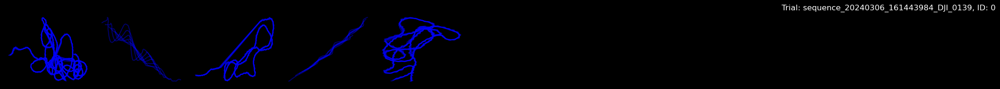

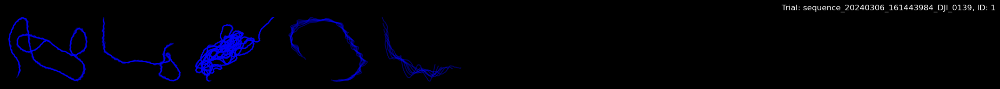

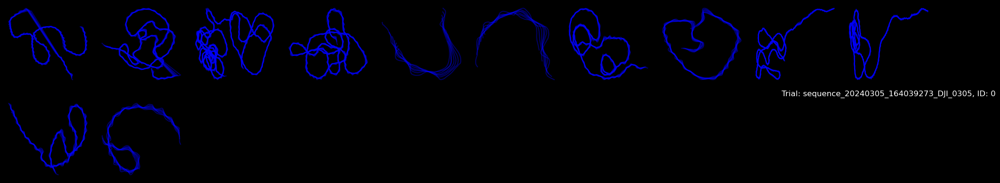

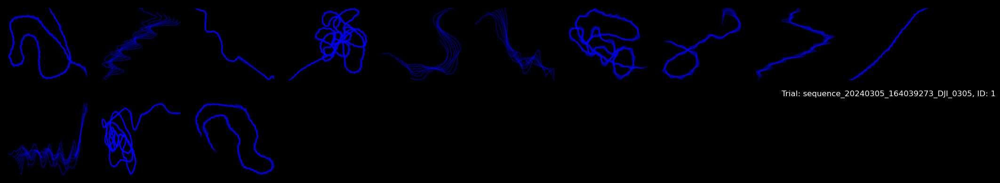

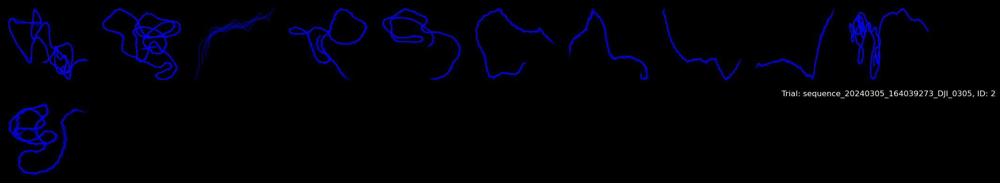

...

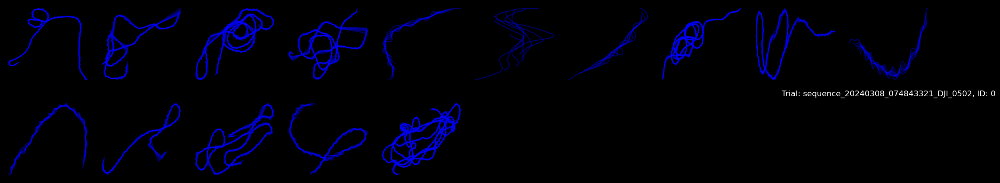

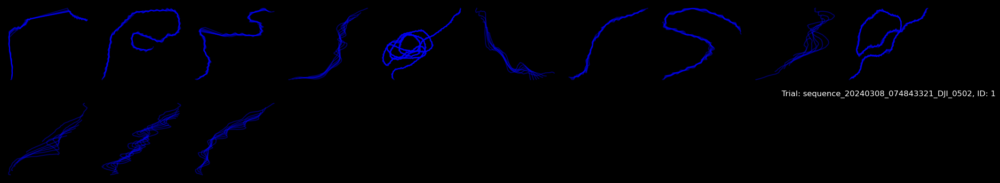

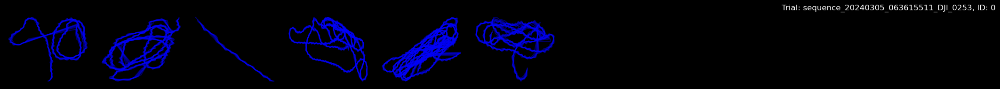

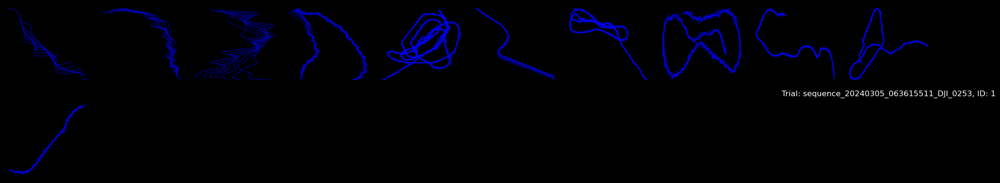

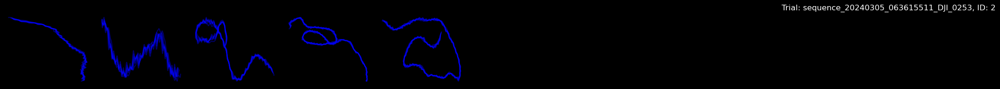

In [21]:
# Get all unique IDs in the dataset
#unique_sequence = sharks_df['Trial'].unique()
for trial in sharks_df_filtered.Trial.unique():
    onetrial = sharks_df_filtered[sharks_df_filtered['Trial'] == trial]
    unique_ids = onetrial['ID'].unique()
    for current_id in unique_ids:
        # Filter data for the current ID
        onef = onetrial[onetrial['ID'] == current_id]
        
        # Filter segments that have more than 100 frames
        segment_counts = onef['segment'].value_counts()
        segments_to_plot = np.sort(segment_counts[segment_counts > 100].index)
    
        # If no segments have more than 100 frames, skip this ID
        if len(segments_to_plot) == 0:
            continue
    
        # Define the number of subplots (adjust rows and columns based on the number of valid segments)
        num_segments = len(segments_to_plot)
        num_rows = (num_segments // 10) + 1
        fig, axes = plt.subplots(num_rows, 10, figsize=(20, num_rows * 2))
        
        # Flatten axes to easily iterate
        axes = axes.flatten()
    
        # Loop through the valid segments and plot in subplots
        for idx, (ax, segment) in enumerate(zip(axes, segments_to_plot)):
            # Filter data for the current segment
            short = onef[onef['segment'] == segment]
            
            # Loop through midpoints (assuming it is defined as pairs of x_col and y_col)
            for i, (x_col, y_col) in enumerate(midpoints):
                ax.plot(short[x_col], short[y_col], color="blue", alpha=0.4)
                

            # Optionally set a title with the segment information
            
            ax.axis('off')
    
        # Hide any unused subplots if necessary
        for ax in axes[len(segments_to_plot):]:
            ax.axis('off')
        ax.set_title(f"Trial: {trial}, ID: {current_id}")
        # Adjust the layout and show the plot for the current ID
        plt.tight_layout()
        plt.show()


### Check n of frames in each segment and each shark ID


In [22]:
# sharks_df_filtered.groupby(['ID','Trial']).count()

### Now calculate pairwise distance and NN distance 

In [52]:
### This one includes only frames where drone doesn't move
subset = sharks_df_filtered[['ID', 'frame', 'midpoint_x', 'midpoint_y', 'carangids', 'Trial','tracklet','segment']]

In [53]:
sharks_df_filtered.head()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,X,Y,segment,Trial,tracklet,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked
2051,2051,82.087409,0,606.844014,-396.939687,-0.435146,2051,40.91,3172.583333,1069.333333,...,606.844014,-396.939687,1.0,sequence_20240306_161443984_DJI_0139,1.0,3147.875000,1082.916667,1,0,1.0
2052,2052,76.964699,0,608.723694,-396.273295,-0.456252,2052,40.93,3174.333333,1068.916667,...,608.723694,-396.273295,1.0,sequence_20240306_161443984_DJI_0139,1.0,3149.708333,1083.125000,1,0,1.0
2053,2053,75.903308,0,610.451965,-395.569743,-0.479337,2053,40.95,3175.916667,1068.416667,...,610.451965,-395.569743,1.0,sequence_20240306_161443984_DJI_0139,1.0,3151.458333,1083.250000,1,0,1.0
2054,2054,71.775297,0,612.184855,-394.984894,-0.500498,2054,40.97,3177.416667,1067.916667,...,612.184855,-394.984894,1.0,sequence_20240306_161443984_DJI_0139,1.0,3153.125000,1083.333333,1,0,1.0
2055,2055,81.043147,0,613.870341,-394.378459,-0.521608,2055,40.99,3178.833333,1067.500000,...,613.870341,-394.378459,1.0,sequence_20240306_161443984_DJI_0139,1.0,3154.750000,1083.416667,1,0,1.0


In [54]:
# # Step 1: Initialize an empty DataFrame to collect results across sequences
# all_results = pd.DataFrame()

# # Iterate over each unique trial sequence
# for trial in subset['Trial'].unique():
#     # Filter the subset to the current trial
#     trial_subset = subset[subset['Trial'] == trial]
    
#     # Prepare necessary variables for this specific trial
#     fishlist = np.unique(trial_subset["ID"].values)
#     maxframe = len(np.unique(trial_subset["frame"].values))
#     num_individuals = len(fishlist)
    
#     # Initialize arrays for pairwise distances, nearest neighbor indices, and minimum distances
#     pairwise_df = np.zeros((num_individuals, num_individuals, maxframe))
#     nearest_neighbors = np.full((num_individuals, maxframe), -1, dtype=int)
#     mindist = np.full((num_individuals, maxframe), np.nan)
    
#     # Collect all unique frames in the trial and create a dictionary to store aligned coordinates
#     all_frames = np.unique(trial_subset["frame"].values)
#     aligned_coords = {}

#     # Align frames for each fish (set coordinates to NaN for missing frames)
#     for ixff, fish in enumerate(fishlist):
#         ff_ = trial_subset[trial_subset["ID"] == fish].set_index("frame").reindex(all_frames)
#         aligned_coords[fish] = np.vstack((ff_["midpoint_x"].values, ff_["midpoint_y"].values)).T

#     # Step 3: Calculate pairwise distances across all frames for the current trial
#     for ixff, fish in enumerate(fishlist):
#         for ixnf, nf in enumerate(fishlist):
#             if fish != nf:
#                 # Calculate pairwise distances only for frames where both have coordinates
#                 valid_mask = ~np.isnan(aligned_coords[fish][:, 0]) & ~np.isnan(aligned_coords[nf][:, 0])
#                 distances = np.full(maxframe, np.nan)
                
#                 # Compute distance for valid frames
#                 distances[valid_mask] = np.linalg.norm(
#                     aligned_coords[fish][valid_mask] - aligned_coords[nf][valid_mask], axis=1
#                 )
#                 pairwise_df[ixff, ixnf, :] = distances

#     # Step 4: Handle NaN values by setting diagonal and applying mask across frames
#     for i in range(maxframe):
#         np.fill_diagonal(pairwise_df[:, :, i], np.nan)  # Ignore self distances
    
#     # Calculate the all-NaN mask across frames for the current trial
#     all_nan_mask = np.all(np.isnan(pairwise_df), axis=2)
#     for i in range(maxframe):
#         pairwise_df[:, :, i][all_nan_mask] = np.nan  # Keep NaN if all neighbors are NaN

#     # Step 5: Compute nearest neighbor and distance
#     for i in range(pairwise_df.shape[2]):
#         # Set diagonal to np.nan to ignore distances to self
#         temp_matrix = pairwise_df[:, :, i].copy()
#         np.fill_diagonal(temp_matrix, np.nan)

#         # Find the index of the minimum (nearest neighbor) for each fish (excluding itself)
#         valid_mask = ~np.isnan(temp_matrix).all(axis=1)  # mask for non-NaN rows
        
#         if np.any(valid_mask):
#             nearest_neighbors[valid_mask, i] = np.nanargmin(temp_matrix[valid_mask], axis=1)
#             mindist[valid_mask, i] = np.nanmin(temp_matrix[valid_mask], axis=1)
    
#     # Step 6: Create a DataFrame with nearest neighbor information for the current trial
#     trial_results_df = pd.DataFrame({
#         "ID": np.repeat(fishlist, maxframe),
#         "frame": np.tile(all_frames, num_individuals),
#         "nearest_neighbor": fishlist[nearest_neighbors.flatten()],
#         "nn_distance": mindist.flatten(),
#         "Trial": trial  # Add the Trial column to identify sequences
#     })

#     # Step 7: If the nearest neighbor distance is NaN, set it to the fish's own ID (in case of missing data)
#     trial_results_df["nearest_neighbor"] = np.where(
#         trial_results_df["nn_distance"].isna(), trial_results_df["ID"], trial_results_df["nearest_neighbor"]
#     )

#     # Append the results for this trial to the all_results DataFrame
#     all_results = pd.concat([all_results, trial_results_df], ignore_index=True)

# # Drop any existing 'nearest_neighbor' and 'nn_distance' columns before merging to avoid duplicates
# subset = subset.drop(columns=["nearest_neighbor", "nn_distance"], errors='ignore')

# # Step 8: Merge all_results back into subset
# subset = pd.merge(subset, all_results, on=["ID", "frame", "Trial"], how="left")

# # Display the result
# # print(subset)

In [58]:
# Step 1: Initialize an empty DataFrame to collect results across sequences
all_results = pd.DataFrame()

# Iterate over each unique trial sequence
for trial in subset['Trial'].unique():
    # Filter the subset to the current trial
    trial_subset = subset[subset['Trial'] == trial]
    
    # Prepare necessary variables for this specific trial
    fishlist = np.unique(trial_subset["ID"].values)
    all_frames = np.unique(trial_subset["frame"].values)
    maxframe = len(all_frames)
    num_individuals = len(fishlist)
    
    # Initialize arrays for pairwise distances, nearest neighbor indices, and minimum distances
    pairwise_df = np.zeros((num_individuals, num_individuals, maxframe))
    nearest_neighbors = np.full((num_individuals, maxframe), -1, dtype=int)
    mindist = np.full((num_individuals, maxframe), np.nan)
    
    # Align frames for each fish (set coordinates to NaN for missing frames)
    aligned_coords = {}
    for ixff, fish in enumerate(fishlist):
        # Reindex so that every frame is present; missing frames become NaN
        ff_ = trial_subset[trial_subset["ID"] == fish].set_index("frame").reindex(all_frames)
        aligned_coords[fish] = np.vstack((ff_["midpoint_x"].values, ff_["midpoint_y"].values)).T

    # Step 3: Calculate pairwise distances across all frames for the current trial
    for ixff, fish in enumerate(fishlist):
        for ixnf, nf in enumerate(fishlist):
            if fish != nf:
                # Calculate pairwise distances only for frames where both have coordinates
                valid_mask = ~np.isnan(aligned_coords[fish][:, 0]) & ~np.isnan(aligned_coords[nf][:, 0])
                distances = np.full(maxframe, np.nan)
                distances[valid_mask] = np.linalg.norm(
                    aligned_coords[fish][valid_mask] - aligned_coords[nf][valid_mask], axis=1
                )
                pairwise_df[ixff, ixnf, :] = distances

    # Step 4: Handle NaN values by setting the diagonal and applying mask across frames
    for i in range(maxframe):
        np.fill_diagonal(pairwise_df[:, :, i], np.nan)  # Ignore self distances
    all_nan_mask = np.all(np.isnan(pairwise_df), axis=2)
    for i in range(maxframe):
        pairwise_df[:, :, i][all_nan_mask] = np.nan

    # Step 5: Compute nearest neighbor and distance for each frame
    for i in range(pairwise_df.shape[2]):
        temp_matrix = pairwise_df[:, :, i].copy()
        np.fill_diagonal(temp_matrix, np.nan)  # Ignore self distances
        valid_mask = ~np.isnan(temp_matrix).all(axis=1)  # Only for rows with at least one valid neighbor
        if np.any(valid_mask):
            nearest_neighbors[valid_mask, i] = np.nanargmin(temp_matrix[valid_mask], axis=1)
            mindist[valid_mask, i] = np.nanmin(temp_matrix[valid_mask], axis=1)
    
    # Step 6: Create a DataFrame with nearest neighbor information for the current trial
    trial_results_df = pd.DataFrame({
        "ID": np.repeat(fishlist, maxframe),
        "frame": np.tile(all_frames, num_individuals),
        "nearest_neighbor": fishlist[nearest_neighbors.flatten()],
        "nn_distance": mindist.flatten(),
        "Trial": trial  # Identify the trial sequence
    })
    
    # Step 7: For rows with missing nn_distance, set nearest_neighbor to the fish's own ID
    # trial_results_df["nearest_neighbor"] = np.where(
    #     trial_results_df["nn_distance"].isna(), trial_results_df["ID"], trial_results_df["nearest_neighbor"]
    # )
    # Step 7: If nn_distance is NaN, also set nearest_neighbor to NaN
    trial_results_df.loc[trial_results_df["nn_distance"].isna(), "nearest_neighbor"] = np.nan

    # **Filter to keep only rows that actually exist in the original trial_subset**
    # Extract the unique (ID, frame, Trial) combinations from the original data
    trial_keys = trial_subset[['ID', 'frame', 'Trial']].drop_duplicates()
    trial_results_df = pd.merge(trial_keys, trial_results_df, on=['ID', 'frame', 'Trial'], how='inner')
    
    # Append the results for this trial to the all_results DataFrame
    all_results = pd.concat([all_results, trial_results_df], ignore_index=True)

# Now, merge all_results back into the original subset without needing to drop extra columns
df_nndist = pd.merge(subset, all_results, on=["ID", "frame", "Trial"], how="left")


In [59]:
df_nndist.shape

(1083506, 10)

In [60]:
t242 = df_nndist[df_nndist['Trial']=='sequence_20240303_060726300_DJI_0242']

In [61]:
oneframe =t242[t242['frame']==3044]

In [62]:
oneframe

,ID,frame,midpoint_x,midpoint_y,carangids,Trial,tracklet,segment,nearest_neighbor,nn_distance
613647,0,3044,2334.125000,1539.041667,0,sequence_20240303_060726300_DJI_0242,1.0,1.0,3.0,177.804361
643591,1,3044,1924.250000,951.208333,0,sequence_20240303_060726300_DJI_0242,75.0,1.0,0.0,716.620920
673535,2,3044,3033.000000,984.708333,0,sequence_20240303_060726300_DJI_0242,143.0,5.0,4.0,641.328949
703479,3,3044,2311.625000,1715.416667,0,sequence_20240303_060726300_DJI_0242,199.0,1.0,0.0,177.804361
733317,4,3044,2586.333333,1444.916667,0,sequence_20240303_060726300_DJI_0242,240.0,1.0,0.0,269.199850
763261,5,3044,4195.002970,1106.330358,0,sequence_20240303_060726300_DJI_0242,NaN,NaN,2.0,1168.350470


In [127]:
df_nndist[df_nndist['tracklet']==40]

,ID,frame,midpoint_x,midpoint_y,carangids,Trial,tracklet,segment,nearest_neighbor,nn_distance
142570,1,7793,47.312500,2508.312500,0,sequence_20240305_164039273_DJI_0305,40.0,15.0,2.0,3208.397497
142571,1,7794,45.729167,2508.520833,0,sequence_20240305_164039273_DJI_0305,40.0,15.0,2.0,3208.319238
142572,1,7795,44.312500,2508.729167,0,sequence_20240305_164039273_DJI_0305,40.0,15.0,2.0,3208.127410
142573,1,7796,42.770833,2508.937500,0,sequence_20240305_164039273_DJI_0305,40.0,15.0,2.0,3208.238882
142574,1,7797,41.062500,2509.020833,0,sequence_20240305_164039273_DJI_0305,40.0,15.0,2.0,3208.429465
862334,1,24287,1904.695251,57.904130,0,sequence_20240308_074843321_DJI_0502,40.0,4.0,0.0,1708.011785


In [131]:
# Count the number of visible sharks per frame where midpoint_x is NOT NaN
shark_count_per_frame = (
    df_nndist[df_nndist["midpoint_x"].notna()]
    .groupby(["Trial","frame",'segment'])["ID"]
    .count()
    .reset_index()
)
# Rename column for clarity
shark_count_per_frame.rename(columns={"ID": "visible_sharks"}, inplace=True)


In [132]:
sb = shark_count_per_frame[shark_count_per_frame['Trial']=='sequence_20240303_060726300_DJI_0242']

In [133]:
shark_count_per_frame

,Trial,frame,segment,visible_sharks
0,sequence_20240303_060726300_DJI_0242,0,1.0,5
1,sequence_20240303_060726300_DJI_0242,1,1.0,5
2,sequence_20240303_060726300_DJI_0242,2,1.0,5
3,sequence_20240303_060726300_DJI_0242,3,1.0,5
4,sequence_20240303_060726300_DJI_0242,4,1.0,5
...,...,...,...,...
764589,sequence_20240308_074843321_DJI_0502,88018,36.0,1
764590,sequence_20240308_074843321_DJI_0502,88019,36.0,1
764591,sequence_20240308_074843321_DJI_0502,88020,36.0,1
764592,sequence_20240308_074843321_DJI_0502,88021,36.0,1


In [134]:
def fill_short_gaps(df, max_gap=4):
    for trial in df['Trial'].unique():
        trial_df = df[df['Trial'] == trial]
        
        for tracklet in trial_df['segment'].dropna().unique():
            tracklet_df = trial_df[trial_df['segment'] == tracklet]
            
            values = tracklet_df['visible_sharks'].values
            for i in range(1, len(values) - 1):
                if (values[i] != values[i - 1] and values[i] != values[i + 1] and
                    values[i - max_gap:i].tolist().count(values[i - 1]) == max_gap and
                    values[i + 1:i + 1 + max_gap].tolist().count(values[i + 1]) == max_gap):
                    values[i] = values[i - 1]
            
            df.loc[tracklet_df.index, 'visible_sharks'] = values
    
    return df


In [146]:
for trial in shark_count_per_frame['Trial'].unique():
    trial_df = shark_count_per_frame[shark_count_per_frame['Trial'] == trial]
    
    for tracklet in trial_df['segment'].dropna().unique():
        tracklet_df = trial_df[trial_df['segment'] == tracklet]
        
        values = tracklet_df['visible_sharks'].values
        for i in range(1, len(values) - 1):
            if (values[i] != values[i - 1] and values[i] != values[i + 1] and
                values[i - max_gap:i].tolist().count(values[i - 1]) == max_gap and
                values[i + 1:i + 1 + max_gap].tolist().count(values[i + 1]) == max_gap):
                values[i] = values[i - 1]
        
        shark_count_per_frame.loc[tracklet_df.index, 'visible_sharks'] = values
        break
    break

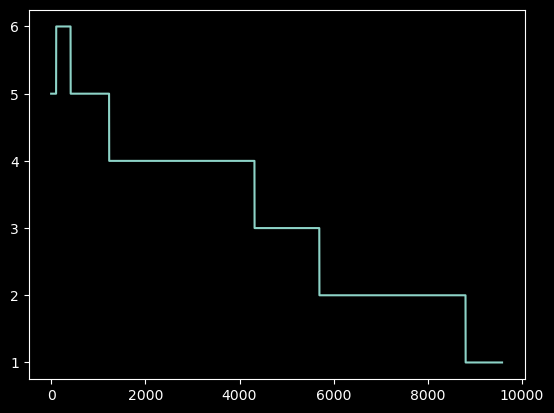

In [148]:
plt.plot(values)

In [135]:
testit = fill_short_gaps(shark_count_per_frame,max_gap = 4)

In [136]:
testit

,Trial,frame,segment,visible_sharks
0,sequence_20240303_060726300_DJI_0242,0,1.0,5
1,sequence_20240303_060726300_DJI_0242,1,1.0,5
2,sequence_20240303_060726300_DJI_0242,2,1.0,5
3,sequence_20240303_060726300_DJI_0242,3,1.0,5
4,sequence_20240303_060726300_DJI_0242,4,1.0,5
...,...,...,...,...
764589,sequence_20240308_074843321_DJI_0502,88018,36.0,1
764590,sequence_20240308_074843321_DJI_0502,88019,36.0,1
764591,sequence_20240308_074843321_DJI_0502,88020,36.0,1
764592,sequence_20240308_074843321_DJI_0502,88021,36.0,1


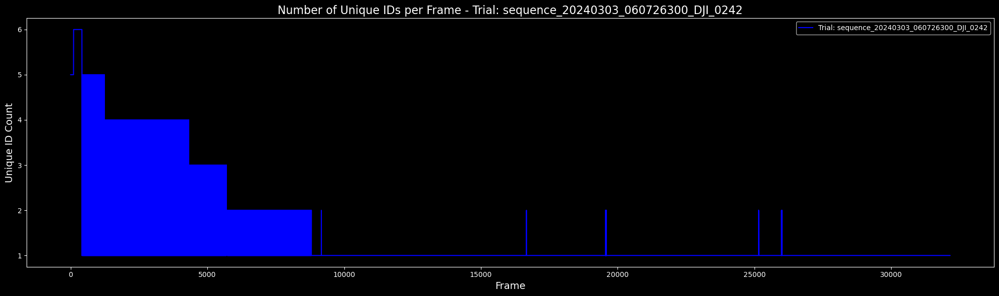

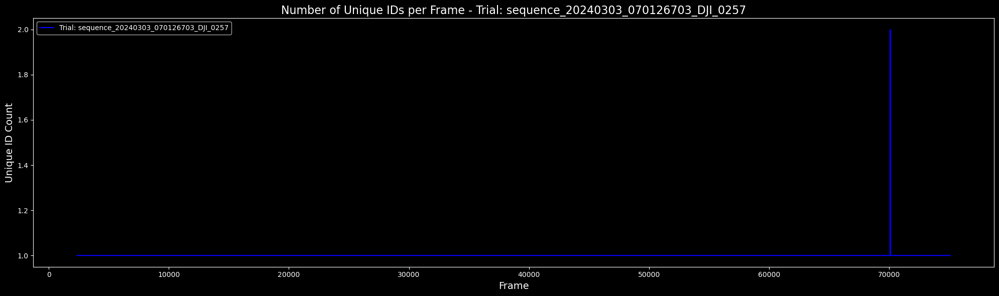

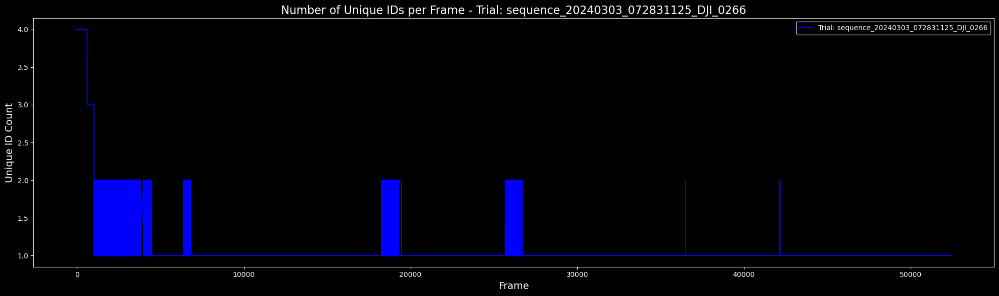

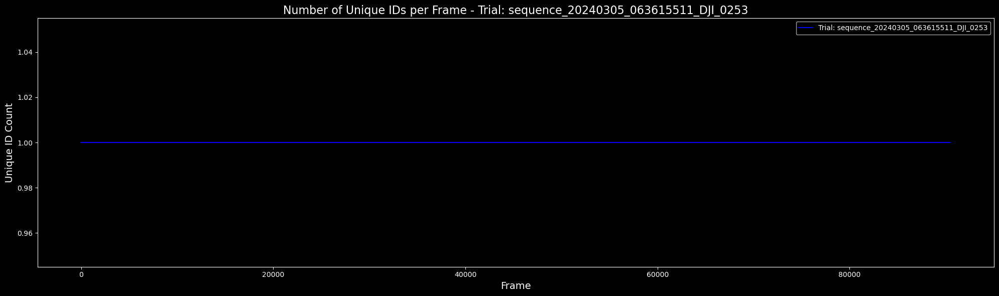

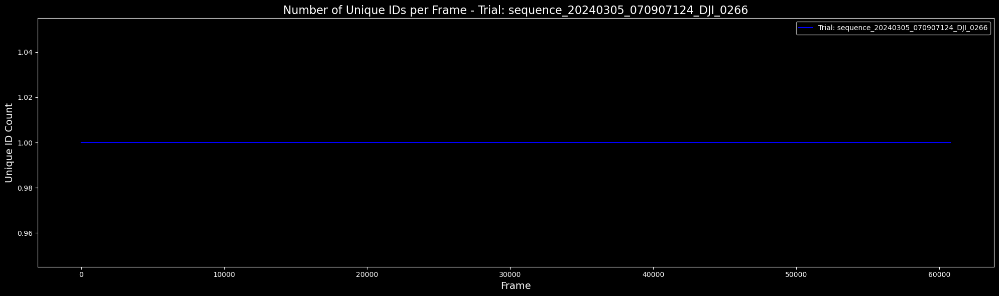

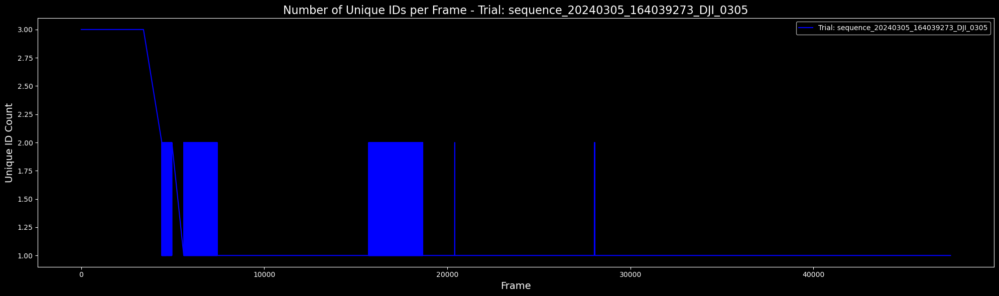

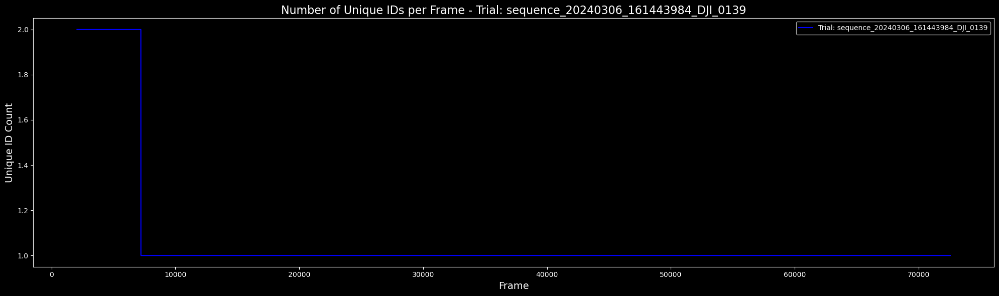

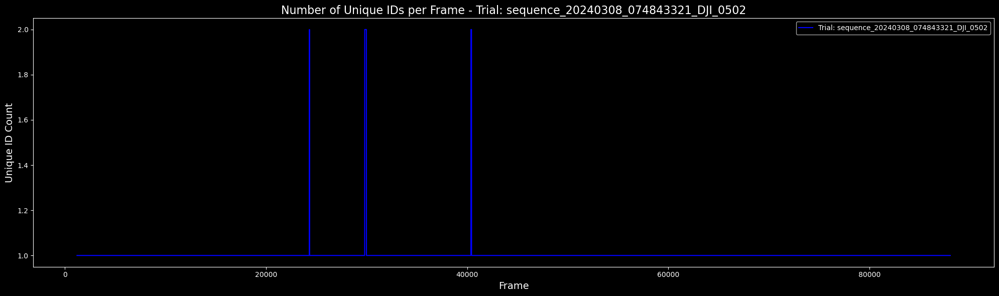

In [137]:
# Generate a plot for each trial
for trial, trial_data in testit.groupby('Trial'):
    plt.figure(figsize=(20, 6))
    plt.plot(
        trial_data['frame'],
        trial_data['visible_sharks'],
        label=f"Trial: {trial}",
        color="blue"
    )
    plt.title(f"Number of Unique IDs per Frame - Trial: {trial}", fontsize=16)
    plt.xlabel("Frame", fontsize=14)
    plt.ylabel("Unique ID Count", fontsize=14)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [154]:
# t242 = test[test['Trial']=='sequence_20240303_060726300_DJI_0242']
# t242[t242['ID']==5]

In [155]:
# Save sharks_df to HDF5
sharks_output_file = os.path.join(output_folder, "subset_sharks.h5")
sharks_df.to_hdf(sharks_output_file, key='sharks', mode='w')
print(f"Shark data saved to {sharks_output_file}")

Shark data saved to /Users/ang/Seafile//BSc_data//processed_data/subset_sharks.h5


In [156]:
df_subset = pd.read_hdf(output_folder + 'subset_sharks.h5', key='sharks')

In [157]:
df_subset = df_subset[(df_subset['ID_checked'] == 1) & (df_subset['drone_movement'] == 0)]

In [158]:
df_subset.head()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,ttipy,X,Y,segment,Trial,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked
2051,2051,82.087409,0,606.844014,-396.939687,-0.435146,2051,40.91,3172.583333,1069.333333,...,1100.250000,606.844014,-396.939687,1,sequence_20240306_161443984_DJI_0139,3147.875000,1082.916667,1,0.0,1.0
2052,2052,76.964699,0,608.723694,-396.273295,-0.456252,2052,40.93,3174.333333,1068.916667,...,1099.583333,608.723694,-396.273295,1,sequence_20240306_161443984_DJI_0139,3149.708333,1083.125000,1,0.0,1.0
2053,2053,75.903308,0,610.451965,-395.569743,-0.479337,2053,40.95,3175.916667,1068.416667,...,1099.083333,610.451965,-395.569743,1,sequence_20240306_161443984_DJI_0139,3151.458333,1083.250000,1,0.0,1.0
2054,2054,71.775297,0,612.184855,-394.984894,-0.500498,2054,40.97,3177.416667,1067.916667,...,1098.666667,612.184855,-394.984894,1,sequence_20240306_161443984_DJI_0139,3153.125000,1083.333333,1,0.0,1.0
2055,2055,81.043147,0,613.870341,-394.378459,-0.521608,2055,40.99,3178.833333,1067.500000,...,1098.250000,613.870341,-394.378459,1,sequence_20240306_161443984_DJI_0139,3154.750000,1083.416667,1,0.0,1.0


In [159]:
# ### Example to calculate pw distance

# fishlist = np.unique(subset["ID"].values)
# maxframe = len(np.unique(subset["frame"].values))
# num_individuals = len(np.unique(subset["ID"].values))
# pairwise_df = np.zeros((num_individuals, num_individuals, maxframe))
# sel_fish = subset.groupby("ID")

# #     df_pairwise = []
# for ixff, fish in enumerate(fishlist):

#     ff_ = sel_fish.get_group(fish)
#     x_ff_ = ff_["X"].values
#     x_ff_ = np.asarray(list(x_ff_))

#     y_ff_ = ff_["Y"].values
#     y_ff_ = np.asarray(list(y_ff_))

#     for ixnf, nf in enumerate(fishlist):  # list_no_fish:

#         nf_ = sel_fish.get_group(nf)
#         x_nf_ = nf_["X"].values
#         x_nf_ = np.asarray(list(x_nf_))

#         y_nf_ = nf_["Y"].values
#         y_nf_ = np.asarray(list(y_nf_))
#         pairwise_df[ixff, ixnf, :] = pairwise_distance(x_ff_, y_ff_, x_nf_, y_nf_,num_individuals)
    

In [60]:
# pairwise_df.shape # nind x nind x frames

In [61]:
# ### Plot ONE frame of pw distance of all IDs in that frame
# plt.imshow(pairwise_df[:,:,10])

In [62]:
# pairwise_df[:,:,0]

In [35]:
# #### NN distance
# lst = np.arange(num_individuals)

# distinf = pairwise_df.T

# distinf[:, lst, lst] = np.nan

# # Replace rows where all values are NaN with np.inf to avoid issues
# all_nan_mask = np.all(np.isnan(distinf), axis=1)
# distinf[all_nan_mask] = np.inf

# # Compute the nearest neighbor distances, ignoring NaNs
# mindist = np.nanmin(distinf, axis=1)

# # Optional: Replace np.inf with NaN if you want to indicate no neighbors were found
# #mindist[np.isinf(mindist)] = np.nan

# # Now, mindist should hold the nearest neighbor distances for each individual
# print(mindist)


[[ 407.84385835  407.84385835  881.88583036]
 [ 408.84513235  408.84513235  879.75399942]
 [ 410.59830375  410.59830375  876.92007493]
 ...
 [ 450.9224942  1162.3656081   450.9224942 ]
 [ 451.43077009 1160.95121276  451.43077009]
 [ 451.9682525  1159.76409567  451.9682525 ]]


### Add nn distance to the dataframe

In [44]:
# mindist[:,0]

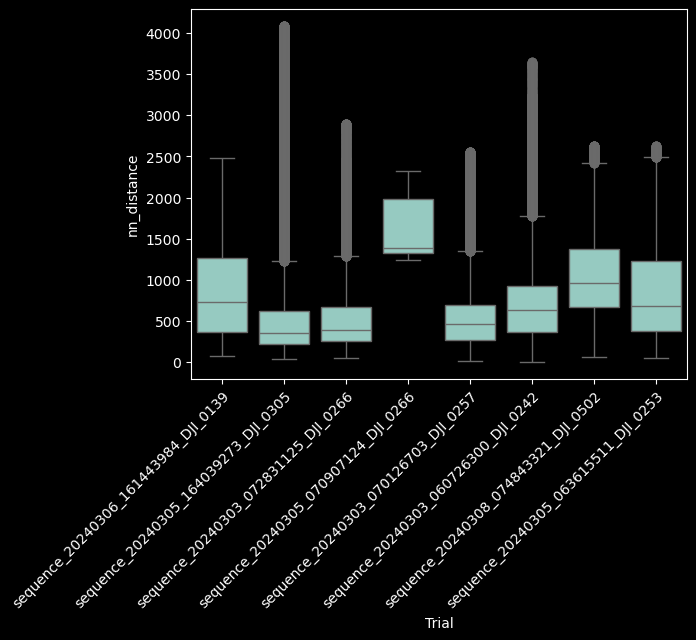

In [64]:

ax = sns.boxplot(x='Trial', y='nn_distance', data=df_nndist)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.show()

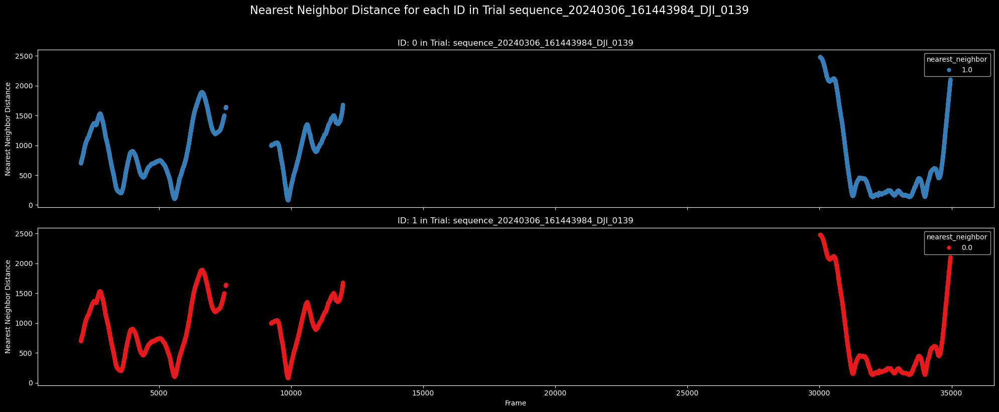

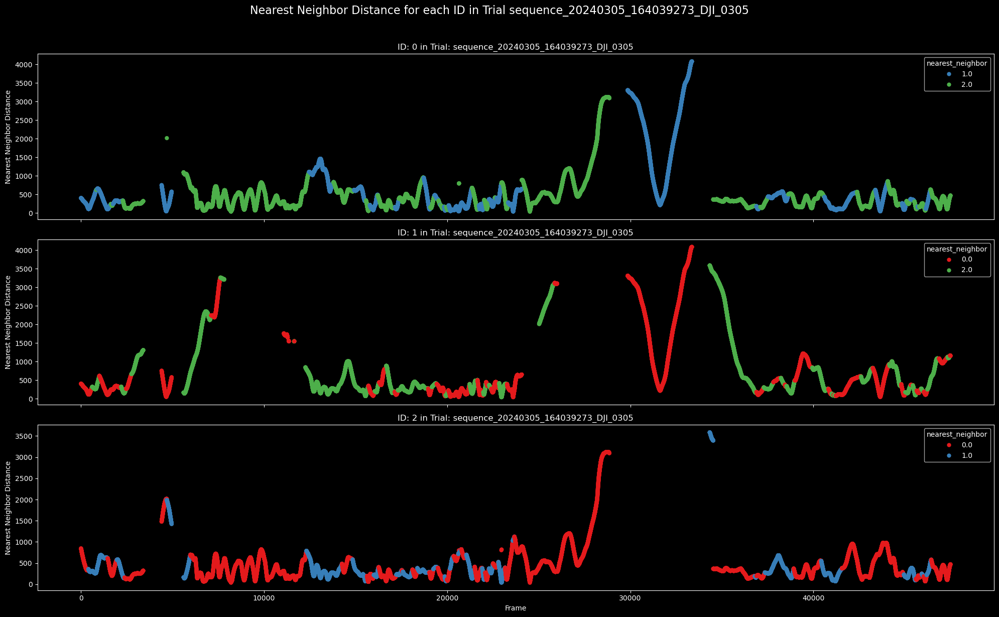

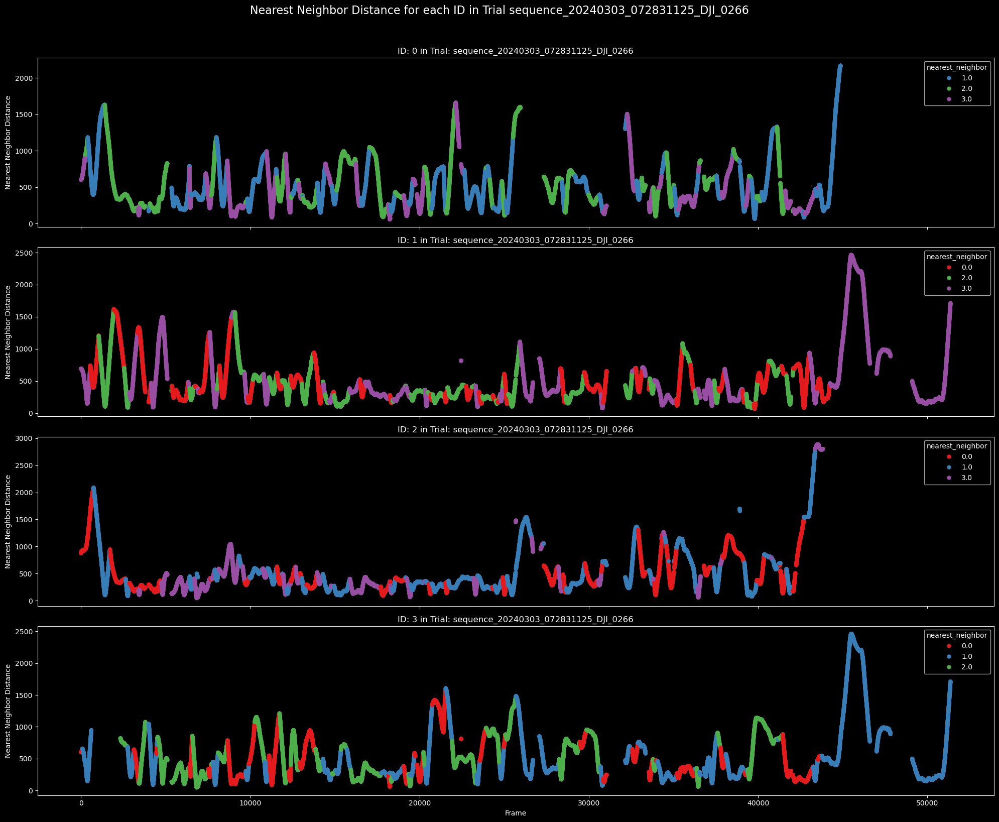

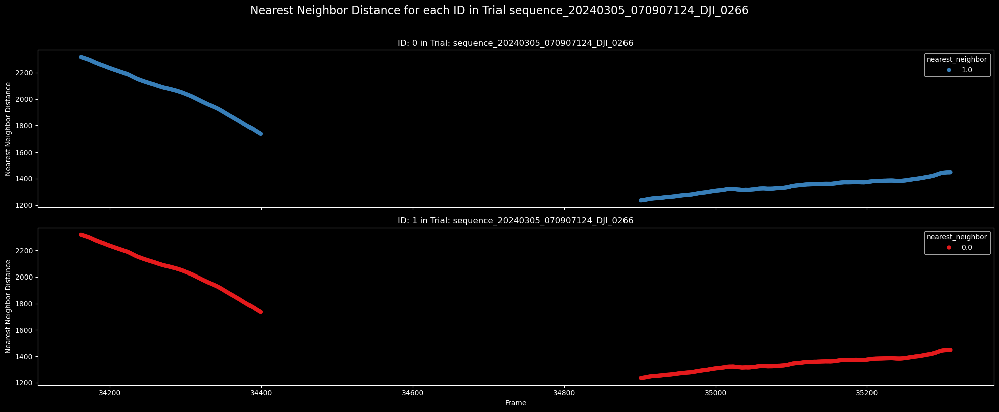

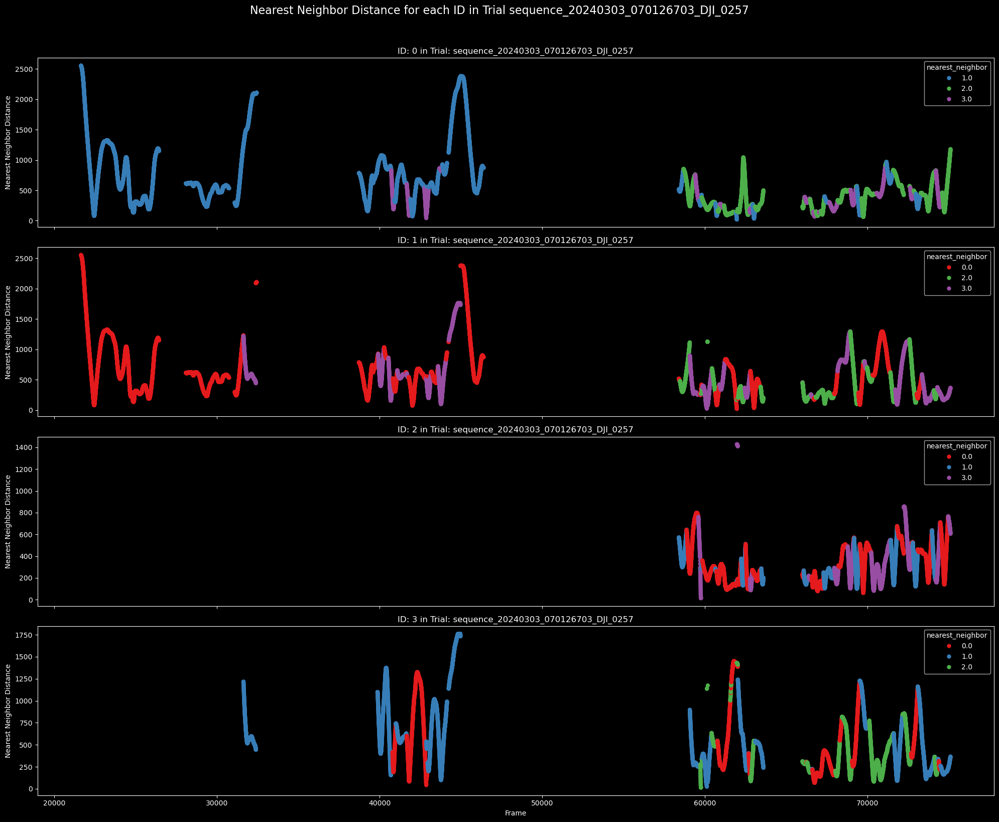

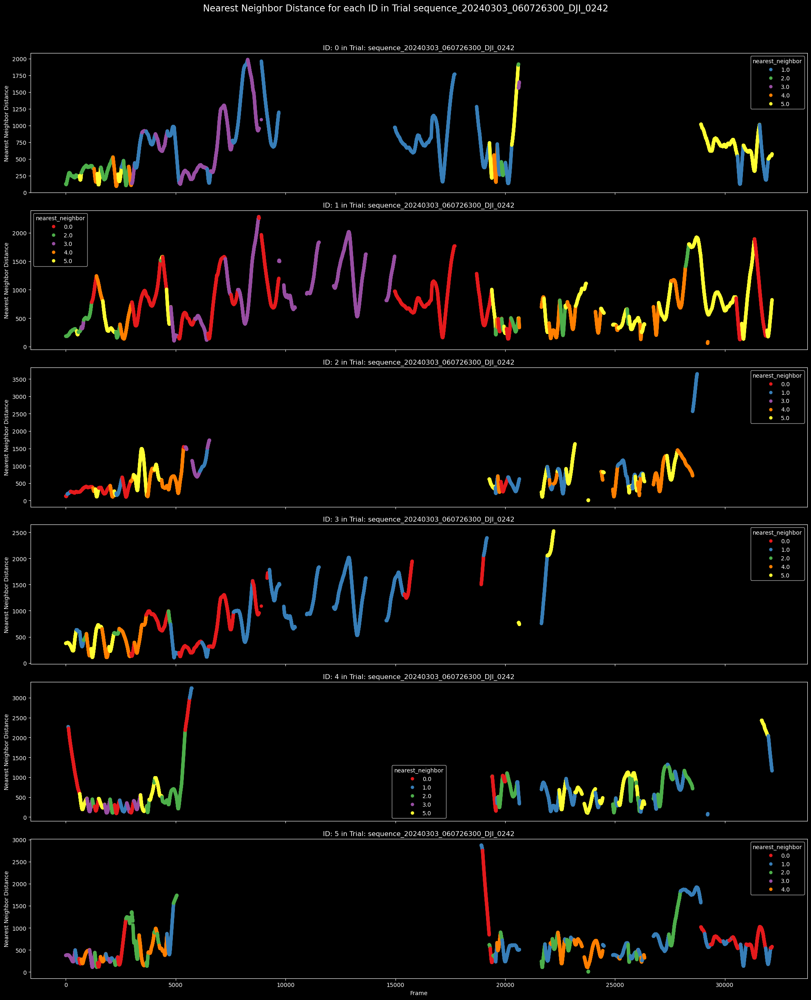

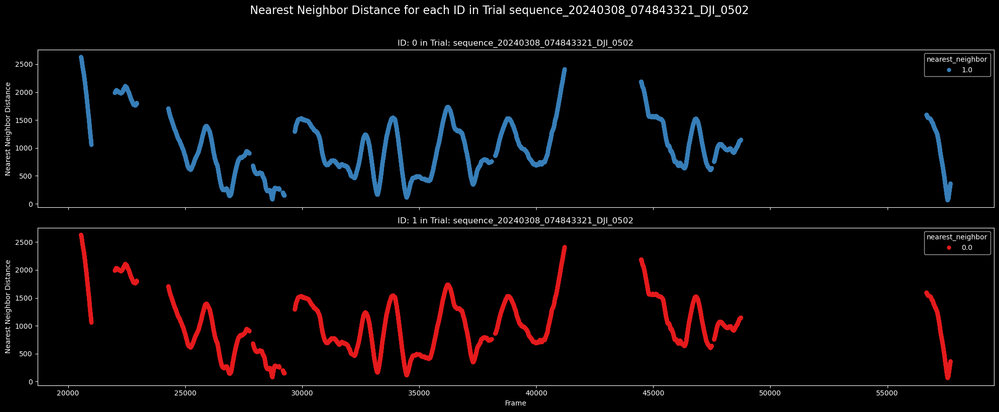

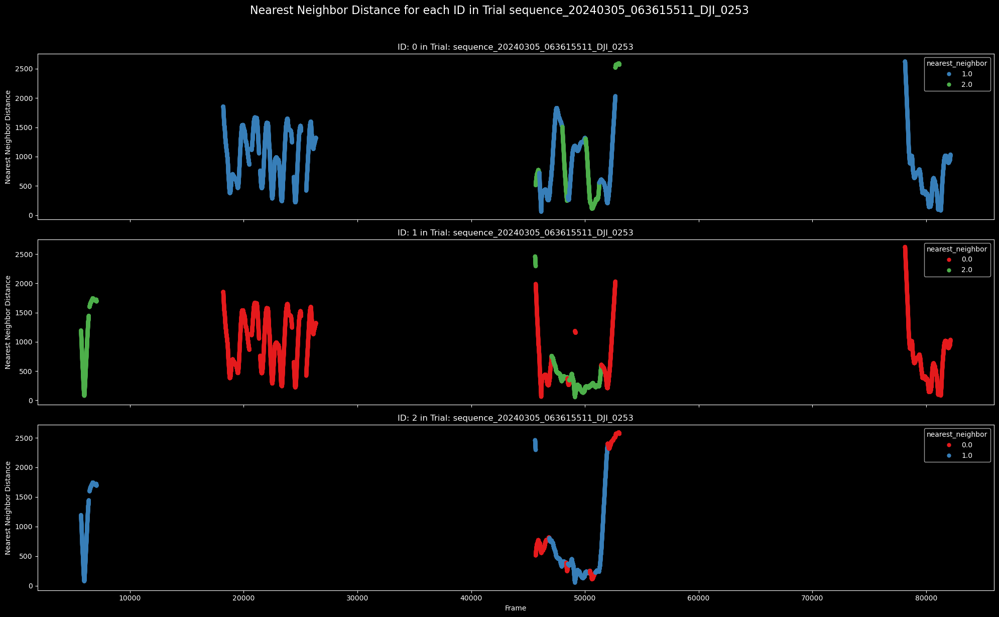

In [65]:
# Set up the color palette and color map
palette = sns.color_palette("Set1", n_colors=6)  
color_map = {i: palette[i] for i in range(len(palette))}

# Loop through each unique Trial and ID to create a plot for each
for trial in df_nndist['Trial'].unique():
    trial_data = df_nndist[df_nndist['Trial'] == trial]  # Filter data for current trial
    unique_ids = trial_data['ID'].unique()  # Get all unique IDs in this trial

    # Create a subplot for each ID within this trial
    fig, axes = plt.subplots(len(unique_ids), 1, figsize=(20, 4 * len(unique_ids)), sharex=True)
    fig.suptitle(f"Nearest Neighbor Distance for each ID in Trial {trial}", y=1.02, fontsize=16)
    
    # If there’s only one ID, ensure axes are in list form to avoid errors
    if len(unique_ids) == 1:
        axes = [axes]

    # Plot for each ID in this trial
    for idx, (ax, unique_id) in enumerate(zip(axes, unique_ids)):
        # Filter out rows where nearest_neighbor is -1
        filtered_data = trial_data[(trial_data['ID'] == unique_id) & (trial_data['nearest_neighbor'] != -1)]

        # Plot the filtered data
        sns.scatterplot(
            ax=ax,
            x='frame',
            y='nn_distance',
            data=filtered_data,
            linewidth=0,
            hue='nearest_neighbor',
            palette=color_map
        )
        ax.set_title(f"ID: {unique_id} in Trial: {trial}")
        ax.set_ylabel("Nearest Neighbor Distance")
        ax.set_xlabel("Frame")
    
    plt.tight_layout()
    plt.show()



#### CHECK frame order for pw distances and add NN ID to the dataframe

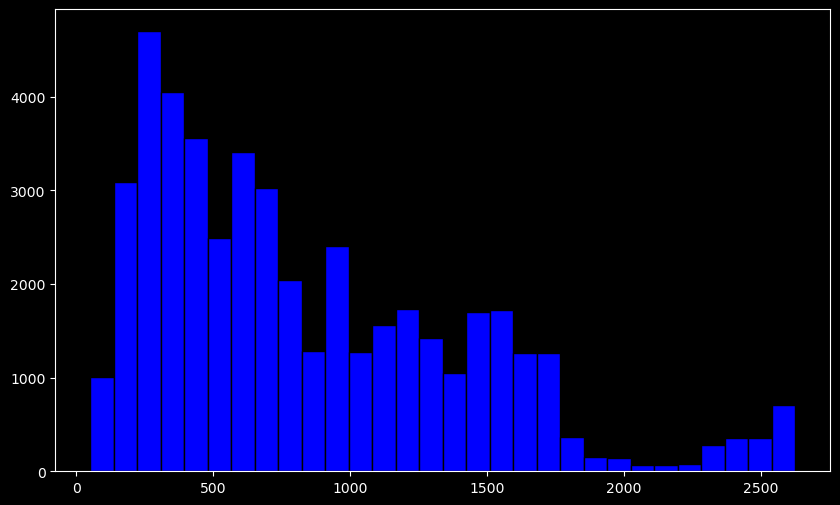

In [67]:
# Filter out any infinite or NaN values from mindist
filtered_mindist = mindist[np.isfinite(mindist)]

# Create a histogram for the filtered nearest neighbor distances
plt.figure(figsize=(10, 6))
plt.hist(filtered_mindist, bins=30, color='blue', edgecolor='black')
plt.show()


In [36]:
# # Initialize nearest_neighbors array with a placeholder value (e.g., -1)
# nearest_neighbors = np.full((pairwise_df.shape[0], pairwise_df.shape[2]), -1, dtype=int)  # Shape: (4, 967)

# # Loop through each frame set
# for i in range(pairwise_df.shape[2]):
#     # Set diagonal to np.nan to ignore distances to self
#     temp_matrix = pairwise_df[:, :, i].copy()
#     np.fill_diagonal(temp_matrix, np.nan)
    
#     # Check if there are non-NaN values in the row
#     valid_mask = ~np.all(np.isnan(temp_matrix), axis=1)
    
#     # Find the index of the nearest neighbor for each frame in this specific set (only for valid rows)
#     if np.any(valid_mask):
#         nearest_neighbors[valid_mask, i] = np.nanargmin(temp_matrix[valid_mask], axis=1)

# # Display the nearest neighbors
# print(nearest_neighbors)


[[1 1 1 ... 2 2 2]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


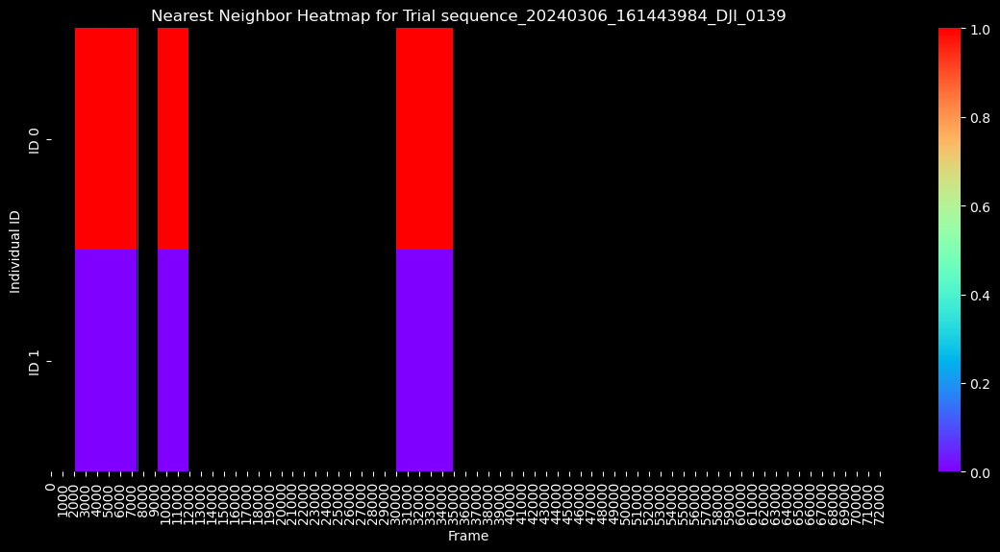

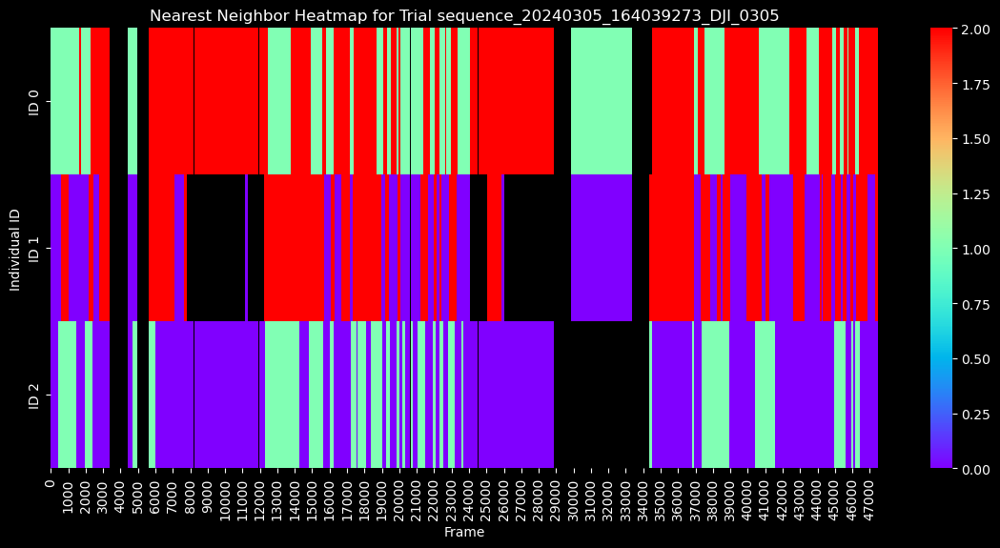

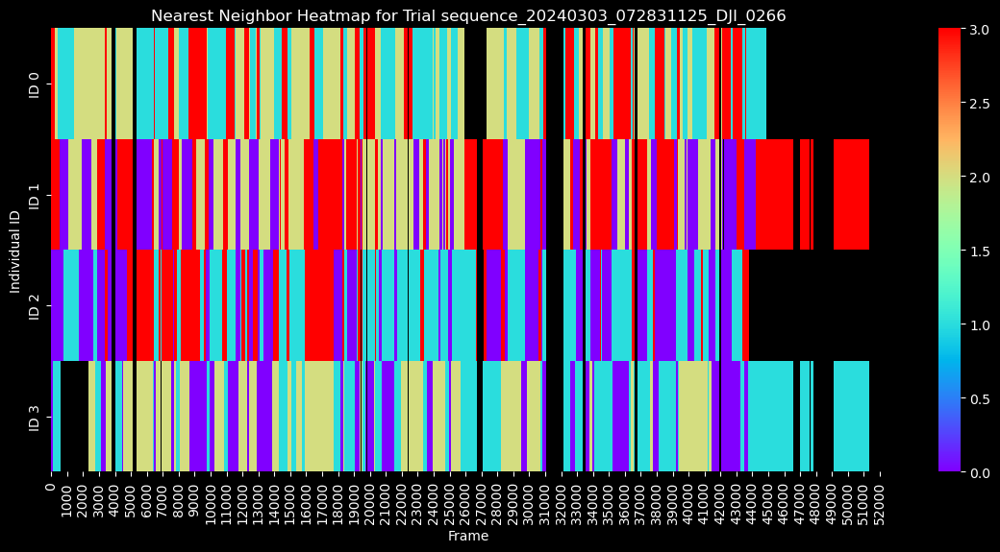

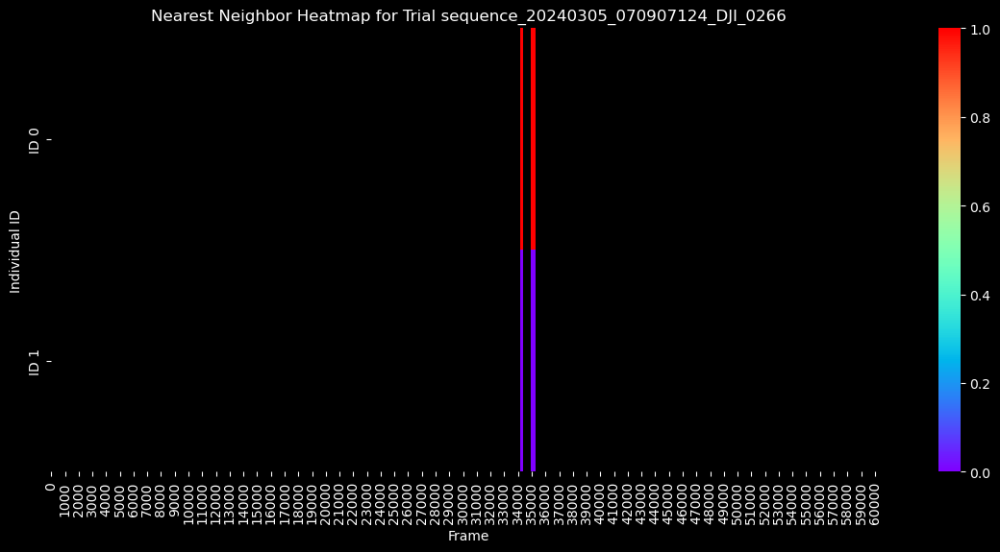

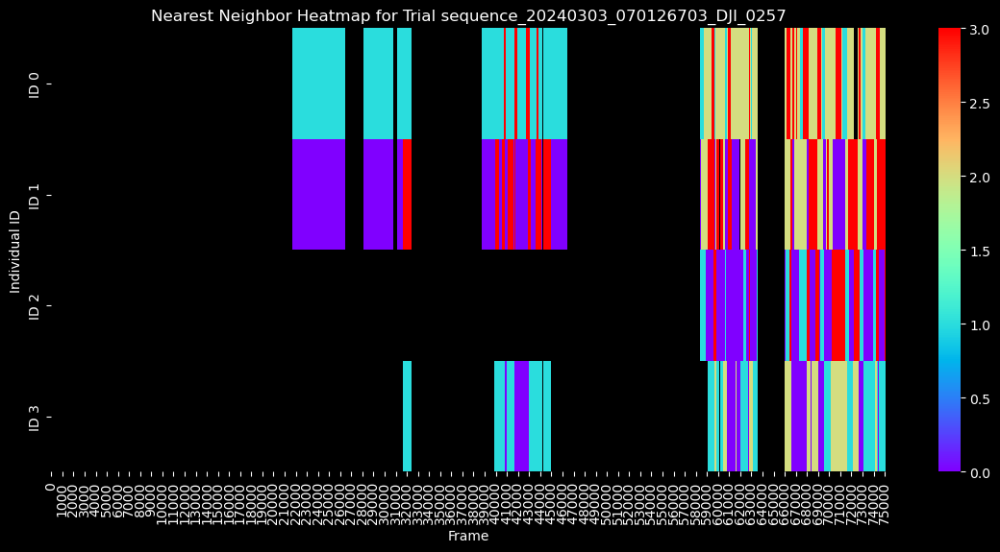

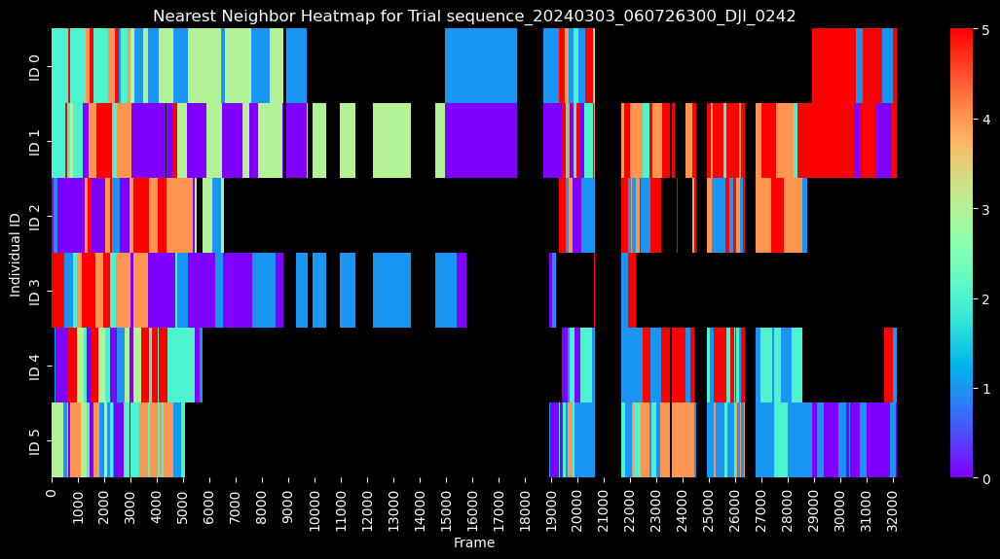

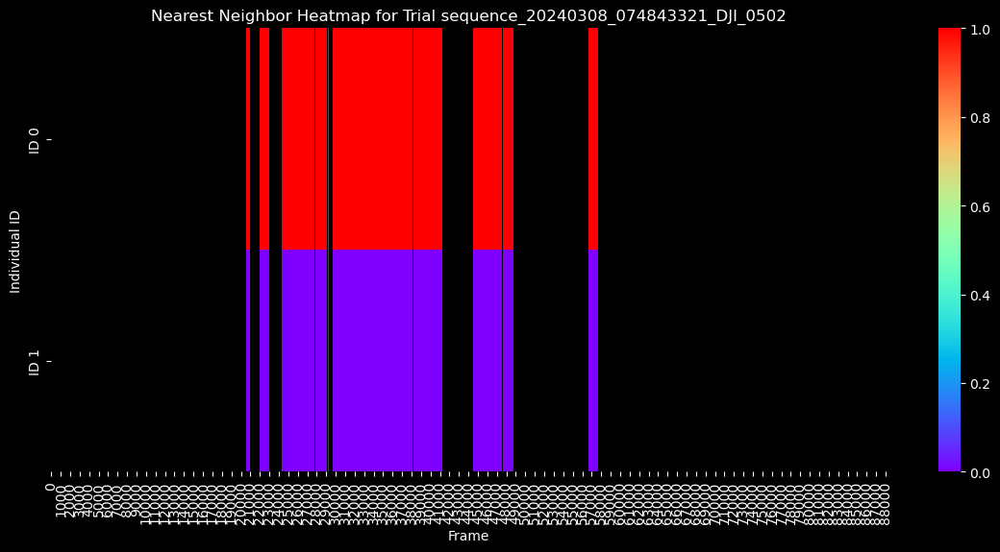

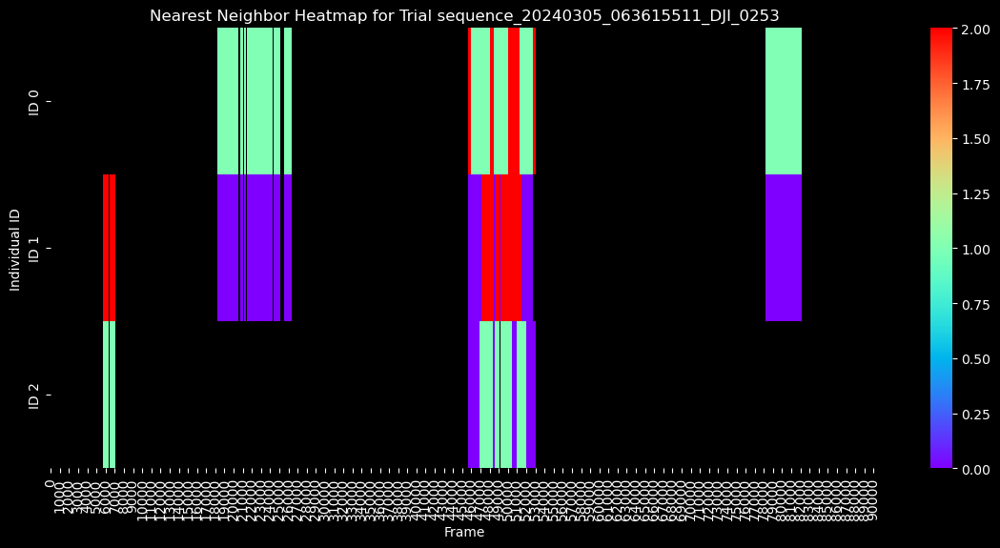

In [66]:
# Loop through each unique Trial and create a heatmap for each one
for trial in df_nndist['Trial'].unique():
    # Filter data for the current trial
    trial_data = df_nndist[df_nndist['Trial'] == trial]
    
    # Get unique IDs and frames in the current trial
    unique_ids = trial_data['ID'].unique()
    maxframe = trial_data['frame'].max() + 1  # Assuming frame indexing starts from 0
    
    # Initialize a matrix for nearest neighbors with NaN to handle missing values
    heatmap_data = np.full((len(unique_ids), maxframe), np.nan)

    # Map each ID to a row index in the heatmap matrix
    id_to_index = {id_val: idx for idx, id_val in enumerate(unique_ids)}

    # Populate the heatmap matrix with nearest neighbor IDs
    for _, row in trial_data.iterrows():
        row_idx = id_to_index[row['ID']]
        frame_idx = int(row['frame'])
        heatmap_data[row_idx, frame_idx] = row['nearest_neighbor']
    
    # Plot the heatmap for the current trial
    plt.figure(figsize=(14, 6))
    sns.heatmap(heatmap_data, cmap='rainbow', cbar=True, 
                xticklabels=1000,  # Adjust label frequency for clarity if needed
                yticklabels=[f'ID {id_val}' for id_val in unique_ids])
    plt.title(f"Nearest Neighbor Heatmap for Trial {trial}")
    plt.xlabel("Frame")
    plt.ylabel("Individual ID")
    plt.show()


#### Calculating Heading 

In [58]:
# Function to calculate the heading based on head and btip positions
def calculate_heading(df):
    dx = df['headx'] - df['midpoint_x']
    dy = df['heady'] - df['midpoint_y']
    
    heading_radians = np.arctan2(dy, dx)
    df['heading'] = heading_radians
    return df

# Function to calculate the heading for each unique Trial, ID, and segment
def calculate_heading_per_trial_id_segment(df):
    """
    Calculate the heading angle for each unique Trial, ID, and segment.

    Parameters:
    df (DataFrame): A pandas DataFrame that contains the necessary columns.

    Returns:
    DataFrame: The original DataFrame with a new 'heading' column.
    """
    df = df.groupby(['Trial', 'ID', 'segment']).apply(calculate_heading).reset_index(drop=True)
    return df

# Function to rotate a point based on the angle
def rotate_point(x, y, angle_rad):
    cos_theta = np.cos(-angle_rad)  # Negative for counter-clockwise rotation
    sin_theta = np.sin(-angle_rad)
    x_rot = cos_theta * x - sin_theta * y
    y_rot = sin_theta * x + cos_theta * y
    return x_rot, y_rot

# Function to center the points and normalize by the heading for each Trial, ID, and segment
def center_and_rotate(df, midpoints):
    # Center all points by subtracting the midpoint
    for (x_col, y_col) in midpoints:
        df[f'centered_{x_col}'] = df[x_col] - df['midpoint_x']
        df[f'centered_{y_col}'] = df[y_col] - df['midpoint_y']

    # Rotate all centered points based on the heading angle
    for (x_col, y_col) in midpoints:
        df[f'rotated_{x_col}'], df[f'rotated_{y_col}'] = zip(
            *df.apply(lambda row: rotate_point(
                row[f'centered_{x_col}'], row[f'centered_{y_col}'], row['heading']), axis=1)
        )

    return df

# Function to center and rotate per Trial, ID, and segment
def center_and_rotate_per_trial_id_segment(df, midpoints):
    """
    Apply centering and rotating per unique Trial, ID, and segment.
    
    Parameters:
    df (DataFrame): A pandas DataFrame that contains the necessary columns.

    Returns:
    DataFrame: The original DataFrame with normalized and rotated points.
    """
    df = df.groupby(['Trial', 'ID', 'segment']).apply(center_and_rotate, midpoints).reset_index(drop=True)
    return df

# Function to calculate angles for the rotated skeleton points
def calculate_angles_for_df(df, midpoints_centered):
    """
    Calculate angles for the rotated skeleton points in the DataFrame.

    Parameters:
    df (DataFrame): A pandas DataFrame containing rotated skeleton points.

    Returns:
    DataFrame: The original DataFrame with additional columns for angles between joints.
    """
    angles_list = []

    # Loop over each frame in the DataFrame
    for idx, row in df.iterrows():
        # Extract the rotated x and y points for the current frame
        skeleton = np.array([[row[x_col], row[y_col]] for (x_col, y_col) in midpoints_centered])
        # Calculate angles for the current skeleton
        angles = skeletons_to_angles(skeleton)
        # Store the angles
        angles_list.append(angles)
    
    # Convert list of angles to a DataFrame
    angles_df = pd.DataFrame(
        angles_list,
        columns=[f"angle_joint_{i}" for i in range(len(midpoints_centered) - 1)]
    )
    
    # Concatenate the angles DataFrame with the original DataFrame
    df = pd.concat([df, angles_df], axis=1)
    
    return df

# Function to center, rotate, and calculate angles for each Trial, ID, and segment
def center_rotate_and_calculate_angles_per_trial_id_segment(df, midpoints):
    """
    Apply centering, rotating, and angle calculation per unique Trial, ID, and segment.
    
    Parameters:
    df (DataFrame): A pandas DataFrame that contains the necessary columns.

    Returns:
    DataFrame: The original DataFrame with normalized, rotated points and angle columns.
    """
    # Step 1: Apply centering and rotation
    df = center_and_rotate_per_trial_id_segment(df, midpoints)
    
    # Step 2: Calculate angles for the centered and rotated points
    midpoints_centered = [(f'rotated_{x_col}', f'rotated_{y_col}') for (x_col, y_col) in midpoints]
    df = calculate_angles_for_df(df, midpoints_centered)
    
    return df


In [59]:
# Group by both 'ID' and 'segment' and count the number of frames for each group
id_segment_counts = sharks_df_filtered.groupby(['Trial','ID', 'segment']).size()

# Filter out ID-segment combinations that have less than 100 frames
id_segments_to_keep = id_segment_counts[id_segment_counts >= 100].index

# Keep only the rows where the combination of 'ID' and 'segment' is in the list of groups with >= 100 frames
df_filtered = sharks_df_filtered[sharks_df_filtered.set_index(['Trial', 'ID', 'segment']).index.isin(id_segments_to_keep)]


In [113]:
# Step 1: Group by both 'ID' and 'segment' and count the total number of rows and number of NaNs
grouped = df_filtered.groupby(['Trial','ID', 'segment'])

# Count the total rows and the number of NaN values per group
total_rows_per_group = grouped.size()
nans_per_group = grouped.apply(lambda x: x.isna().sum().sum())  # Total NaNs across all columns per group

# Step 2: Calculate the percentage of NaNs for each group
nan_percentage_per_group = nans_per_group / (total_rows_per_group * df_filtered.shape[1])

# Step 3: Filter out groups with more than 50% NaNs
groups_to_keep = nan_percentage_per_group[nan_percentage_per_group <= 0.5].index

# Step 4: Keep only the rows where the combination of 'ID' and 'segment' is in the list of valid groups
df_sharks_filt = df_filtered[df_filtered.set_index(['Trial','ID', 'segment']).index.isin(groups_to_keep)]
sharks_output_file = os.path.join(output_folder, f"{base_filename}_sharks_filtered.h5")
df_sharks_filt.to_hdf(sharks_output_file, key='sharks_filtered', mode='w')


C:\Users\sophi\AppData\Local\Temp\ipykernel_2088\4006576154.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  nans_per_group = grouped.apply(lambda x: x.isna().sum().sum())  # Total NaNs across all columns per group


In [33]:
# Step 3: Apply the heading calculation, centering, rotation, and angle calculation
data = calculate_heading_per_id_segment(df_sharks_filt)
data2 = center_rotate_and_calculate_angles_per_id_segment(data,midpoints)
data3 = process_angles(data2, midpoints_centered)

C:\Users\sophi\AppData\Local\Temp\ipykernel_4948\3930559553.py:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['ID', 'segment','Trial']).apply(calculate_heading).reset_index(drop=True)
C:\Users\sophi\AppData\Local\Temp\ipykernel_4948\3930559553.py:86: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['ID', 'segment','Trial']).apply(center_and_rotate,midpoints).reset_index(dro

NameError: name 'process_angles' is not defined

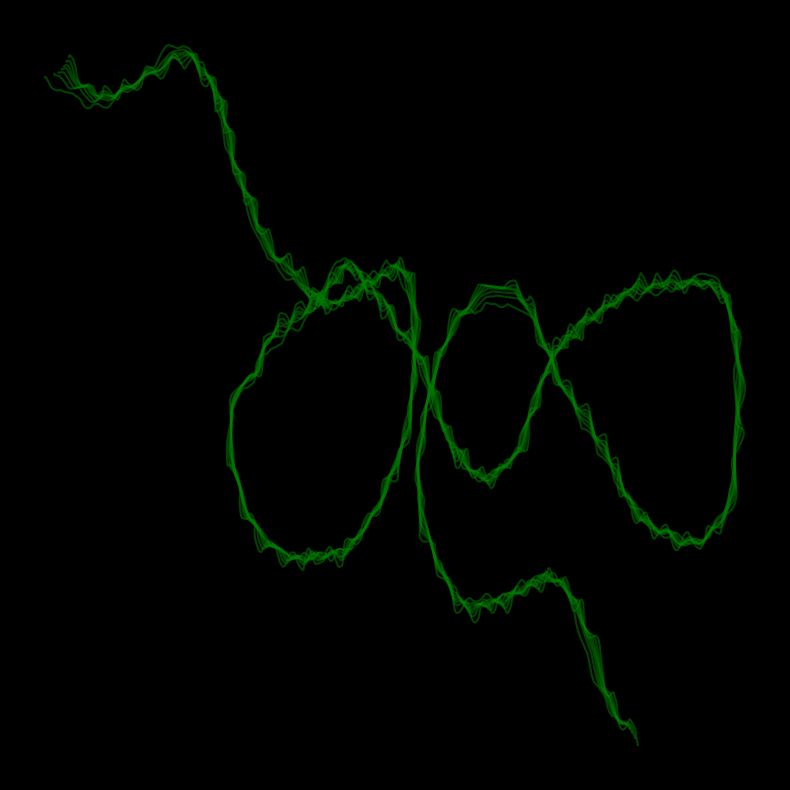

In [114]:
# Plot all rotated points over time (x and y coordinates for each point)
# plt.figure(figsize=(14, 10))
onef = df_sharks_filt.loc[(df_sharks_filt['ID'] == 0) & (df_sharks_filt['Trial'] == 'sequence_20240306_161443984_DJI_0139')]
short = onef[onef['frame'].between(20000,26000)]

f,ax = plt.subplots(1,1,figsize=(8, 8))
# Loop through the midline points and plot their x and y coordinates over time
for i, (x_col, y_col) in enumerate(midpoints):
    # plt.subplot(len(midline_points), 1, i + 1)
    # plt.plot(frames, short[x_col], label=f"{x_col.replace('rotated_', '')} (x)", color="blue")
    ax.plot(short[x_col], short[y_col], color="green",alpha=0.5)
    # plt.title(f"{x_col.replace('centered_', '').replace('_', ' ')} and {y_col.replace('centered_', '').replace('_', ' ')}")
    plt.xlabel("Frame")
    plt.ylabel("Position")
    # plt.xlim()
    # plt.legend()
    # plt.grid(True)
    plt.axis('off')
plt.tight_layout()
# plt.savefig('/home/angela/Dropbox/seq_030324_0262_shark2_path_green_detail.pdf')
plt.show()


In [39]:
# List of IDs you want to plot
ids_to_plot = [0, 1, 2, 3]
trial_name = 'sequence_20240305_164039273_DJI_0305'

# Set up a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 14))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Initialize global min and max values for x and y
x_min, x_max = float('inf'), float('-inf')
y_min, y_max = float('inf'), float('-inf')

# First pass to calculate global axis limits
for shark_id in ids_to_plot:
    onef = df_sharks_filt.loc[(df_sharks_filt['ID'] == shark_id) & (df_sharks_filt['Trial'] == trial_name)]
    short = onef[onef['frame'].between(20000, 26000)]
    
    for x_col, y_col in midpoints:
        x_min = min(x_min, short[x_col].min())
        x_max = max(x_max, short[x_col].max())
        y_min = min(y_min, short[y_col].min())
        y_max = max(y_max, short[y_col].max())

# Second pass to plot data and apply common axis limits
for idx, shark_id in enumerate(ids_to_plot):
    onef = df_sharks_filt.loc[(df_sharks_filt['ID'] == shark_id) & (df_sharks_filt['Trial'] == trial_name)]
    short = onef[onef['frame'].between(20000, 26000)]
    
    # Loop through the midline points and plot their x and y coordinates over time
    for i, (x_col, y_col) in enumerate(midpoints):
        axs[idx].plot(short[x_col], short[y_col], color="green", alpha=0.5)
    
    # axs[idx].set_title(f'Shark ID: {shark_id}')
    axs[idx].set_xlim(x_min, x_max)
    axs[idx].set_ylim(y_min, y_max)
    axs[idx].axis('off')  # Turn off axis for a cleaner plot

# plt.savefig('/home/angela/Dropbox/seq_030324_0262_allsharks_path_green_detail.pdf')

# Adjust layout and show the plot
plt.tight_layout()
plt.show())
]

# Calculate unique IDs per frame
unique_id_count_per_frame = (
    valid_ids
    .groupby(['frame'# Inspect a specific frame range
print(unique_id_count_per_frame[unique_id_count_per_frame['frame'].between(2000, 3000)])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(
    unique_id_count_per_frame['frame'],
    unique_id_count_per_frame['unique_id_count'],
    label="Unique IDs per Frame",
    color="green"
)
plt.title("Number of Unique IDs per Frame", fontsize=16)
plt.xlabel("Frame", fontsize=14)
plt.ylabel("Unique ID Count", fontsize=14)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'df_sharks_filtered' is not defined

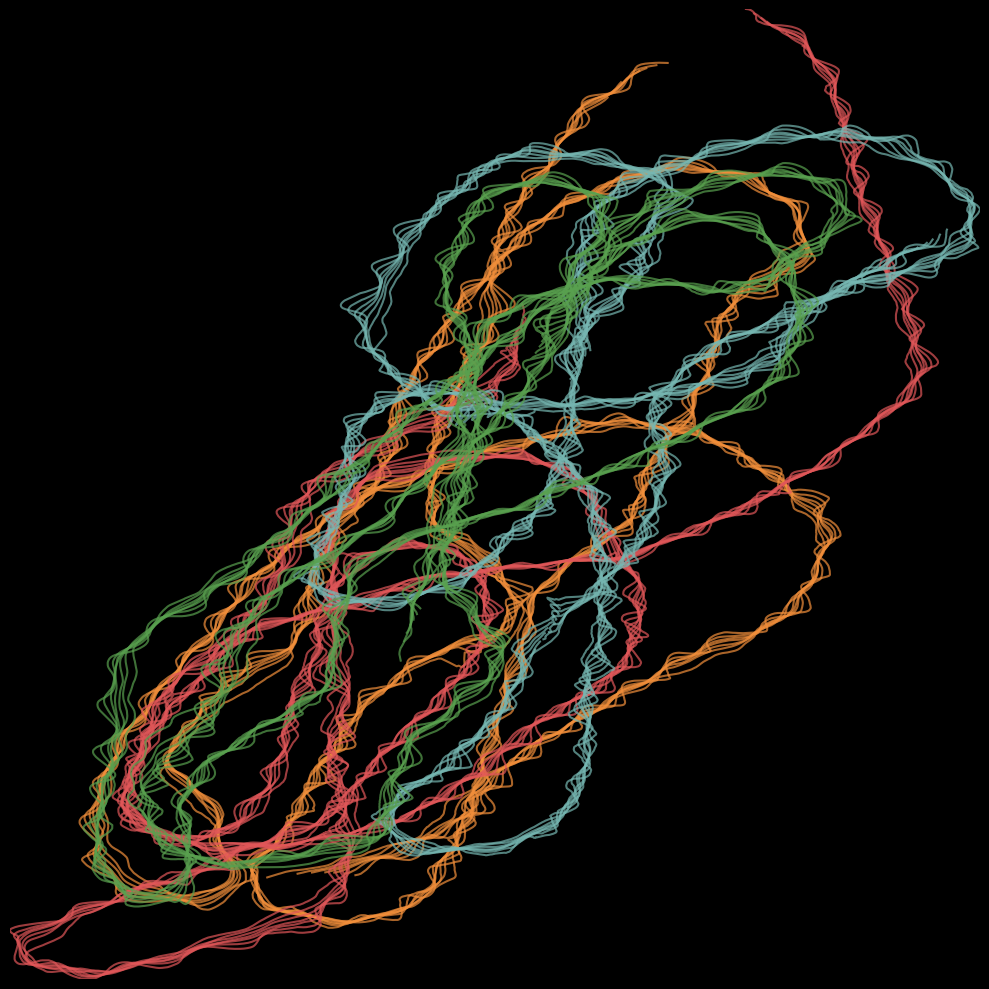

In [67]:
# List of IDs you want to plot
ids_to_plot = [0, 1, 2, 3]
trial_name = 'sequence_20240303_071644282_DJI_0262'

# Manually define a Wes Anderson color palette
wes_anderson_palette = ['#F28F3B', '#E15759', '#76B7B2', '#59A14F']  # Example colors from Wes Anderson palette

# Set up a single plot
fig, ax = plt.subplots(figsize=(10, 10))

# Initialize global min and max values for x and y
x_min, x_max = float('inf'), float('-inf')
y_min, y_max = float('inf'), float('-inf')

# First pass to calculate global axis limits
for shark_id in ids_to_plot:
    onef = df_sharks_filt.loc[(df_sharks_filt['ID'] == shark_id) & (df_sharks_filt['Trial'] == trial_name)]
    short = onef[onef['frame'].between(20000, 26000)]
    
    for x_col, y_col in midpoints:
        x_min = min(x_min, short[x_col].min())
        x_max = max(x_max, short[x_col].max())
        y_min = min(y_min, short[y_col].min())
        y_max = max(y_max, short[y_col].max())

# Plot all sharks in the same plot, each with a different Wes Anderson color
for idx, shark_id in enumerate(ids_to_plot):
    onef = df_sharks_filt.loc[(df_sharks_filt['ID'] == shark_id) & (df_sharks_filt['Trial'] == trial_name)]
    short = onef[onef['frame'].between(20000, 26000)]
    
    # Loop through the midline points and plot their x and y coordinates over time
    for i, (x_col, y_col) in enumerate(midpoints):
        ax.plot(short[x_col], short[y_col], color=wes_anderson_palette[idx], alpha=0.7, label=f'Shark ID: {shark_id}')
    
# Apply global axis limits
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Turn off axis for a cleaner plot and add a legend
ax.axis('off')
# ax.legend()
# plt.savefig('/home/angela/Dropbox/seq_030324_0262_allsharks_sameplot.pdf')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Count number of sharks per frame

In [67]:
df_subset = pd.read_hdf(output_folder + 'subset_sharks.h5', key='sharks')

In [68]:
df_subset = df_subset[(df_subset['ID_checked'] == 1)]

In [69]:
df_subset.head()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,ttipy,X,Y,segment,Trial,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked
0,0,0.000000,0,-597.556030,30.503662,-0.614673,0,0.00,1982.000000,1478.000000,...,1513.000000,-597.556030,30.503662,1,sequence_20240306_161443984_DJI_0139,1950.000000,1502.000,1,1,1.0
1,1,246.525452,0,-601.888000,31.994019,-0.616159,1,0.01,1976.500000,1479.500000,...,1517.000000,-601.888000,31.994019,1,sequence_20240306_161443984_DJI_0139,1945.500000,1502.750,1,1,1.0
2,2,301.757548,0,-605.915649,33.496460,-0.620030,2,0.02,1972.333333,1480.333333,...,1520.333333,-605.915649,33.496460,1,sequence_20240306_161443984_DJI_0139,1941.666667,1503.500,1,1,1.0
3,3,317.241776,0,-609.988617,34.644623,-0.621046,3,0.03,1968.000000,1481.500000,...,1523.000000,-609.988617,34.644623,1,sequence_20240306_161443984_DJI_0139,1937.500000,1504.625,1,1,1.0
4,4,339.523218,0,-613.667163,35.803613,-0.629249,4,0.04,1963.800000,1482.400000,...,1525.400000,-613.667163,35.803613,1,sequence_20240306_161443984_DJI_0139,1933.500000,1505.700,1,1,1.0


In [70]:
valid_ids = df_subset[df_subset['headx'].notna() & df_subset['ttipx'].notna()]

In [71]:
# Define rolling window size
window_size = 5  # Adjust as needed

# Ensure data is sorted by frame
valid_ids = valid_ids.sort_values(['Trial', 'frame'])

# Apply rolling unique count within each Trial
unique_id_count_per_frame['rolling_unique_id_count'] = (
    unique_id_count_per_frame
    .groupby('Trial')['unique_id_count']
    .rolling(window=window_size, min_periods=1)
    .apply(lambda x: len(set(valid_ids.loc[x.index, 'ID'])), raw=False)
    .reset_index(level=0, drop=True)
)

NameError: name 'unique_id_count_per_frame' is not defined

In [ ]:
valid_ids

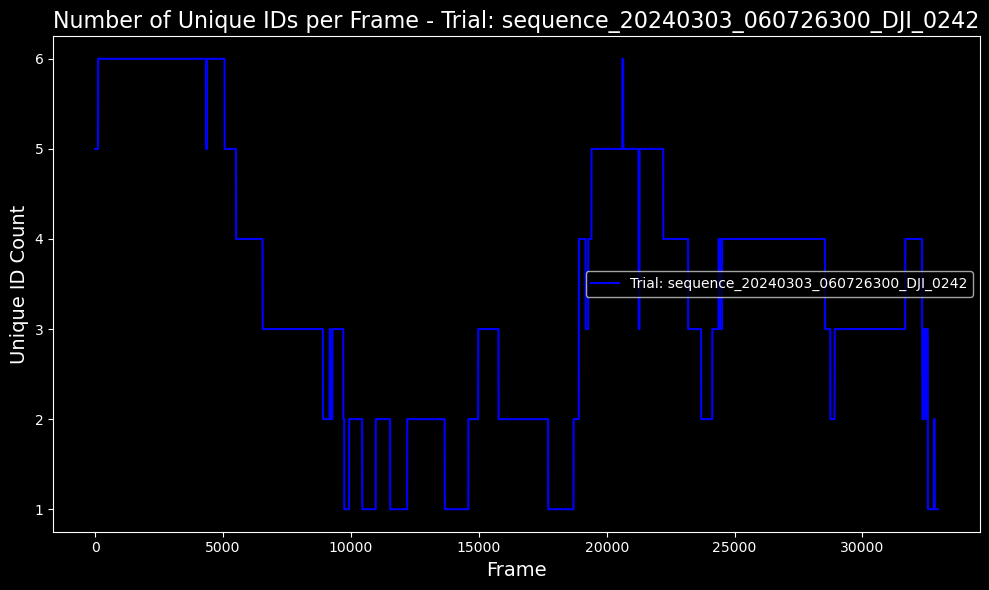

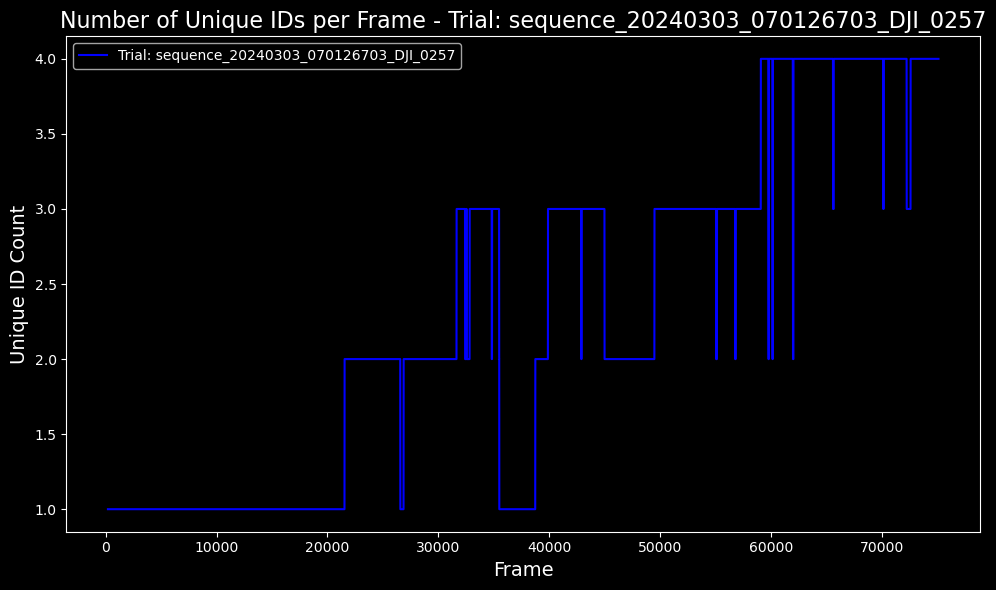

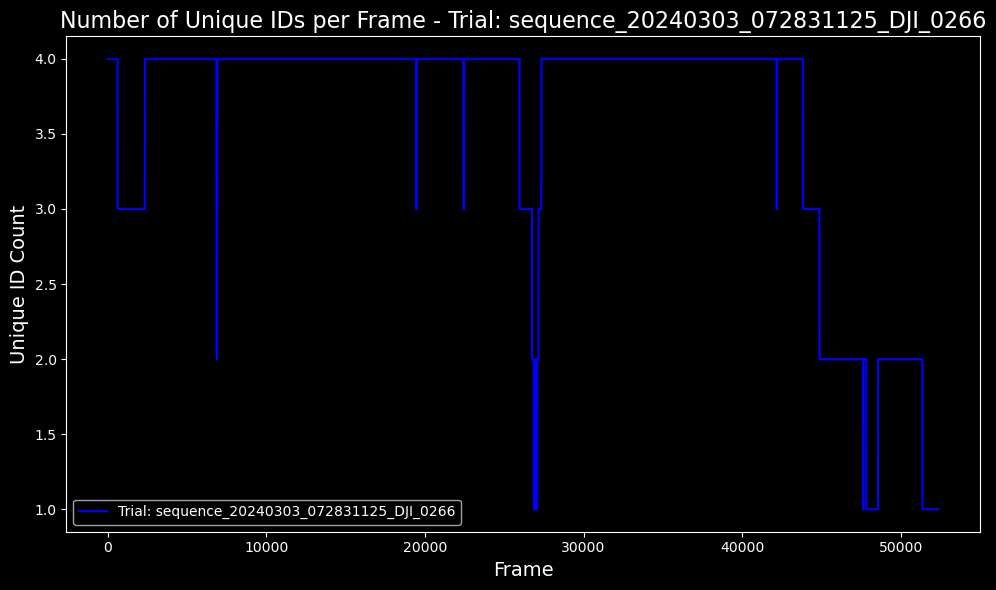

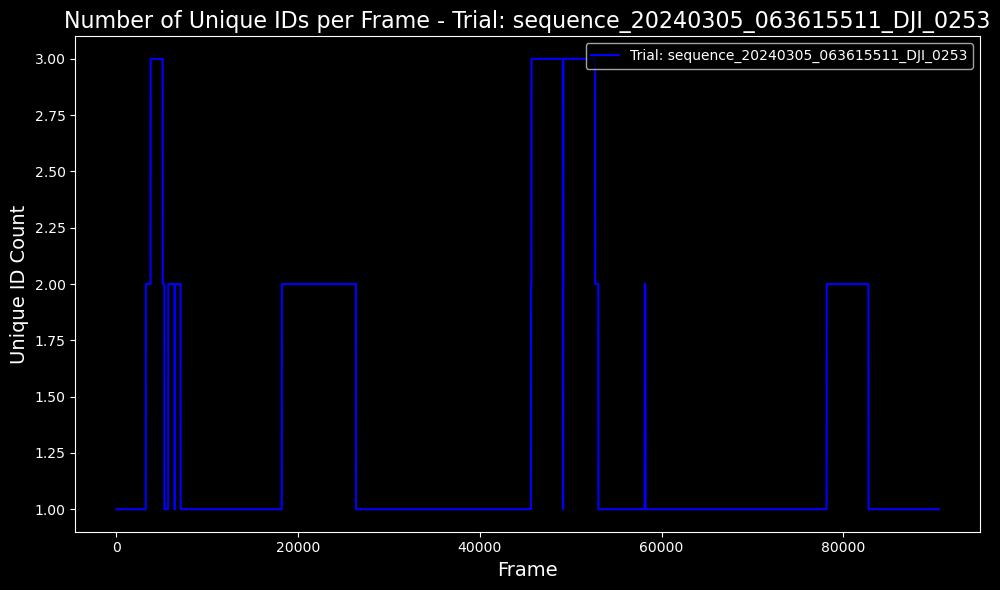

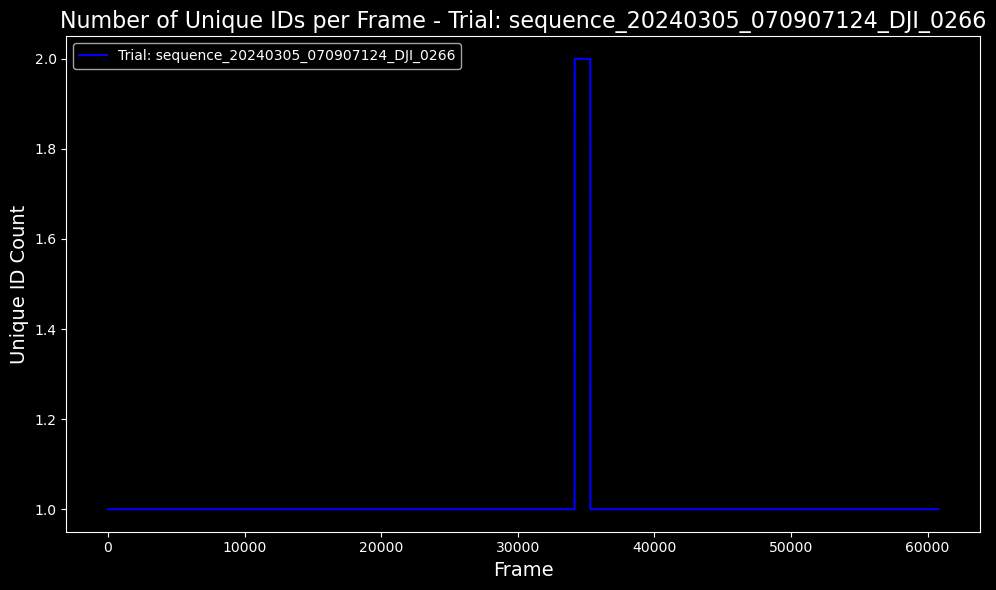

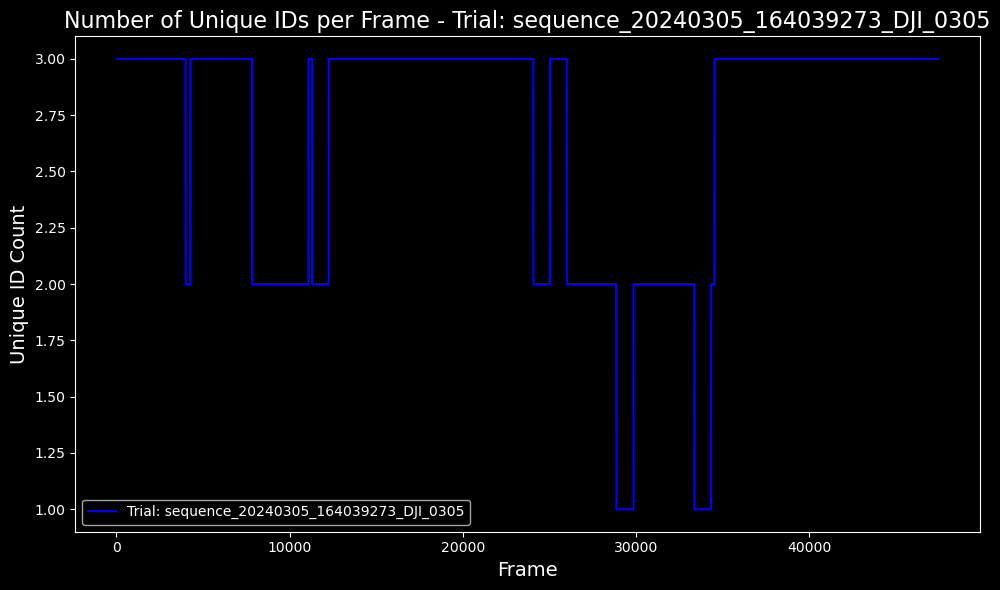

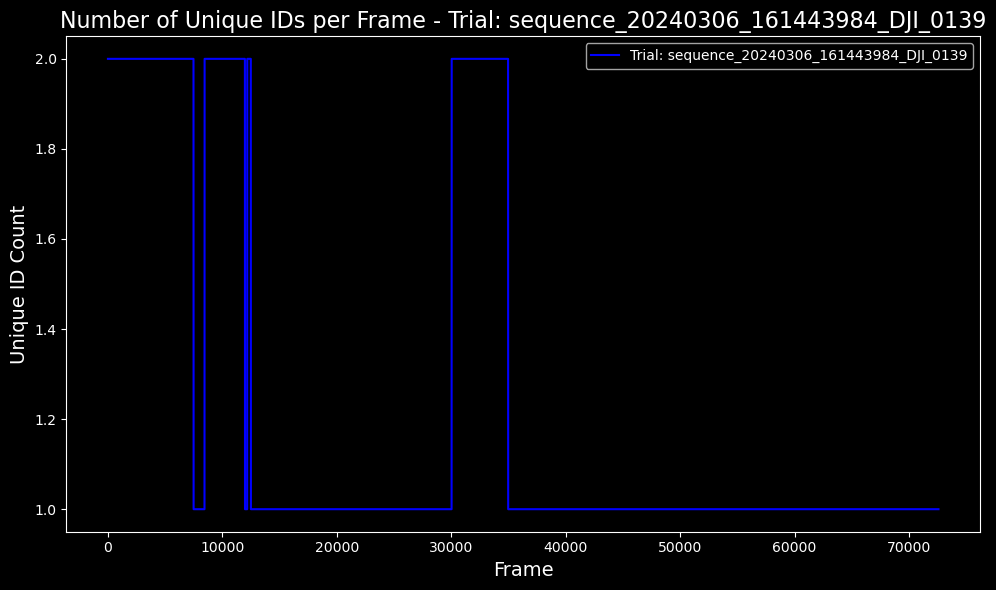

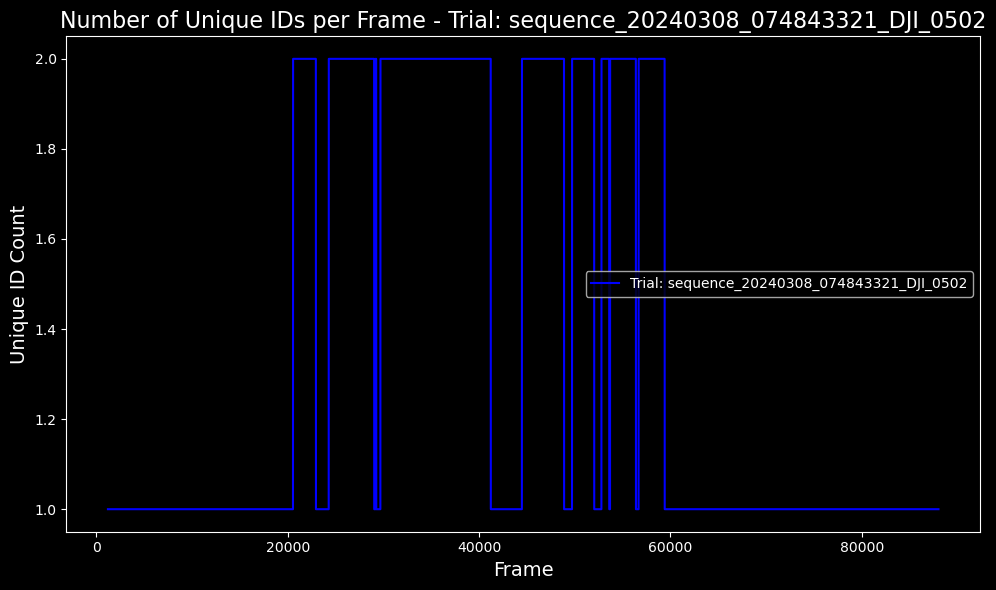

In [72]:

from scipy import stats

# Filter valid IDs (remove NaN and inf)
valid_ids = df_subset[df_subset['headx'].notna() & df_subset['ttipx'].notna()]

# Calculate unique ID count per frame
unique_id_count_per_frame = (
    valid_ids
    .groupby(['frame', 'Trial'])
    .agg(unique_id_count=('ID', 'nunique'))
    .reset_index()
)

# Get the max ID count per trial (to prevent underestimation)
max_ids_per_trial = unique_id_count_per_frame.groupby('Trial')['unique_id_count'].max().reset_index()
max_ids_per_trial.rename(columns={'unique_id_count': 'max_trial_ids'}, inplace=True)

# Merge max ID count to the dataframe
unique_id_count_per_frame = unique_id_count_per_frame.merge(max_ids_per_trial, on='Trial')

# Always recalculate smoothed values (ensures new updates)
unique_id_count_per_frame['unique_id_count'] = (
    unique_id_count_per_frame.groupby('Trial')['unique_id_count']
    .transform(lambda x: x.rolling(50, min_periods=1, center=True).median())
)

# Ensure the count is valid (round & convert to integer)
unique_id_count_per_frame['unique_id_count'] = (
    unique_id_count_per_frame[['unique_id_count', 'max_trial_ids']]
    .min(axis=1)  # Limit to max observed count
    .round()  # Round to nearest whole number
    .astype(int)  # Convert to integer type
)

# Merge smoothed values back into the main dataset (ensures new updates)
df_subset = df_subset.drop(columns=['unique_id_count'], errors='ignore')  # Remove old column if exists
df_subset = df_subset.merge(
    unique_id_count_per_frame[['Trial', 'frame', 'unique_id_count']], 
    on=['Trial', 'frame'],
    how='left'
)

# Generate a plot for each trial
for trial, trial_data in unique_id_count_per_frame.groupby('Trial'):
    plt.figure(figsize=(10, 6))
    plt.plot(
        trial_data['frame'],
        trial_data['unique_id_count'],
        label=f"Trial: {trial}",
        color="blue"
    )
    plt.title(f"Number of Unique IDs per Frame - Trial: {trial}", fontsize=16)
    plt.xlabel("Frame", fontsize=14)
    plt.ylabel("Unique ID Count", fontsize=14)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [10]:
df_subset.head()

,index,SPEED#wcentroid,ID,X#pcentroid,Y#pcentroid,ANGLE,frame,time,headx,heady,...,Y,segment,Trial,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked,smoothed_unique_id_count,unique_id_count
0,0,0.000000,0,-597.556030,30.503662,-0.614673,0,0.00,1982.000000,1478.000000,...,30.503662,1,sequence_20240306_161443984_DJI_0139,1950.000000,1502.000,1,1,1.0,2.0,2.0
1,1,246.525452,0,-601.888000,31.994019,-0.616159,1,0.01,1976.500000,1479.500000,...,31.994019,1,sequence_20240306_161443984_DJI_0139,1945.500000,1502.750,1,1,1.0,2.0,2.0
2,2,301.757548,0,-605.915649,33.496460,-0.620030,2,0.02,1972.333333,1480.333333,...,33.496460,1,sequence_20240306_161443984_DJI_0139,1941.666667,1503.500,1,1,1.0,2.0,2.0
3,3,317.241776,0,-609.988617,34.644623,-0.621046,3,0.03,1968.000000,1481.500000,...,34.644623,1,sequence_20240306_161443984_DJI_0139,1937.500000,1504.625,1,1,1.0,2.0,2.0
4,4,339.523218,0,-613.667163,35.803613,-0.629249,4,0.04,1963.800000,1482.400000,...,35.803613,1,sequence_20240306_161443984_DJI_0139,1933.500000,1505.700,1,1,1.0,2.0,2.0


In [11]:
# Save sharks_df to HDF5
sharks_output_file = os.path.join(output_folder, "subset_sharks.h5")
df_subset.to_hdf(sharks_output_file, key='sharks', mode='w')
print(f"Shark data saved to {sharks_output_file}")

Shark data saved to E:/sophia/shark_data/processed_data/subset_sharks.h5


## NN with and without Carangids

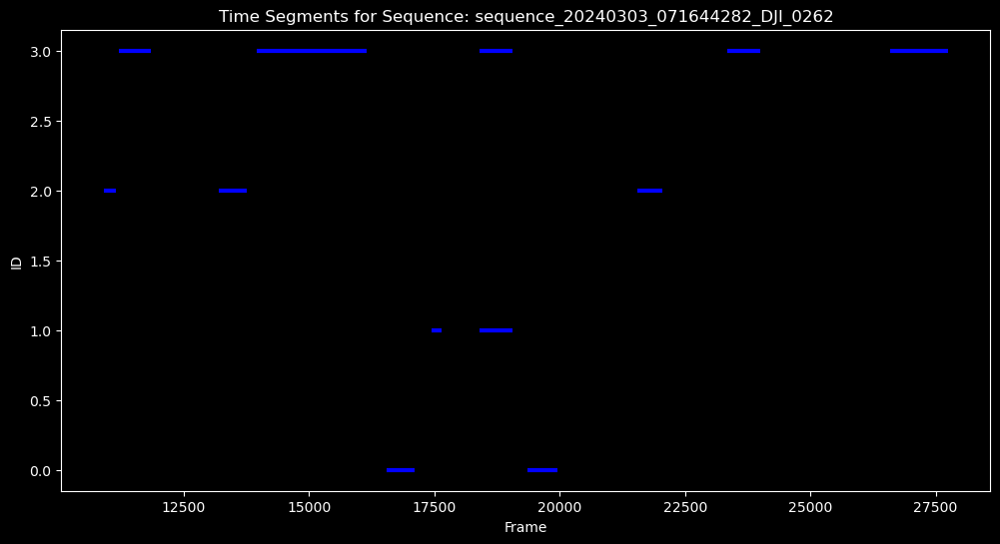

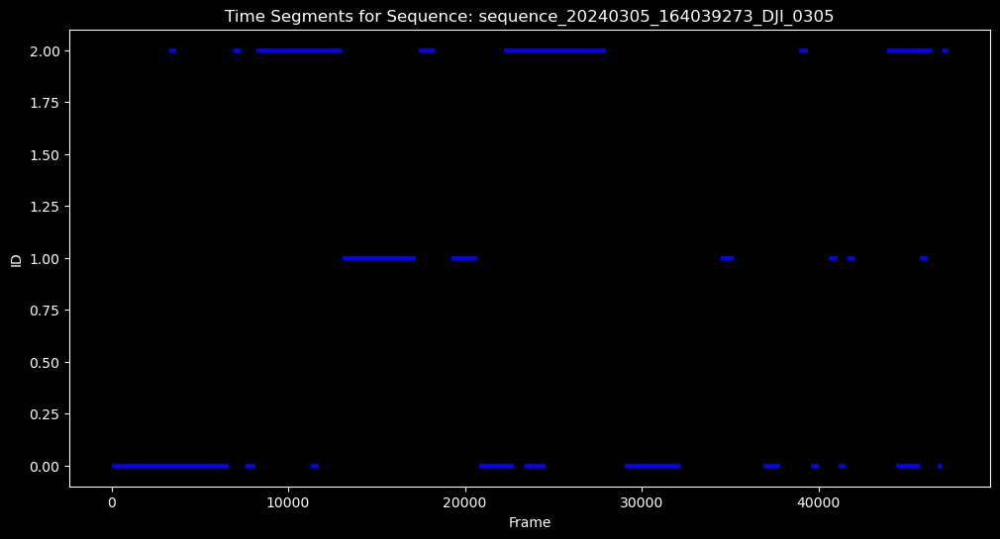

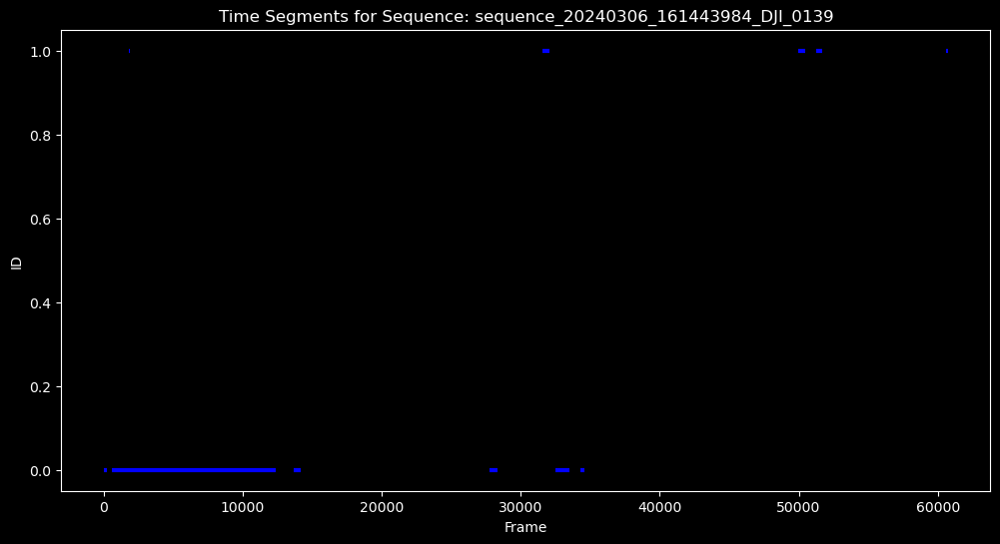

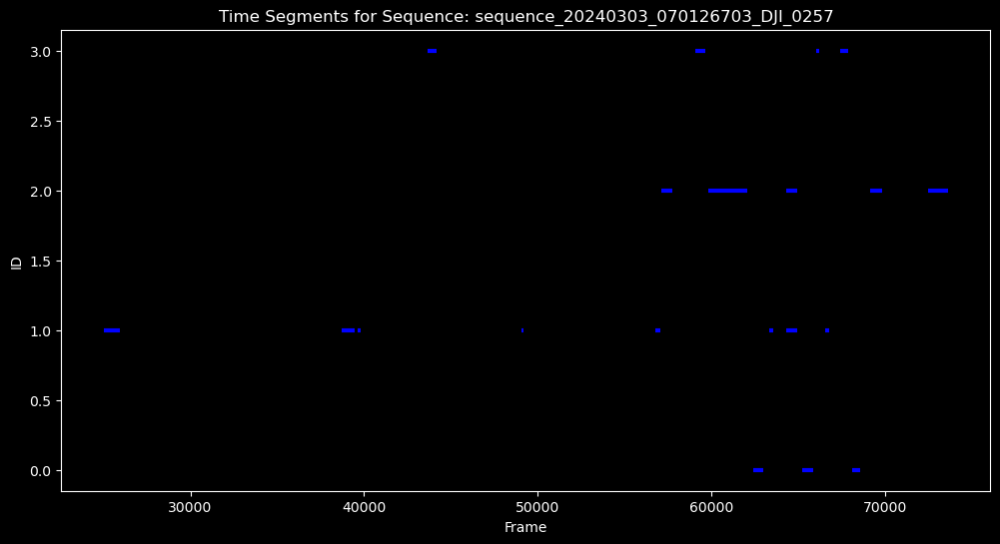

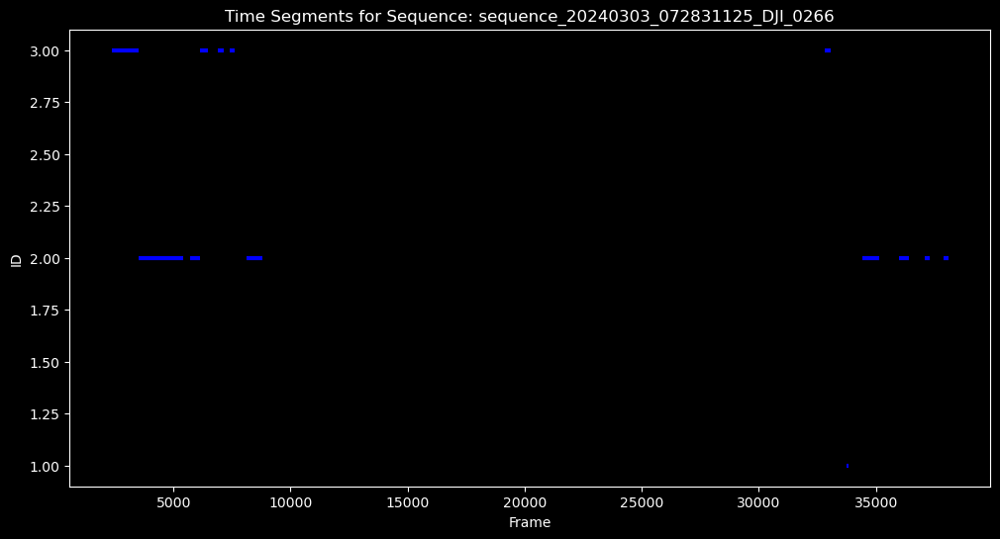

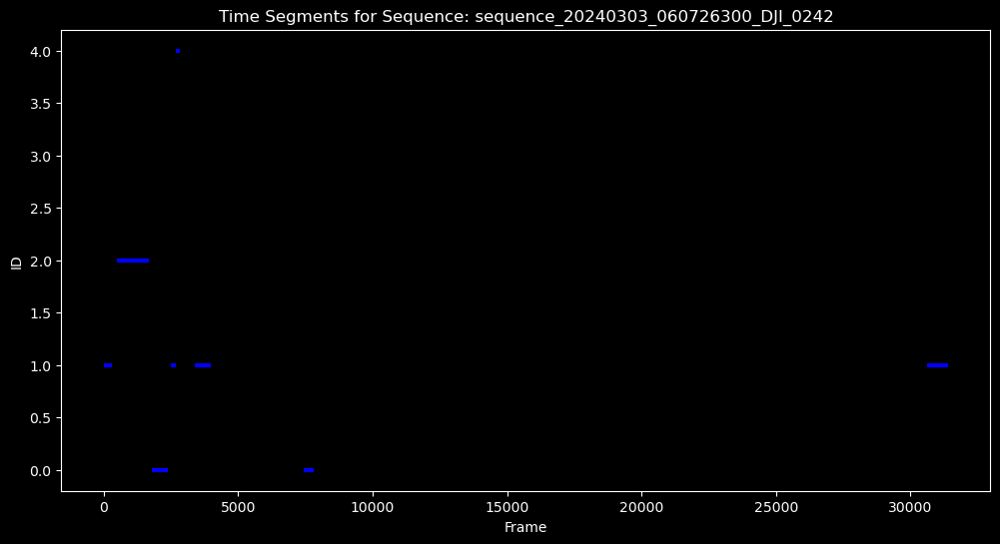

In [24]:
# Loop through each unique sequence_name in the df_carangids DataFrame
for sequence in df_carangids['sequence_name'].unique():
    # Filter the data for the current sequence
    df_sheets_select = df_carangids.loc[df_carangids['sequence_name'] == sequence]
    
    # Create a new plot for each sequence
    plt.figure(figsize=(12, 6))
    
    # Plot horizontal lines for each row in the filtered DataFrame
    for _, row in df_sheets_select.iterrows():
        plt.hlines(y=row['sharkID_carangids'], xmin=row['start_frame'], xmax=row['end_frame'], color='blue', linewidth=3)

    # Labeling and aesthetics
    plt.xlabel('Frame')
    plt.ylabel('ID')
    plt.title(f"Time Segments for Sequence: {sequence}")  # Add a title with the sequence name
    plt.show()


In [29]:
nearest_neighbor_distances.shape

(3, 47488)

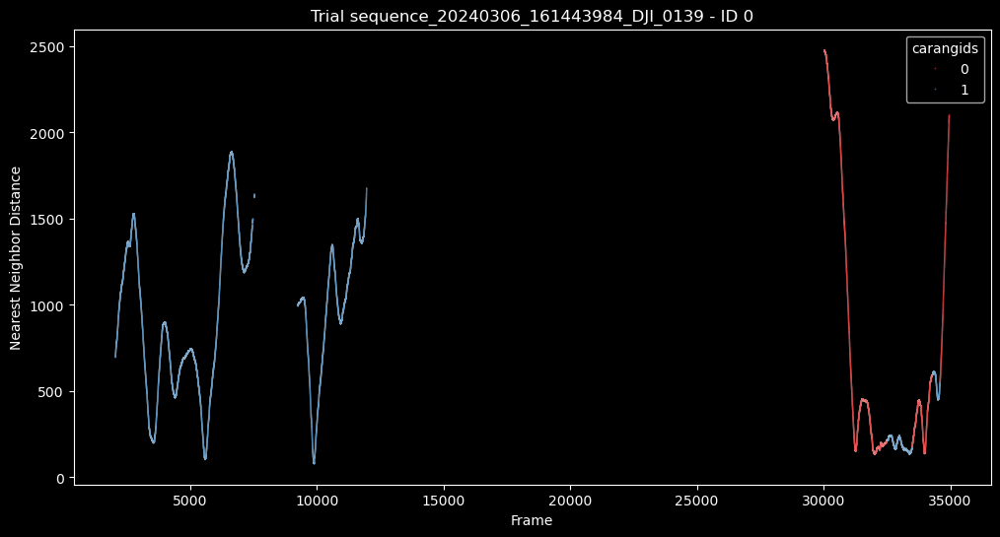

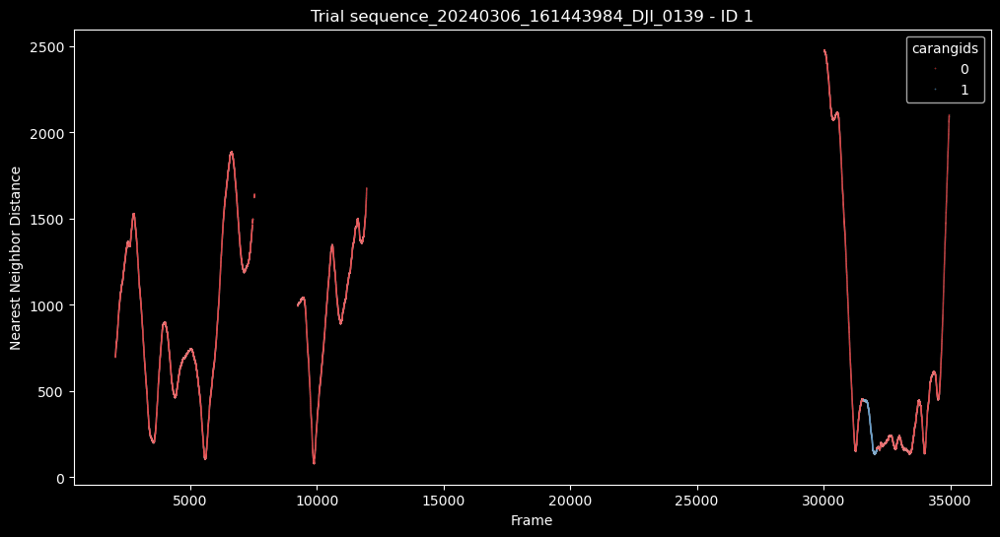

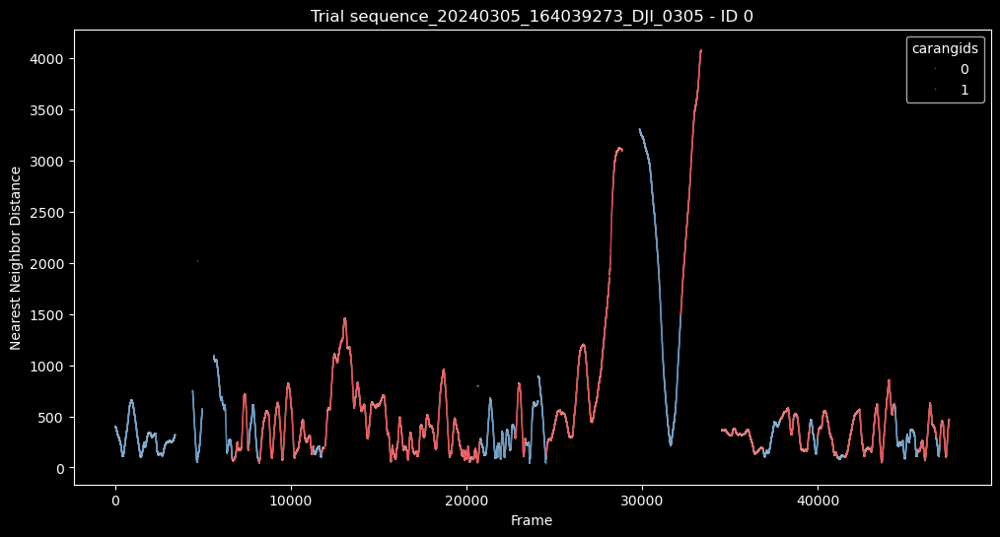

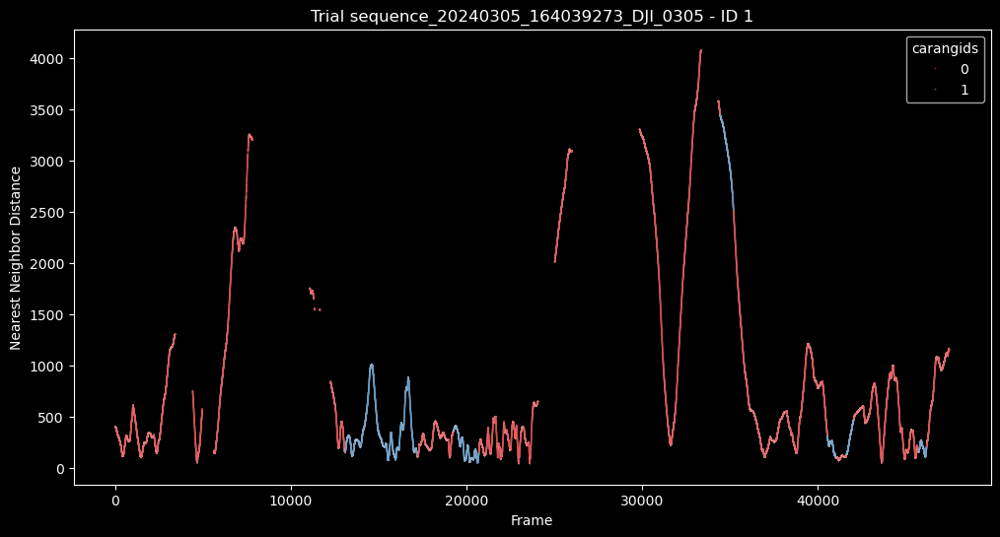

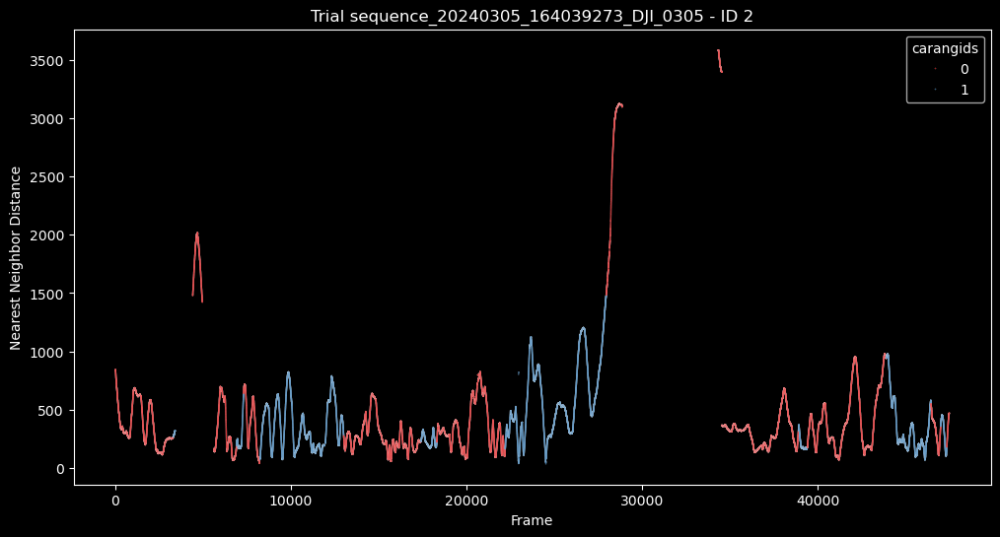

...

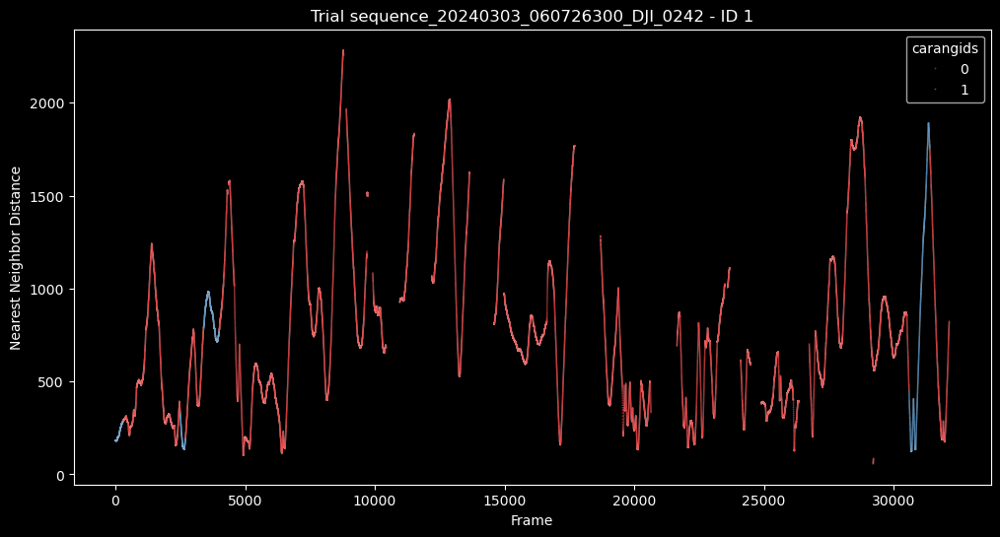

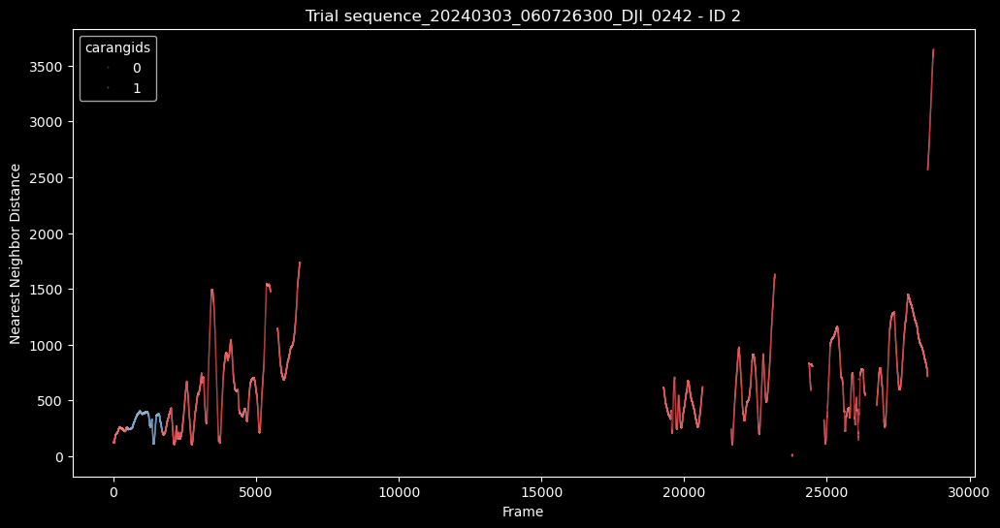

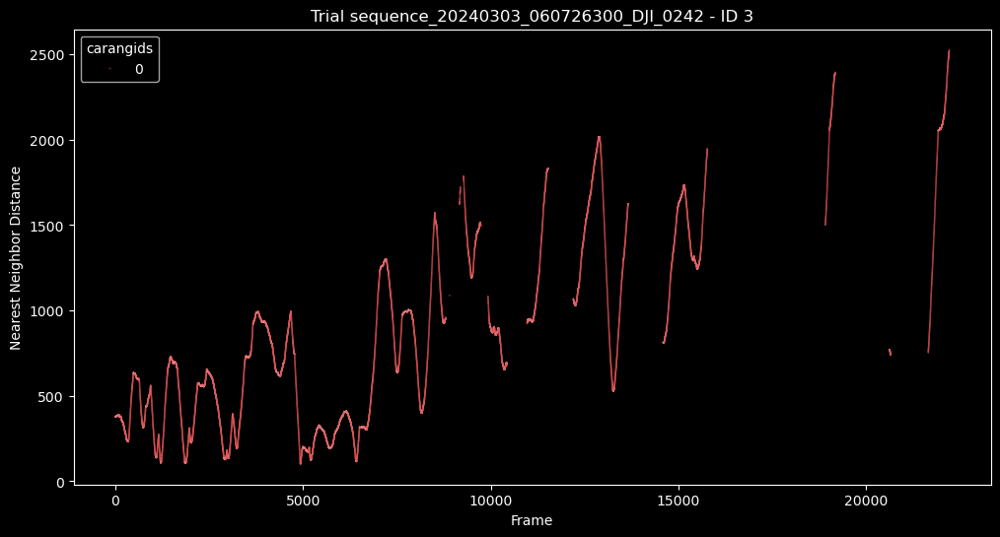

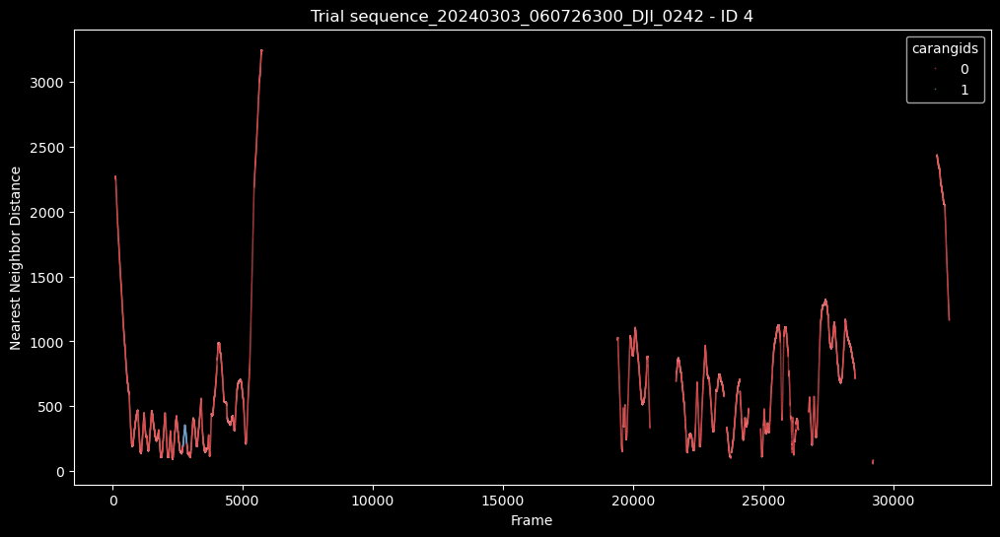

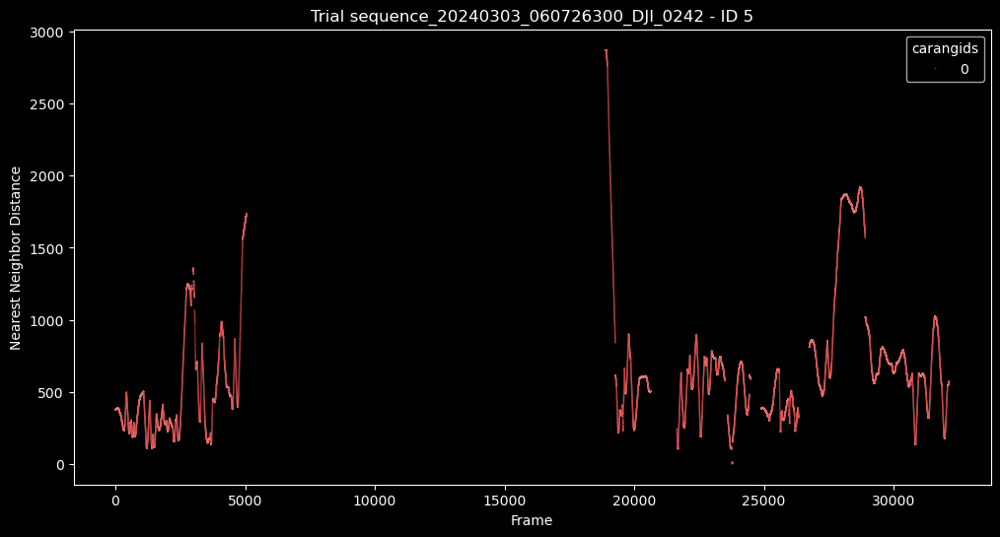

In [25]:
# Loop through each unique Trial
for trial in subset['Trial'].unique():
    trial_data = subset[subset['Trial'] == trial]  # Filter data for the current trial
    
    # Loop through each unique ID in the current trial
    for i in trial_data['ID'].unique():
        plt.figure(figsize=(12, 6))  # Create a new figure for each plot
        
        # Filter the data for the current ID and Trial
        fish_data = trial_data[trial_data['ID'] == i]
        
        # Create the scatter plot with hue based on the 'carangids' column
        sns.scatterplot(x='frame', y='nn_distance', data=fish_data, hue='carangids', palette="Set1", s=1, alpha=0.7)
        
        # Set the title and labels
        plt.title(f"Trial {trial} - ID {i}")
        plt.xlabel('Frame')
        plt.ylabel('Nearest Neighbor Distance')
        
        # Show the plot
        plt.show()


### standardization of speed

In [15]:
sharks_df_filtered.columns

Index(['index', 'SPEED#wcentroid', 'ID', 'ANGLE', 'frame', 'time', 'headx',
       'heady', 'lxfinx', 'lxfiny', 'btipx', 'btipy', 'rxfinx', 'rxfiny',
       'pelvicfinx', 'pelvicfiny', 'sdfinx', 'sdfiny', 'pedunclex',
       'peduncley', 'finx', 'finy', 'ttipx', 'ttipy', 'X', 'Y', 'segment',
       'Trial', 'midpoint_x', 'midpoint_y', 'carangids', 'drone_movement',
       'ID_checked'],
      dtype='object')

In [31]:
def calculate_body_length(df):
    """
    Calculates the smoothed body length using the distances between five points over frames.
    Shows progress in 1000-frame steps per trial.
    """
    body_lengths = []
    frame_count = 0  # Counter for progress tracking

    # Group by Trial, ID, and frame
    for (Trial, ID, frame), frame_data in df.groupby(['Trial', 'ID', 'frame']):
        frame_count += 1

        # Display progress every 1000 frames per trial
        if frame_count % 10000 == 0:
            print(f"Processing: Trial={Trial}, Frame={frame_count}...")

        try:
            # Extract the coordinates for multiple key points
            p1 = frame_data[['headx', 'heady']].values[0]  # Head
            p2 = frame_data[['btipx', 'btipy']].values[0]  # Midsection
            p3 = frame_data[['pedunclex', 'peduncley']].values[0]  # Tail

            # Calculate the Euclidean distances between consecutive key points
            dist1 = np.linalg.norm(p1 - p2)  # Distance between head and midsection
            dist2 = np.linalg.norm(p2 - p3)  # Distance between midsection and pelvic fin

            # Total length for this frame
            total_length = dist1 + dist2
            body_lengths.append((Trial, ID, frame, total_length))
        except Exception as e:
            print(f"Error in processing frame {frame} for Trial {Trial}, ID {ID}: {e}")

    # Convert to DataFrame
    body_length_df = pd.DataFrame(body_lengths, columns=['Trial', 'ID', 'frame', 'body_length'])
    print("Body length calculation completed.")
    print(body_length_df.head())

    # Apply smoothing
    body_length_df['smoothed_body_length'] = body_length_df.groupby(['Trial', 'ID'])['body_length'].transform(
        lambda x: x.rolling(window=10, min_periods=1).mean().fillna(method='bfill').fillna(method='ffill')
    )
    print(body_length_df.head())

    return body_length_df[['Trial', 'ID', 'frame', 'smoothed_body_length']]


def standardize_speed(df, body_length_df):
    """
    Standardizes the speed of animals based on their smoothed body length.
    """
    # Merge smoothed body length back to the main dataframe
    df_speed = df.merge(body_length_df, on=['Trial', 'ID', 'frame'], how='left')

    # Handle division by zero or NaN
    df_speed['standardized_speed'] = df_speed['SPEED#wcentroid'] / df_speed['smoothed_body_length'].replace(0, np.nan)

    return df_speed

# Run the code
body_length_df = calculate_body_length(sharks_df_filtered)
df_speed = standardize_speed(sharks_df_filtered, body_length_df)


Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=10000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=20000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=30000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=40000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=50000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=60000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=70000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=80000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=90000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=100000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=110000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=120000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=130000...
Processing: Trial=sequence_20240303_060726300_DJI_0242, Frame=140000...
P

C:\Users\sophi\AppData\Local\Temp\ipykernel_25024\1195190200.py:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  lambda x: x.rolling(window=10, min_periods=1).mean().fillna(method='bfill').fillna(method='ffill')


Data after merge:    index  SPEED#wcentroid  ID     ANGLE  frame   time        headx  \
0   2051        82.087409   0 -0.435146   2051  40.91  3172.583333   
1   2052        76.964699   0 -0.456252   2052  40.93  3174.333333   
2   2053        75.903308   0 -0.479337   2053  40.95  3175.916667   
3   2054        71.775297   0 -0.500498   2054  40.97  3177.416667   
4   2055        81.043147   0 -0.521608   2055  40.99  3178.833333   

         heady       lxfinx       lxfiny  ...           X           Y  \
0  1069.333333  3139.083333  1064.583333  ...  606.844014 -396.939687   
1  1068.916667  3140.500000  1064.833333  ...  608.723694 -396.273295   
2  1068.416667  3141.833333  1065.000000  ...  610.451965 -395.569743   
3  1067.916667  3143.083333  1065.166667  ...  612.184855 -394.984894   
4  1067.500000  3144.333333  1065.333333  ...  613.870341 -394.378459   

   segment                                 Trial   midpoint_x   midpoint_y  \
0        1  sequence_20240306_161443984_DJI_

In [32]:
df_speed.head()

,index,SPEED#wcentroid,ID,ANGLE,frame,time,headx,heady,lxfinx,lxfiny,...,Y,segment,Trial,midpoint_x,midpoint_y,carangids,drone_movement,ID_checked,smoothed_body_length,standardized_speed
0,2051,82.087409,0,-0.435146,2051,40.91,3172.583333,1069.333333,3139.083333,1064.583333,...,-396.939687,1,sequence_20240306_161443984_DJI_0139,3147.875000,1082.916667,1,0,1.0,83.996995,0.977266
1,2052,76.964699,0,-0.456252,2052,40.93,3174.333333,1068.916667,3140.500000,1064.833333,...,-396.273295,1,sequence_20240306_161443984_DJI_0139,3149.708333,1083.125000,1,0,1.0,84.182158,0.914264
2,2053,75.903308,0,-0.479337,2053,40.95,3175.916667,1068.416667,3141.833333,1065.000000,...,-395.569743,1,sequence_20240306_161443984_DJI_0139,3151.458333,1083.250000,1,0,1.0,84.339474,0.899974
3,2054,71.775297,0,-0.500498,2054,40.97,3177.416667,1067.916667,3143.083333,1065.166667,...,-394.984894,1,sequence_20240306_161443984_DJI_0139,3153.125000,1083.333333,1,0,1.0,84.490452,0.849508
4,2055,81.043147,0,-0.521608,2055,40.99,3178.833333,1067.500000,3144.333333,1065.333333,...,-394.378459,1,sequence_20240306_161443984_DJI_0139,3154.750000,1083.416667,1,0,1.0,84.612222,0.957818


In [26]:
subset['Trial_num']= subset['Trial'].astype('category').cat.codes

In [27]:
nn_distance_avg = subset[['carangids','nn_distance','Trial_num', 'ID']].groupby(['carangids','Trial_num', 'ID']).mean().reset_index()

In [28]:
nn_distance_avg

,carangids,Trial_num,ID,nn_distance
0,0,0,0,679.527019
1,0,0,1,781.172262
2,0,0,2,699.929498
3,0,0,3,861.611746
4,0,0,4,682.995983
5,0,0,5,663.556706
6,0,1,0,636.020581
7,0,1,1,627.316746
8,0,1,2,342.599314
9,0,1,3,566.193073


In [29]:
# Step 1: Calculate each ID's average nn_distance and frame count
id_avg_nn_distance = (
    subset
    .groupby(['carangids', 'Trial_num', 'ID'])
    .agg(
        avg_nn_distance=('nn_distance', 'mean'),  # Average nn_distance per ID
        frame_count=('frame', 'count')           # Total frames per ID
    )
    .reset_index()
)

# Step 2: Calculate the weighted average nn_distance for each Trial_num and carangids
trial_avg_nn_distance = (
    id_avg_nn_distance
    .groupby(['carangids', 'Trial_num'])
    .apply(lambda group: pd.Series({
        'average_nn_distance_Trial': np.average(
            group['avg_nn_distance'], weights=group['frame_count'])})).reset_index())

# Step 3: Combine the ID-level and trial-level data
combined_nn_distance = id_avg_nn_distance.merge(
    trial_avg_nn_distance,
    on=['carangids', 'Trial_num'],
    suffixes=('_ID', '_Trial')
)

# Step 4: Rename columns for clarity (optional)
combined_nn_distance.rename(
    columns={
        'avg_nn_distance': 'average_nn_distance_ID',
        'frame_count': 'frame_count_ID',
        'average_nn_distance_Trial': 'average_nn_distance_Trial',}, 
    inplace=True
)

# Display the result
print(combined_nn_distance)


    carangids  Trial_num  ID  average_nn_distance_ID  frame_count_ID  \
0           0          0   0              679.527019           28992   
1           0          0   1              781.172262           28040   
2           0          0   2              699.929498           28743   
3           0          0   3              861.611746           29944   
4           0          0   4              682.995983           29687   
5           0          0   5              663.556706           29944   
6           0          1   0              636.020581           43981   
7           0          1   1              627.316746           42678   
8           0          1   2              342.599314           19991   
9           0          1   3              566.193073           23157   
10          0          2   0              525.064445           42213   
11          0          2   1              500.895380           48567   
12          0          2   2              529.844867           3

C:\Users\sophi\AppData\Local\Temp\ipykernel_21640\1697716580.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: pd.Series({


<Axes: xlabel='carangids', ylabel='average_nn_distance_ID'>

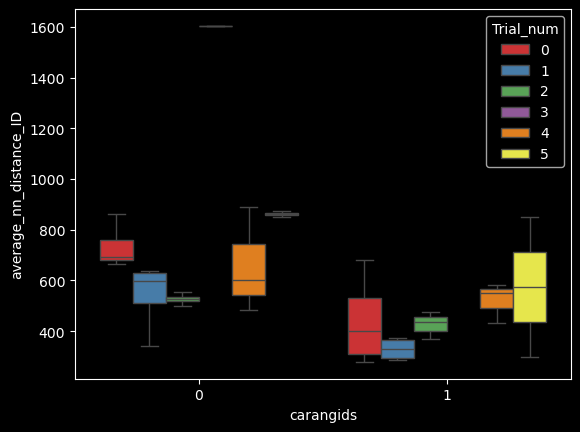

In [32]:
sns.boxplot(x='carangids',y='average_nn_distance_ID',hue='Trial_num',data = combined_nn_distance, palette="Set1")

In [47]:
df_speed['Trial_num']= df_speed['Trial'].astype('category').cat.codes

In [48]:
example_avg_ID = df_speed[['ID','carangids','standardized_speed','Trial_num']].groupby(['carangids','Trial_num','ID']).mean().reset_index()

In [49]:
example_avg_ID

,carangids,Trial_num,ID,standardized_speed
0,0,0,0,0.950354
1,0,0,1,0.844987
2,0,0,2,1.386772
3,0,0,3,1.161933
4,0,0,4,1.282489
5,0,0,5,1.236920
6,0,1,0,1.122232
7,0,1,1,1.037021
8,0,1,2,1.014741
9,0,1,3,1.053379


In [50]:
example_avg = df_speed[['carangids','standardized_speed','Trial_num']].groupby(['carangids','Trial_num']).mean().reset_index()

In [51]:
example_avg

,carangids,Trial_num,standardized_speed
0,0,0,1.093048
1,0,1,1.071062
2,0,2,1.116375
3,0,3,1.008341
4,0,4,1.523848
5,0,5,1.147065
6,1,0,0.811514
7,1,1,1.076947
8,1,2,1.274748
9,1,4,1.516246


In [79]:
# # Step 1: Group data by frame and count unique IDs
# unique_id_count_per_frame = (
#     sharks_df_filtered
#     .groupby(['carangids', 'Trial_num', 'frame'])
#     .agg(unique_id_count=('ID', 'nunique'))  # Count unique IDs per frame
#     .reset_index()
# )

# # Step 2: Merge the unique ID counts back to the original dataset if needed
# sharks_df_with_id_counts = sharks_df_filtered.merge(
#     unique_id_count_per_frame,
#     on=['carangids', 'Trial_num', 'frame'],
#     how='left'
# )

# # Display the result
# print(sharks_df_with_id_counts)

         index  SPEED#wcentroid  ID     ANGLE  frame         time  \
0         2051        82.087409   0 -0.435146   2051    40.910000   
1         2052        76.964699   0 -0.456252   2052    40.930000   
2         2053        75.903308   0 -0.479337   2053    40.950000   
3         2054        71.775297   0 -0.500498   2054    40.970000   
4         2055        81.043147   0 -0.521608   2055    40.990000   
...        ...              ...  ..       ...    ...          ...   
526157  230889        82.872471   3       NaN  75094  1501.769999   
526158  230890        81.299335   3       NaN  75095  1501.789998   
526159  230891        82.149664   3       NaN  75096  1501.809998   
526160  230892        86.303246   3       NaN  75097  1501.829997   
526161  230893        86.318362   3       NaN  75098  1501.849996   

              headx        heady       lxfinx       lxfiny  ...           Y  \
0       3172.583333  1069.333333  3139.083333  1064.583333  ... -396.939687   
1       3174.

In [108]:
# Step 1: Calculate each ID's average nn_distance and frame count
id_avg_speed = (
    sharks_df_filtered
    .groupby(['carangids', 'Trial_num', 'ID'])
    .agg(
        avg_speed=('SPEED#wcentroid', 'mean'),  # Average nn_distance per ID
        frame_count=('frame', 'count')           # Total frames per ID
    )
    .reset_index()
)

# Step 2: Calculate the weighted average nn_distance for each Trial_num and carangids
trial_avg_speed = (
    id_avg_speed
    .groupby(['carangids', 'Trial_num'])
    .apply(lambda group: pd.Series({
        'average_speed_Trial': np.average(
            group['avg_speed'], weights=group['frame_count'])})).reset_index())

# Step 3: Combine the ID-level and trial-level data
combined_speed = id_avg_speed.merge(
    trial_avg_speed,
    on=['carangids', 'Trial_num'],
    suffixes=('_ID', '_Trial')
)

# Step 4: Rename columns for clarity (optional)
combined_speed.rename(
    columns={
        'avg_speed': 'average_speed_ID',
        'frame_count': 'frame_count_ID',
        'average_speed_Trial': 'average_speed_Trial',}, 
    inplace=True
)

# Display the result
print(combined_speed)



    carangids  Trial_num  ID  average_speed_ID  frame_count_ID  \
0           0          0   0        121.660899           37544   
1           0          0   1        103.464458           30408   
2           0          0   2        105.263370           10206   
3           0          0   3        107.312004           17614   
4           0          1   0        112.081780           41109   
5           0          1   1        108.863777           48266   
6           0          1   2        121.983345           36846   
7           0          1   3        120.581196           43033   
8           0          2   0        121.147338           12768   
9           0          2   1        126.496885           36848   
10          0          3   0        114.039449           29078   
11          0          3   1        113.019742           29091   
12          0          3   2        112.725318           25000   
13          0          4   0        107.378509           25513   
14        

C:\Users\sophi\AppData\Local\Temp\ipykernel_2088\122324901.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: pd.Series({


<Axes: xlabel='carangids', ylabel='standardized_speed'>

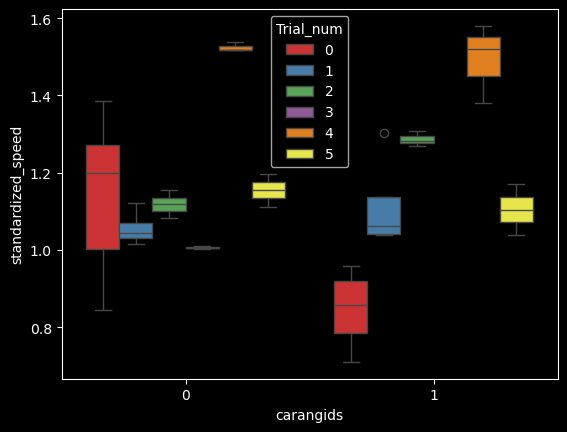

In [52]:
sns.boxplot(x='carangids',y='standardized_speed',hue='Trial_num',data = example_avg_ID, palette="Set1")

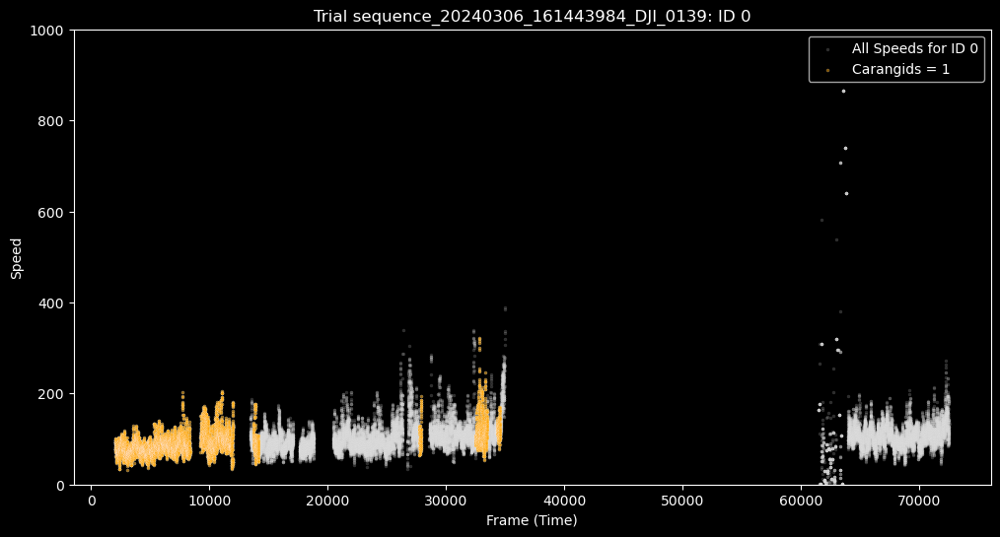

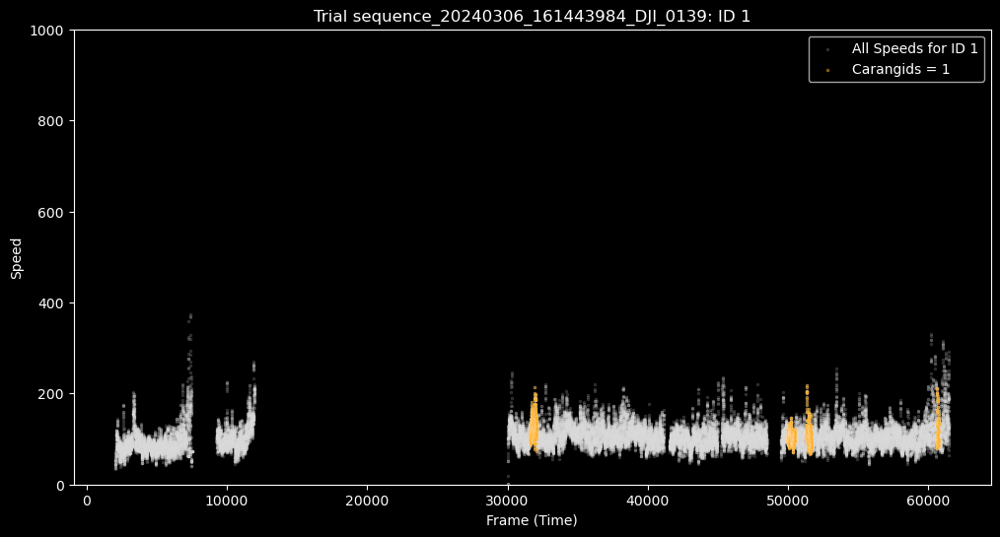

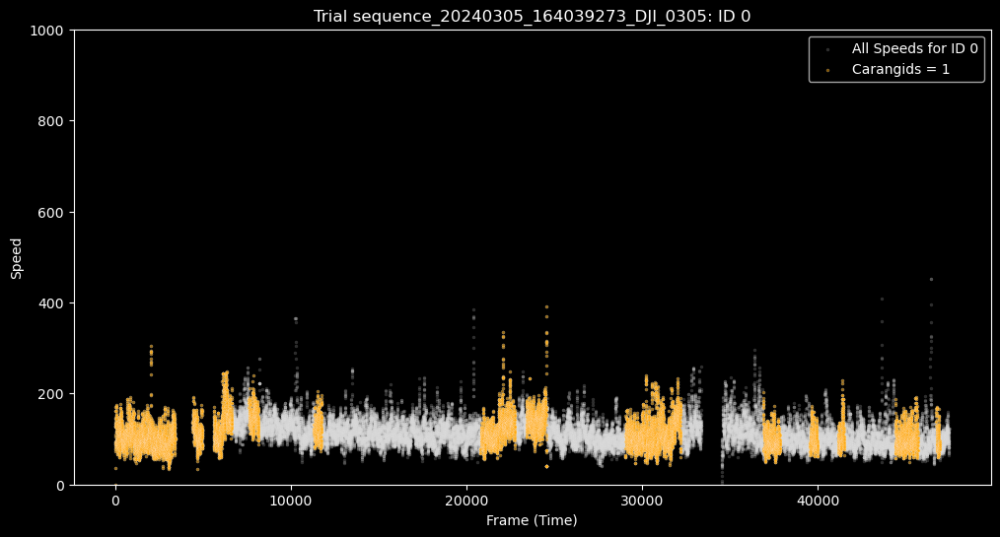

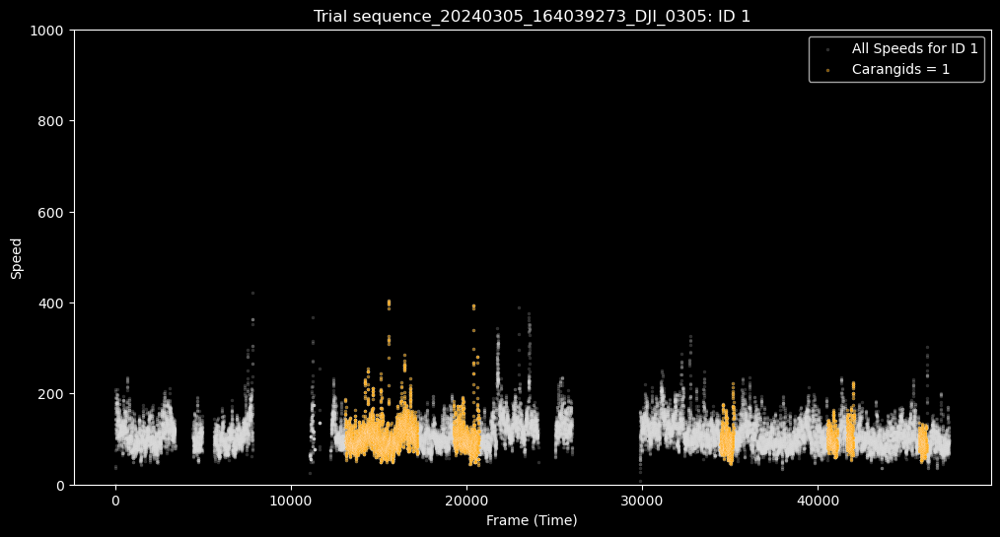

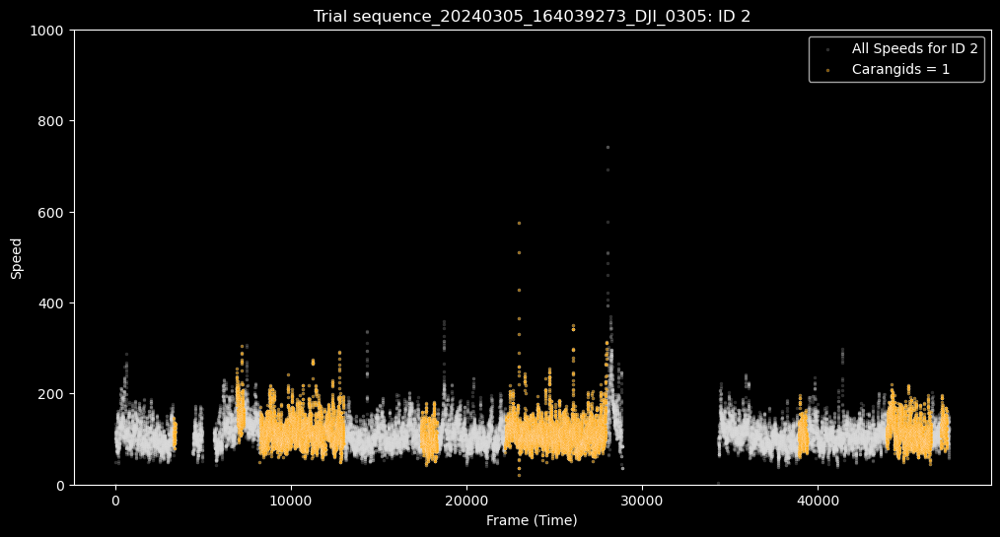

...

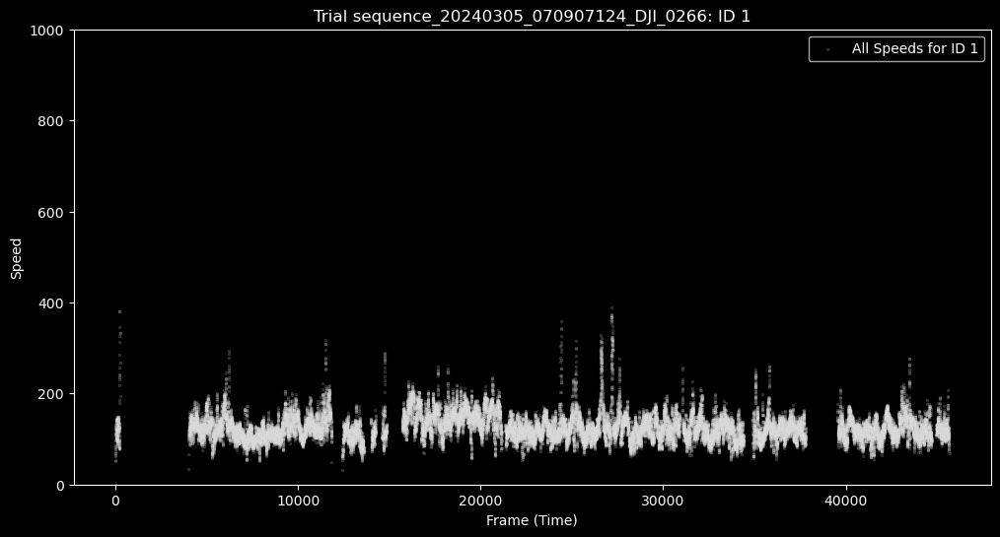

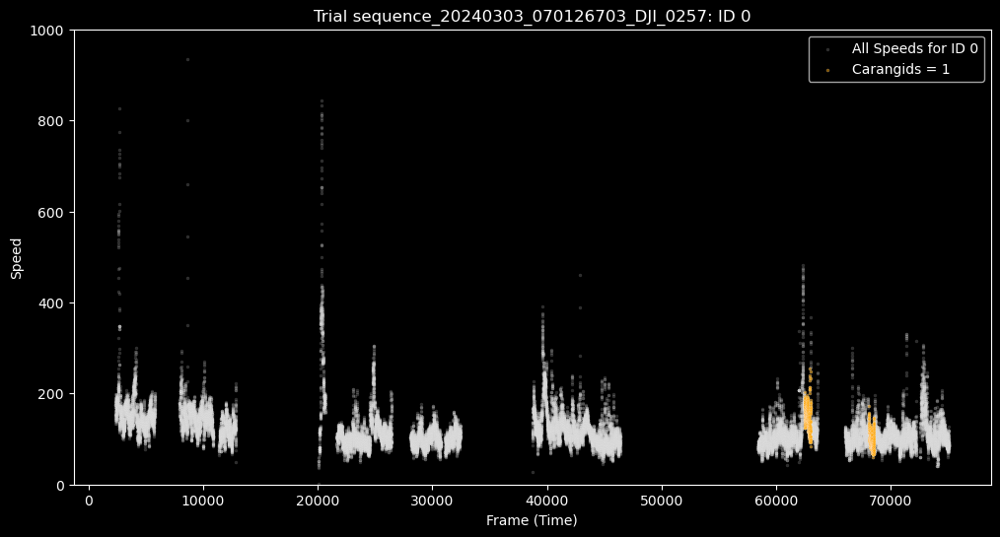

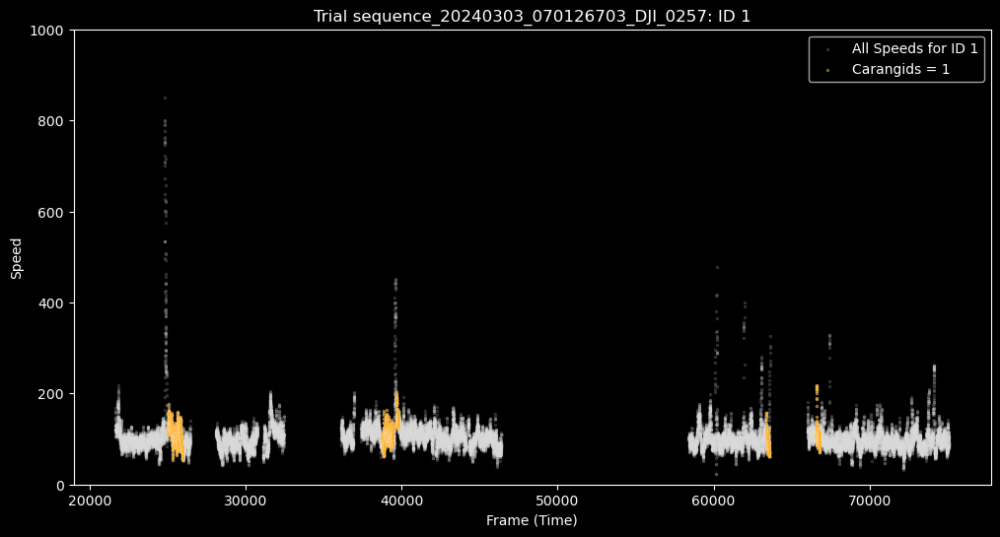

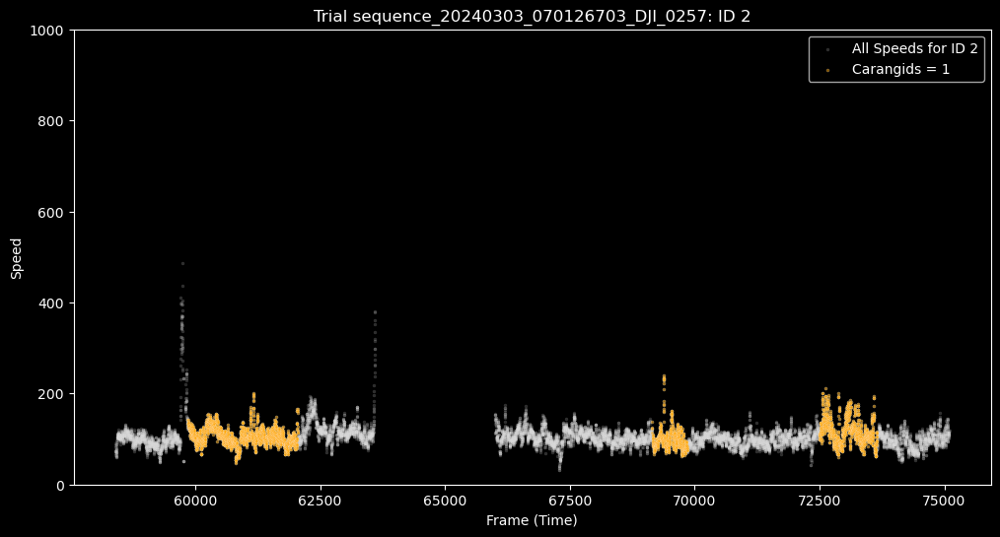

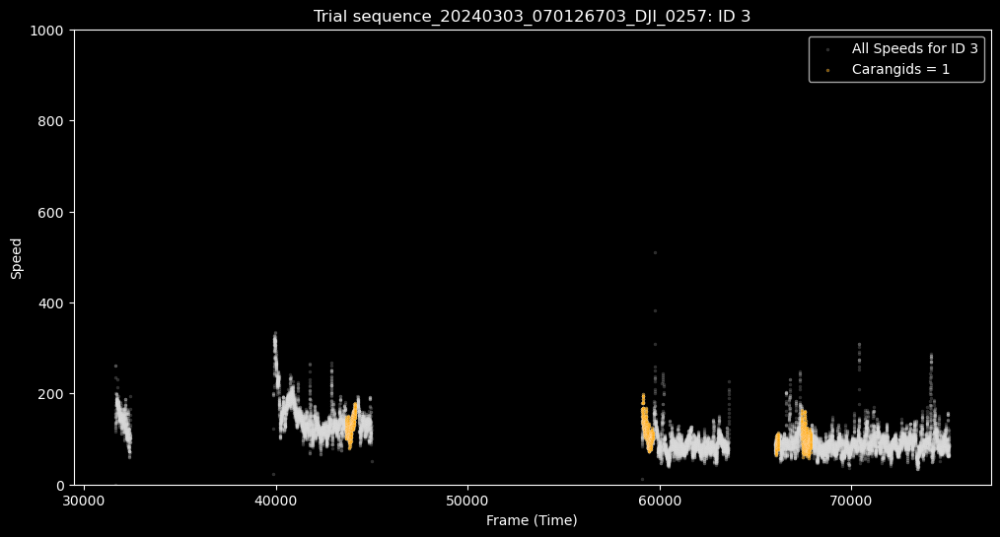

In [34]:
# Get unique Trials
unique_trials = sharks_df_filtered['Trial'].unique()

# Loop through each unique Trial
for trial in unique_trials:
    # Filter data for the current trial
    trial_data = sharks_df_filtered[sharks_df_filtered['Trial'] == trial]
    
    # Get unique IDs in the current trial
    unique_ids = trial_data['ID'].unique()
    
    # Loop through each unique ID within the current trial
    for shark_id in unique_ids:
        # Filter data for the current ID
        id_data = trial_data[trial_data['ID'] == shark_id]
        
        # Create the plot
        plt.figure(figsize=(12, 6))
        
        # Plot all points in light gray with scatterplot
        sns.scatterplot(x=id_data['frame'], y=id_data['SPEED#wcentroid'], color='lightgray', alpha=0.2, s=5, label=f'All Speeds for ID {shark_id}')
        
        # Highlight regions where Carangids = 1 in orange with scatterplot
        carangids_mask = id_data['carangids'] == 1
        sns.scatterplot(x=id_data['frame'][carangids_mask], y=id_data['SPEED#wcentroid'][carangids_mask], color='orange', s=5, alpha=0.5, label='Carangids = 1')
        
        # Set y-axis limit
        plt.ylim(0, 1000)
        
        # Plot styling
        plt.title(f"Trial {trial}: ID {shark_id}")  # Add Trial and ID to the plot title
        plt.xlabel('Frame (Time)')
        plt.ylabel('Speed')
        plt.legend()
        plt.show()

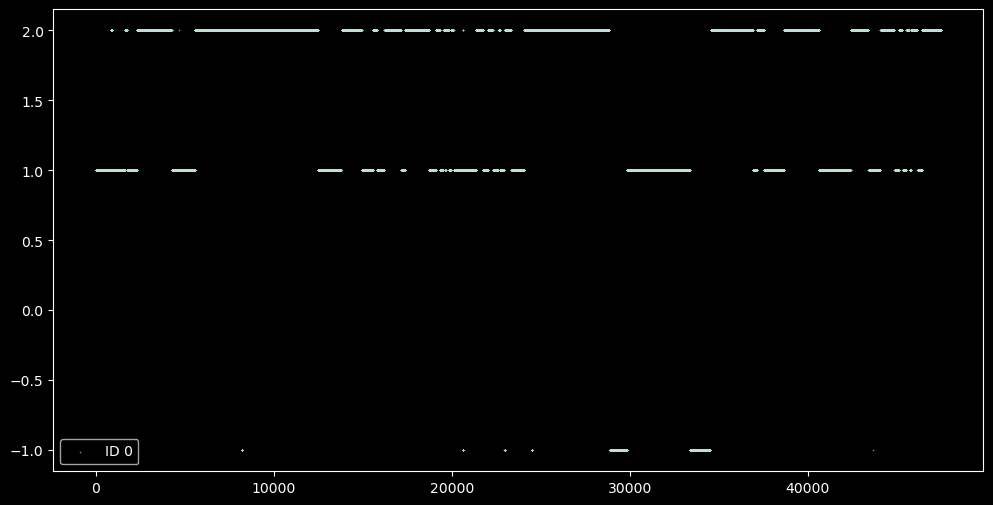

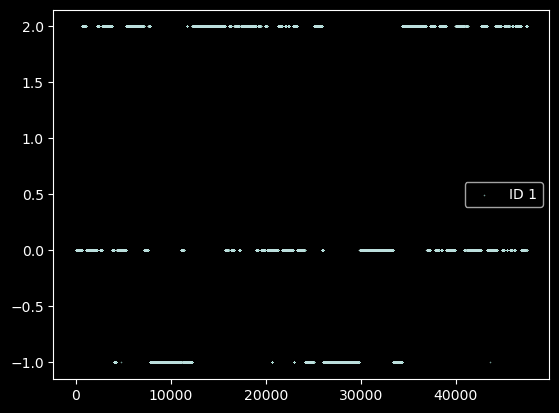

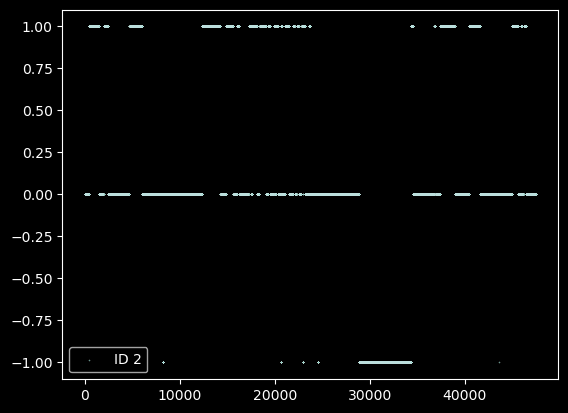

In [30]:
plt.figure(figsize=(12, 6))

# Determine the maximum frame count based on nearest_neighbor_distances
max_frames = nearest_neighbor_distances.shape[1]  # Get the number of frames for the data

for i in range(3):  # Loop through the first three IDs
    # Plot the scatter plot for the nearest neighbor distances for each ID
    sns.scatterplot(x=range(max_frames), y=nearest_neighbor_distances[i, :max_frames], label=f'ID {i}', s=1, alpha=0.7)
    plt.show()

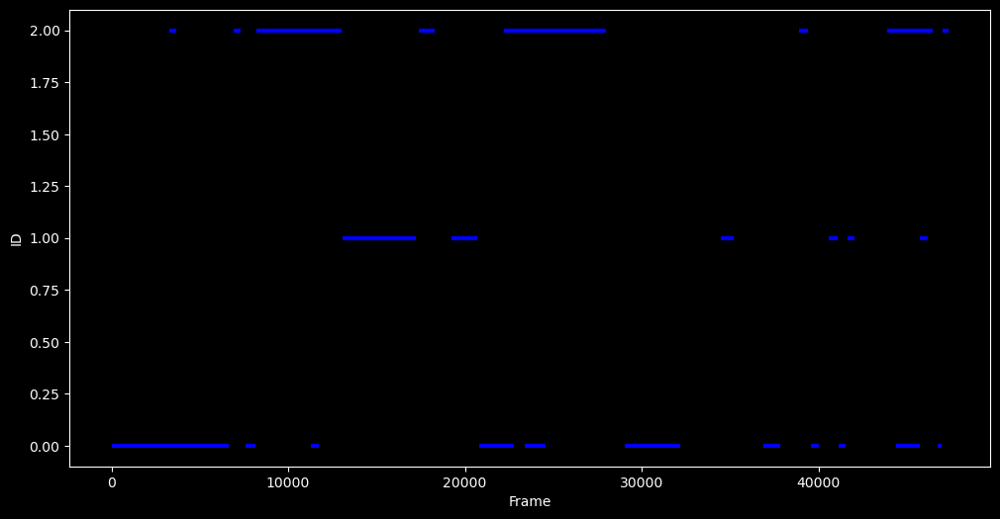

In [28]:
# Filter the data to include only frames where carangids = 1
subset_carangids_1 = subset[subset['carangids'] == 1]

# Identify periods where each ID maintains carangids = 1
id_ranges = []
current_id = None
current_start = None

# Iterate through the DataFrame, grouped by ID, to detect separate periods of carangids = 1
for id_, group in subset_carangids_1.groupby('ID'):
    # Sort by frame to ensure continuous detection
    group = group.sort_values('frame')
    current_start = group['frame'].iloc[0]
    
    # Track the end of each contiguous sequence
    for i in range(1, len(group)):
        if group['frame'].iloc[i] != group['frame'].iloc[i - 1] + 1:
            # If the current frame is not a continuation, log the previous segment
            id_ranges.append((id_, current_start, group['frame'].iloc[i - 1]))
            current_start = group['frame'].iloc[i]
    
    # Log the last segment for this ID
    id_ranges.append((id_, current_start, group['frame'].iloc[-1]))

# Convert to DataFrame
id_ranges_df = pd.DataFrame(id_ranges, columns=['ID', 'range_start', 'range_end'])

# Create the plot
plt.figure(figsize=(12, 6))

# Plot horizontal lines showing the time duration for each segment of each ID
for _, row in id_ranges_df.iterrows():
    plt.hlines(y=row['ID'], xmin=row['range_start'], xmax=row['range_end'], color='blue', linewidth=3)

# Labeling and aesthetics
plt.xlabel('Frame')
plt.ylabel('ID')
plt.show()


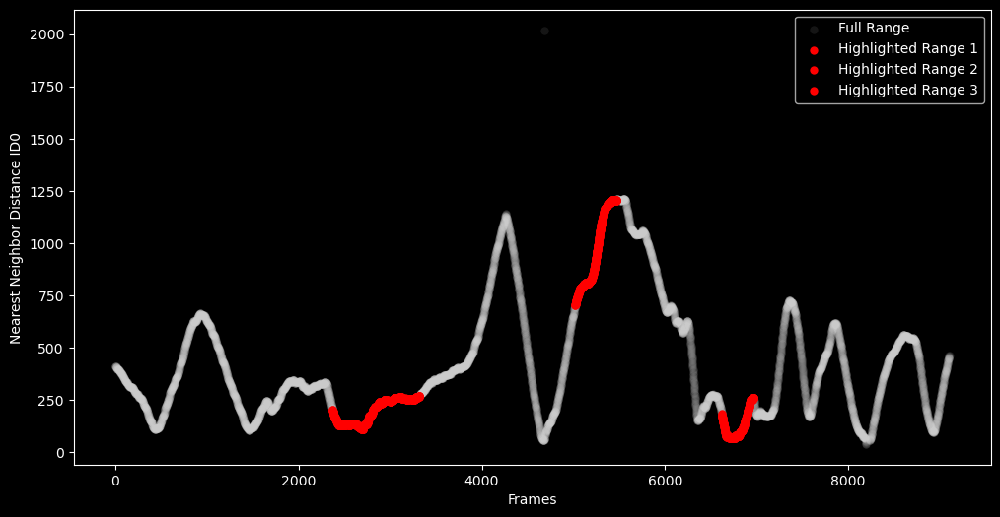

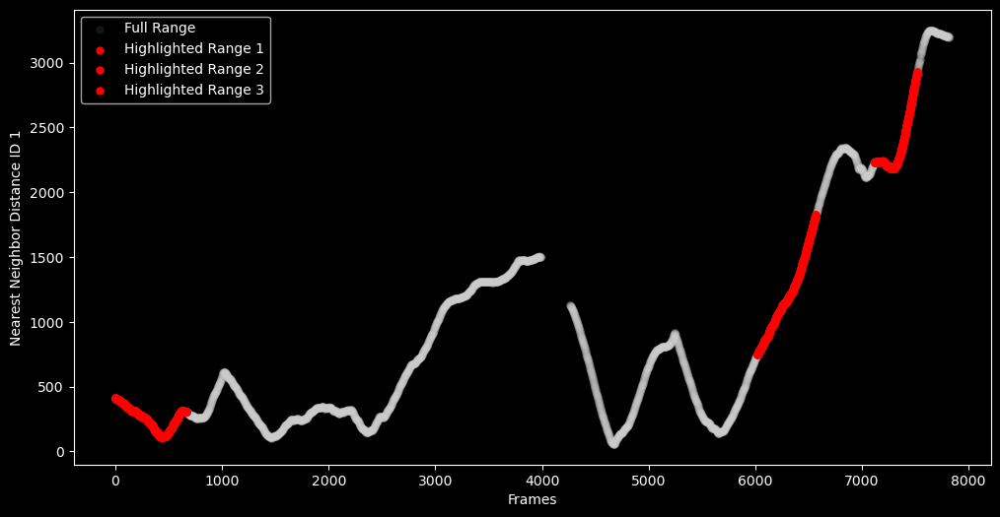

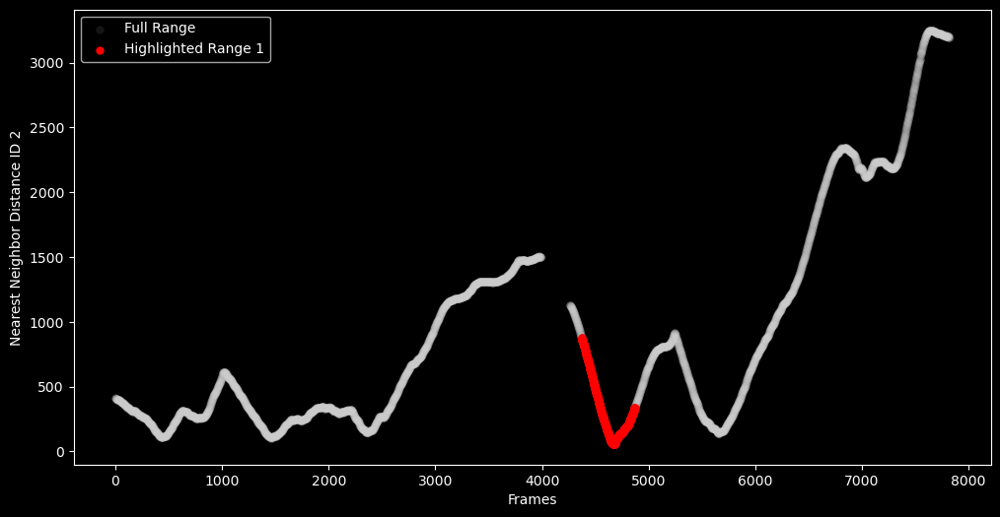

In [32]:
plt.figure(figsize=(12, 6))

# Plot the full range of nearest neighbor distances from 0 to 9104 (excluding highlighted parts)
full_range = range(0, 9104)
sns.scatterplot(x=full_range, y=nearest_neighbor_distances[0, 0:9104], color='lightgray', label='Full Range', alpha=0.1,linewidth=0)

# Highlight the specific frame ranges
sns.scatterplot(x=range(2370, 3320), y=nearest_neighbor_distances[0, 2370:3320], color='red', label='Highlighted Range 1',linewidth=0)
sns.scatterplot(x=range(5020, 5470), y=nearest_neighbor_distances[0, 5020:5470], color='red', label='Highlighted Range 2',linewidth=0)
sns.scatterplot(x=range(6620, 6970), y=nearest_neighbor_distances[0, 6620:6970], color='red', label='Highlighted Range 3',linewidth=0)

plt.xlabel('Frames')
plt.ylabel('Nearest Neighbor Distance ID0')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))

# Plot the full range of nearest neighbor distances for ID 1 from 0 to 9104
full_range = range(0, 9104)
sns.scatterplot(x=full_range, y=nearest_neighbor_distances[1, 0:9104], color='lightgray', label='Full Range', alpha=0.1,linewidth=0)

# Highlight the new ranges for ID 1 (adjusted by subtracting 34530)
sns.scatterplot(x=range(0, 670), y=nearest_neighbor_distances[1, 0:670], color='red', label='Highlighted Range 1',linewidth=0)
sns.scatterplot(x=range(6020, 6570), y=nearest_neighbor_distances[1, 6020:6570], color='red', label='Highlighted Range 2',linewidth=0)
sns.scatterplot(x=range(7120, 7520), y=nearest_neighbor_distances[1, 7120:7520], color='red', label='Highlighted Range 3',linewidth=0)

plt.xlabel('Frames')
plt.ylabel('Nearest Neighbor Distance ID 1')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))

# Plot the full range of nearest neighbor distances for ID 1 from 0 to 9104
full_range = range(0, 9104)
sns.scatterplot(x=full_range, y=nearest_neighbor_distances[1, 0:9104], color='lightgray', label='Full Range', alpha=0.1,linewidth=0)

# Highlight the new ranges for ID 1 (adjusted by subtracting 34530)
sns.scatterplot(x=range(4370, 4870), y=nearest_neighbor_distances[1, 4370:4870], color='red', label='Highlighted Range 1',linewidth=0)

plt.xlabel('Frames')
plt.ylabel('Nearest Neighbor Distance ID 2')
plt.legend()
plt.show()

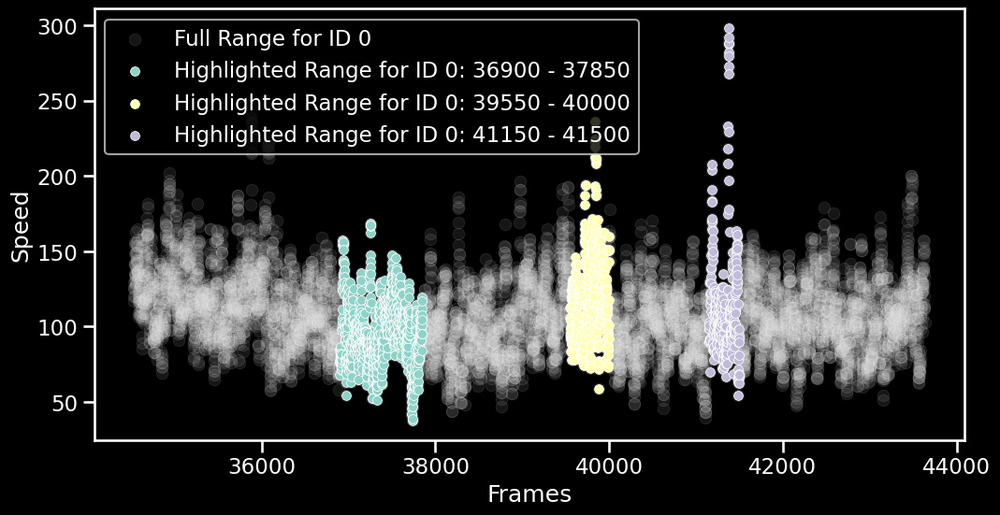

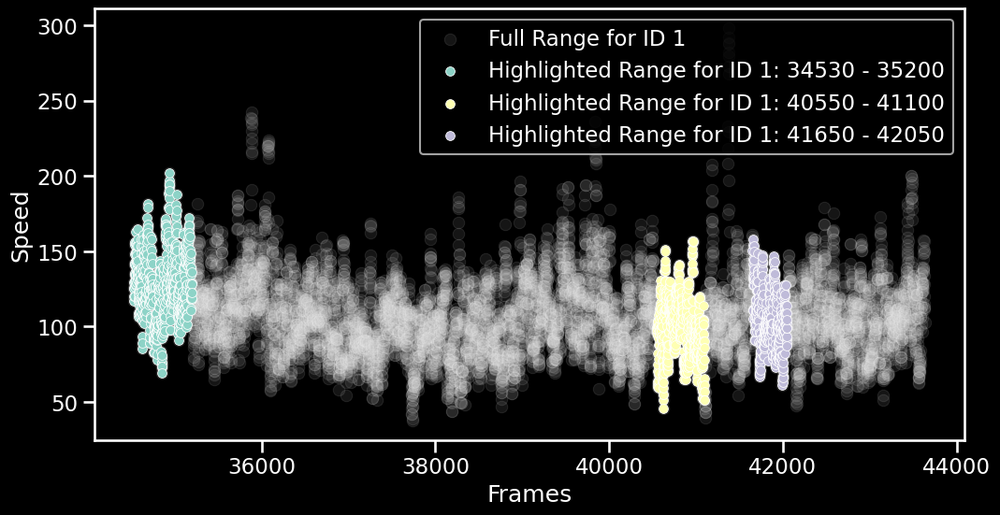

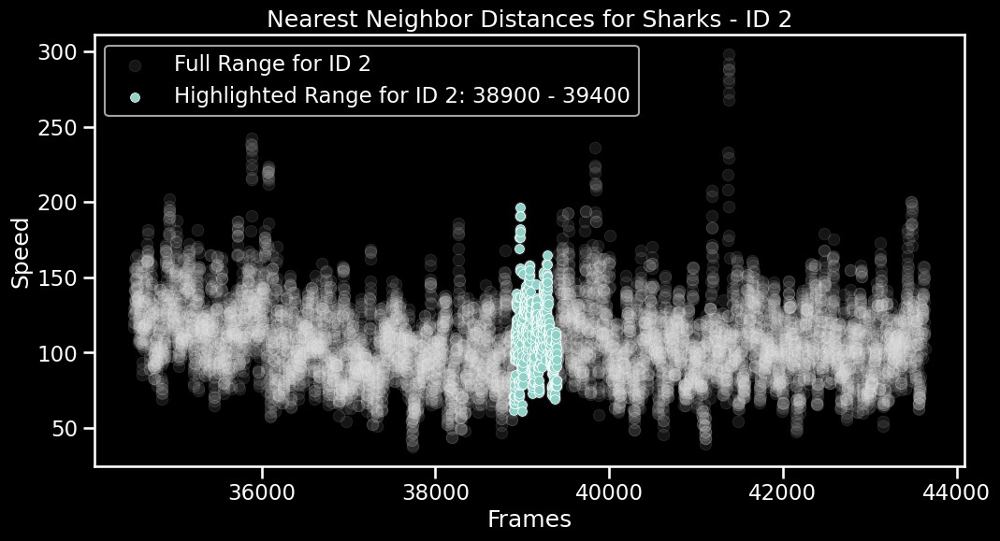

In [129]:

# Set up the figure for ID 0
plt.figure(figsize=(12, 6))

# Extract ranges for ID 0
ranges_id_0 = id_ranges_df[id_ranges_df['ID'] == 0]

# Plot full range for ID 0
fullrange_id_0 = range(34530, 43633)
sns.scatterplot(x=fullrange_id_0, 
                y=sharks_df['SPEED#wcentroid'].iloc[34530:43633], 
                color='lightgray', label='Full Range for ID 0', alpha=0.1)

# Plot each highlighted range for ID 0
for index, row in ranges_id_0.iterrows():
    start = row['range_start']
    end = row['range_end']
    sns.scatterplot(x=range(start, end), 
                    y=sharks_df['SPEED#wcentroid'].iloc[start:end], 
                    label=f'Highlighted Range for ID 0: {start} - {end}', 
                    s=50)

plt.xlabel('Frames')
plt.ylabel('Speed')
plt.legend()
plt.show()

# Set up the figure for ID 1
plt.figure(figsize=(12, 6))

# Extract ranges for ID 1
ranges_id_1 = id_ranges_df[id_ranges_df['ID'] == 1]

# Plot full range for ID 1
fullrange_id_1 = range(34530, 43633)
sns.scatterplot(x=fullrange_id_1, 
                y=sharks_df['SPEED#wcentroid'].iloc[34530:43633], 
                color='lightgray', label='Full Range for ID 1', alpha=0.1)

# Plot each highlighted range for ID 1
for index, row in ranges_id_1.iterrows():
    start = row['range_start']
    end = row['range_end']
    sns.scatterplot(x=range(start, end), 
                    y=sharks_df['SPEED#wcentroid'].iloc[start:end], 
                    label=f'Highlighted Range for ID 1: {start} - {end}', 
                    s=50)

plt.xlabel('Frames')
plt.ylabel('Speed')
plt.legend()
plt.show()

# Set up the figure for ID 2
plt.figure(figsize=(12, 6))

# Extract ranges for ID 2
ranges_id_2 = id_ranges_df[id_ranges_df['ID'] == 2]

# Plot full range for ID 2
sns.scatterplot(x=fullrange_id_0, 
                y=sharks_df['SPEED#wcentroid'].iloc[34530:43633], 
                color='lightgray', label='Full Range for ID 2', alpha=0.1)

# Plot each highlighted range for ID 2
for index, row in ranges_id_2.iterrows():
    start = row['range_start']
    end = row['range_end']
    sns.scatterplot(x=range(start, end), 
                    y=sharks_df['SPEED#wcentroid'].iloc[start:end], 
                    label=f'Highlighted Range for ID 2: {start} - {end}', 
                    s=50)

plt.xlabel('Frames')
plt.ylabel('Speed')
plt.title('Nearest Neighbor Distances for Sharks - ID 2')
plt.legend()
plt.show()

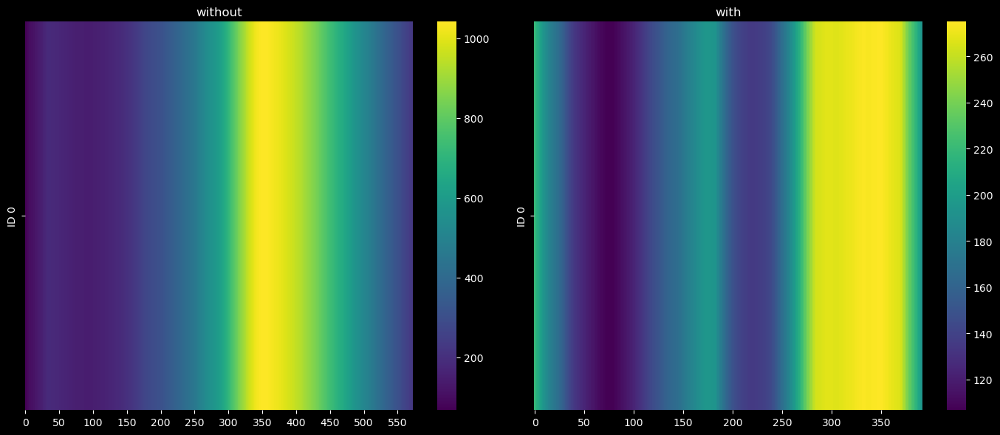

In [42]:
plt.figure(figsize=(14, 6))  # Create a single figure for both subplots

# First heatmap (frames 574-966)
plt.subplot(1, 2, 2)  # Create the first subplot (1 row, 2 columns, 1st plot)
sns.heatmap(nearest_neighbor_distances[0:1, 574:966], cmap='viridis', cbar=True, 
            xticklabels=50, yticklabels=['ID 0'])
plt.title('with')

# Second heatmap (frames 0-573)
plt.subplot(1, 2, 1)  # Create the second subplot (1 row, 2 columns, 2nd plot)
sns.heatmap(nearest_neighbor_distances[0:1, 0:573], cmap='viridis', cbar=True, 
            xticklabels=50, yticklabels=['ID 0'])
plt.title('without')

plt.tight_layout()  # Adjust layout to fit everything neatly
plt.show()


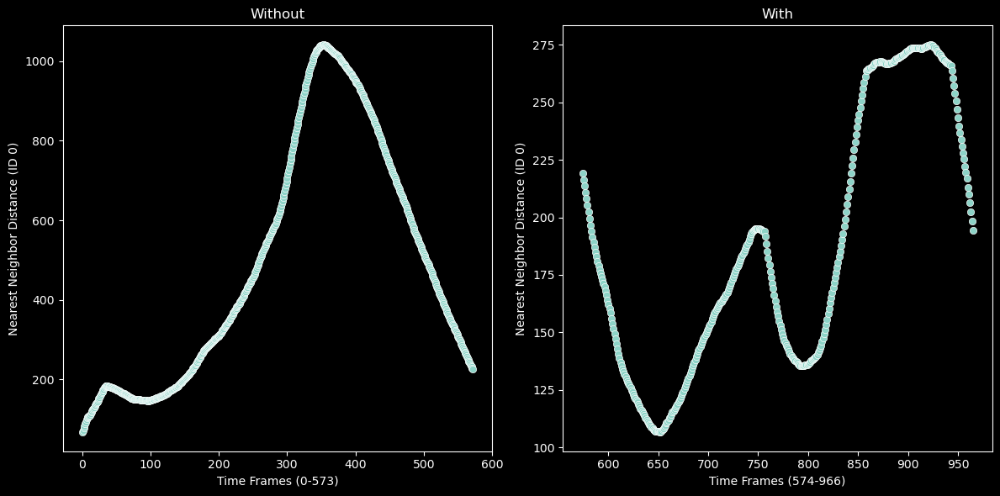

In [43]:
# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(12, 6))

# First scatter plot (frames 574-966)
plt.subplot(1, 2, 1)  # First subplot (left side)
sns.scatterplot(x=range(574, 966), y=nearest_neighbor_distances[0, 574:966])
plt.title('With')


# Second scatter plot (frames 0-573)
plt.subplot(1, 2, 2)  # Second subplot (right side)
sns.scatterplot(x=range(0, 573), y=nearest_neighbor_distances[0, 0:573])
plt.title('Without')


# Show the plots
plt.tight_layout()
plt.show()

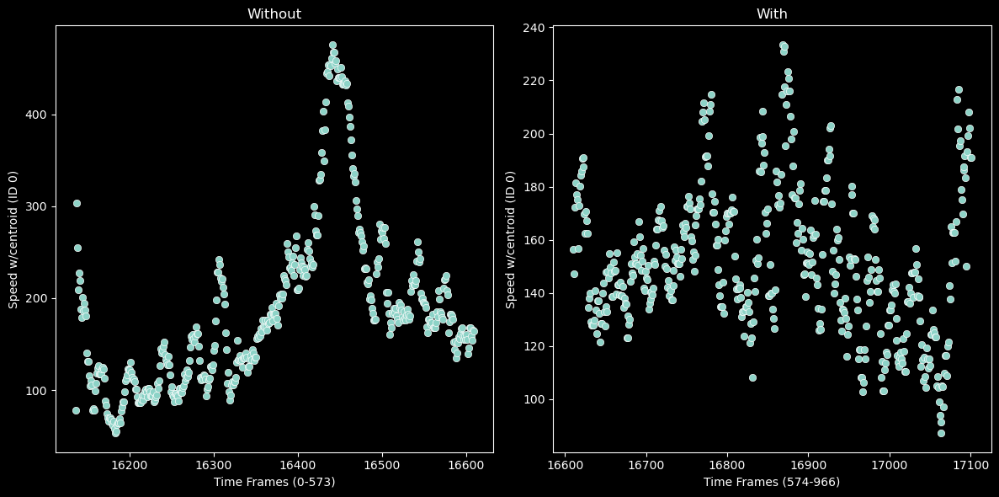

In [44]:
# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(12, 6))

# First scatter plot (frames 574-966)
plt.subplot(1, 2, 2)  # First subplot (left side)
sns.scatterplot(x=range(16610,17102), y=sharks_df['SPEED#wcentroid'].iloc[16610:17102])
plt.title('With')
plt.xlabel('Time Frames (574-966)')
plt.ylabel('Speed w/centroid (ID 0)')

# Second scatter plot (frames 0-573)
plt.subplot(1, 2, 1)  # Second subplot (right side)
sns.scatterplot(x=range(16136,16610), y=sharks_df['SPEED#wcentroid'].iloc[16136:16610])
plt.title('Without')
plt.xlabel('Time Frames (0-573)')
plt.ylabel('Speed w/centroid (ID 0)')

# Show the plots
plt.tight_layout()
plt.show()

In [45]:
def calculate_acceleration(speeds, fps):
    """
    Calculates the acceleration between consecutive speed values.

    :param speeds: List or array of speed values (in meters per second, for example).
    :param fps: Frames per second (FPS) of the data.
    :return: Array of accelerations (one less than the number of speed values).
    """
    time_interval = 1 / fps  # Calculate the time interval between frames
    speeds = np.array(speeds)  # Convert speeds to a numpy array for easy math
    accelerations = (speeds[1:] - speeds[:-1]) / time_interval
    return accelerations

fps = 50  # 50 frames per second

# Access the 'SPEED#wcentroid' column from the DataFrame
speeds = sharks_df['SPEED#wcentroid'].values  # Extract column as numpy array

# Calculate acceleration for the interval 
speeds_interval_1 = speeds[16136:16610]  
accelerations_interval_1 = calculate_acceleration(speeds_interval_1, fps)


# Calculate acceleration for the interval 
speeds_interval_2 = speeds[16610:17102]  
accelerations_interval_2 = calculate_acceleration(speeds_interval_2, fps)


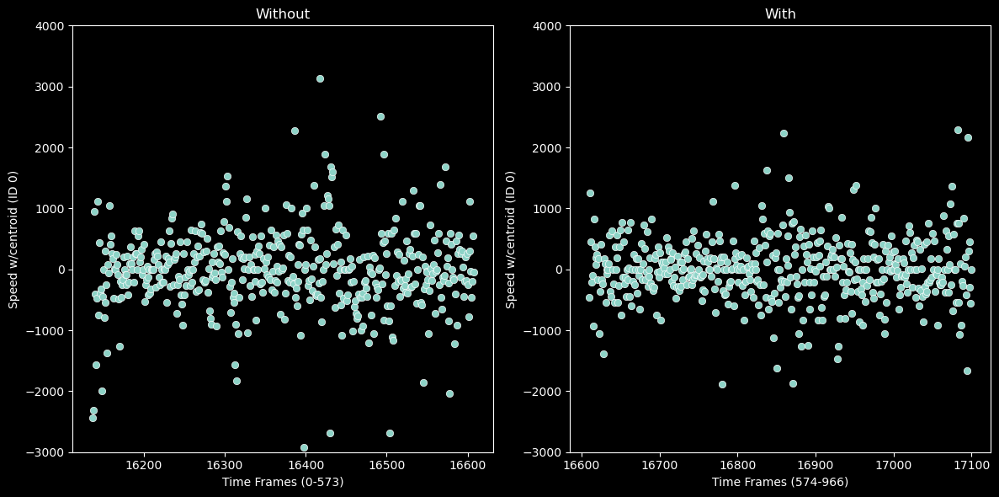

In [46]:
# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(12, 6))

# First scatter plot (frames 574-966)
plt.subplot(1, 2, 2)  # First subplot (right side)
sns.scatterplot(x=range(16610,17101), y=accelerations_interval_2)
plt.title('With')
plt.xlabel('Time Frames (574-966)')
plt.ylabel('Speed w/centroid (ID 0)')
plt.ylim(top=4000, bottom=-3000)  # Limit the y-axis to stop around 4000

# Second scatter plot (frames 0-573)
plt.subplot(1, 2, 1)  # Second subplot (left side)
sns.scatterplot(x=range(16136,16609), y=accelerations_interval_1)
plt.title('Without')
plt.xlabel('Time Frames (0-573)')
plt.ylabel('Speed w/centroid (ID 0)')
plt.ylim(top=4000, bottom=-3000)  # Limit the y-axis to stop around 4000

# Show the plots
plt.tight_layout()
plt.show()

### Analysis in egocentric coordinates
This analysis includes centering and rotating the shark coordinates

,SPEED#wcentroid,ANGLE,frame,time,headx,heady,lxfinx,lxfiny,btipx,btipy,...,pedunclex,peduncley,finx,finy,ttipx,ttipy,X,Y,segment,Trial
ID,,,,,,,,,,,,,,,,,,,,,
0,28649,28649,29221,29221,28649,28649,28649,28649,28649,28649,...,28647,28647,28643,28643,28642,28642,28649,28649,29221,29221
1,29198,29198,29221,29221,29198,29198,29198,29198,29198,29198,...,29198,29198,29198,29198,29198,29198,29198,29198,29221,29221
2,15940,15927,28634,28634,15927,15927,15927,15927,15927,15927,...,15927,15927,15927,15927,15927,15927,15927,15927,28634,28634
3,25650,25645,28595,28595,25645,25645,25632,25632,25632,25632,...,25632,25632,25632,25632,25632,25632,25645,25645,28595,28595
4,68,68,11455,11455,15,15,15,15,15,15,...,68,68,68,68,68,68,68,68,11455,11455
